<a href="https://colab.research.google.com/github/arpanbiswas52/pcVAEBO_pyrochlore/blob/main/data/pcVAEBO__Ho2Ti2O7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Automated Refinement of the Structure parameters of Ho2Ti2O7

- The simulation of generating diffraction data is conducted from GSAS2 software



#Problem Description

Build a physically constrained Variational Autoencoder (pcVAE) assisted BO framework-

- Here we have an experimental set up of refinement of structure parameters of Spin Ice model, to match the experimental results of X-ray diffraction.

- The goal is to do an automated experiment set up through BO model- where we sequnetially learn and adaptively sample towards region of best structure parameters (theory-experiment matching).

- In this notebook, we first set up the BO with 4 control parameters $OccTi$, $UTi$, $OccHo$, $UHo$ -- which is suggested by domain expert.

- The other 4 parameters, $xO1, OccO1, UO1, UO2$ are fixed -- which is suggested by domain expert.


In [ ]:
# NECESSARY MODULES

!pip install botorch
!pip install gpytorch
!pip install smt
!pip install scikit-image
!pip install numpy==1.26.4
!pip install scipy==1.14.0
!pip install matplotlib
!pip install pillow==10.3.0
!pip install torchvision

In [ ]:
#@title Imports
import torch
from torchvision import datasets, transforms
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
import pickle
import random
from skimage.transform import resize
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Import GP and BoTorch functions
import gpytorch as gpt
from botorch.models import SingleTaskGP, ModelListGP
#from botorch.models import gpytorch
from botorch.fit import fit_gpytorch_model
from botorch.models.gpytorch import GPyTorchModel
from botorch.utils import standardize
from gpytorch.distributions import MultivariateNormal
from gpytorch.kernels import ScaleKernel, RBFKernel, MaternKernel, PiecewisePolynomialKernel, PeriodicKernel
from gpytorch.likelihoods import GaussianLikelihood
from gpytorch.means import ConstantMean, LinearMean
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition import UpperConfidenceBound
from botorch.optim import optimize_acqf
from botorch.acquisition import qExpectedImprovement
from botorch.acquisition import ExpectedImprovement
from botorch.sampling import IIDNormalSampler
from botorch.sampling import SobolQMCNormalSampler
from gpytorch.likelihoods.likelihood import Likelihood
from gpytorch.constraints import GreaterThan
from botorch.generation import get_best_candidates, gen_candidates_torch
from botorch.optim import gen_batch_initial_conditions
from gpytorch.models import ExactGP

from smt.sampling_methods import LHS
from torch.optim import SGD
from torch.optim import Adam
from scipy.stats import norm
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

# Import GSAS modules
import os
import sys
sys.path.insert(0, os.path.expanduser(r"C:\Users\USER\gsas2full\GSAS-II\GSASII"))
import GSASIIscriptable as G2sc
from gsas import gsas
import torch.nn as nn

import io
import contextlib
#For experimental analysis

#import WSe2_Target_Extractor as target - Talk to sumner can we import this?

GSAS-II binary directory: C:\Users\USER\gsas2full\GSAS-II\GSASII-bin\win_64_p3.11_n1.26


In [ ]:
# Define the Variational Autoencoder (VAE) architecture
class VAE(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(VAE, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 1000),
            nn.ReLU(),
            nn.Linear(1000, 512),
            nn.ReLU(),
            nn.Linear(512, 256),
            nn.ReLU(),
        )
        self.fc_mu = nn.Linear(256, latent_dim)
        self.fc_logvar = nn.Linear(256, latent_dim)
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 512),
            nn.ReLU(),
            nn.Linear(512, 1000),
            nn.ReLU(),
            nn.Linear(1000, input_dim),
        )

    def encode(self, x):
        h = self.encoder(x)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        logvar = torch.clamp(logvar, min=-10, max=10)  # Clamp to prevent large values
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        decoded = self.decoder(z)
        return torch.abs(decoded)  # Apply absolute value to ensure non-negative outputs

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        reconstructed = self.decode(z)
        return reconstructed, mu, logvar

# Define loss function
def loss_function(reconstructed, original, mu, logvar):
    reconstruction_loss = nn.functional.mse_loss(reconstructed, original, reduction='sum')
    kl_divergence = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return reconstruction_loss + kl_divergence

# Initialize weights with Xavier initialization
def init_weights(m):
    if isinstance(m, nn.Linear):
        torch.nn.init.xavier_uniform_(m.weight)

# Function to train the VAE with loss tracking for convergence plot
def train_vae(vae, dataloader, epochs=2000, lr=0.0001):
    optimizer = optim.Adam(vae.parameters(), lr=lr)
    vae.train()
    loss_history = []  # To store loss for each epoch

    for epoch in range(epochs):
        train_loss = 0
        for batch in dataloader:
            batch_data = batch[0]
            optimizer.zero_grad()
            reconstructed, mu, logvar = vae(batch_data)

            # Calculate the loss
            loss = loss_function(reconstructed, batch_data, mu, logvar)

            # Check for NaN or Inf loss
            if torch.isnan(loss) or torch.isinf(loss):
                print("NaN or Inf loss encountered, stopping training.")
                return

            loss.backward()
            torch.nn.utils.clip_grad_norm_(vae.parameters(), max_norm=1.0)  # Clip gradients
            optimizer.step()
            train_loss += loss.item()

        avg_loss = train_loss / len(dataloader.dataset)
        loss_history.append(avg_loss)  # Append average loss of this epoch
        print(f'Epoch {epoch + 1}, Loss: {avg_loss:.4f}')

    # Plot convergence curve
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, epochs + 1), loss_history, label="Training Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Convergence Curve (Epoch vs. Loss)")
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
# Empty arrays to store F_obs and F_calc reflection lists
# Make sure to run this code block again when re-running code to reset arrays and iteration
# Iteration is just for .gpx filenames, you can ignore it if need be or set it const in gsas script
Fobs = []
Fcalc = []
iteration = 0

# Loading the VAE model, pretrained with X-ray data

- The notebook for the VAE model training and analysis can be found at <Arpan- Joseph, add the link for the VAE final notebook>

In [ ]:
vae = torch.load("vae_full_model.pth", weights_only=False)
#vae = torch.load("vae_full_model.pth")

# Design objective function integrating with pretrained VAE

In [ ]:
def func_obj(X, fixed_param, iteration, pre_trained_model):
    # Run GSAS once to get Fobs_i and Fcalc_i
    #chisq, Fobs_i, Fcalc_i, iteration = gsas(X, fixed_param, iteration)
    _, Fobs_i, Fcalc_i, iteration = gsas(X, fixed_param, iteration)

    # Scaling
    # Scaling
    F_obs_arr = np.asarray(Fobs_i, dtype=float)
    obs_arr = (F_obs_arr * 1000) / F_obs_arr[452]

    F_calc_arr = np.asarray(Fcalc_i, dtype=float)
    calc_arr = (F_calc_arr * 1000) / F_calc_arr[452]

    # Latent representation
    vae.eval()
    with torch.no_grad():
        obs_tensor = torch.tensor(obs_arr, dtype=torch.float32).unsqueeze(0)
        mu_o, logvar_o = pre_trained_model.encode(obs_tensor)
        latent_obs = vae.reparameterize(mu_o, logvar_o).squeeze(0)

        calc_tensor = torch.tensor(calc_arr, dtype=torch.float32).unsqueeze(0)
        mu_c, logvar_c = pre_trained_model.encode(calc_tensor)

        num_samples = 10000 # we are sampling 10,000 times from the latent space
        latent_dim = 7 # same as the latent dimension of the pre-trained model
        latent_samples = torch.zeros((num_samples, latent_dim), dtype=torch.float32)

        for k in range(num_samples):
            z_c = vae.reparameterize(mu_c, logvar_c).squeeze(0)
            latent_samples[k] = z_c

        sum_latents_calc = torch.sum(latent_samples, dim=0)
        mean_latent_calc = sum_latents_calc / num_samples

    # chi-square calculation
    diff = latent_obs - mean_latent_calc
    chisq_l = torch.sqrt(torch.sum(diff**2) / (latent_dim - 1))
    print('latent_obs:', latent_obs)
    print('mean_latent_calc:', mean_latent_calc)

    ####################################################################################################################
        # Cal chisq_scaled
    diff  = F_obs_arr - F_calc_arr
    chisq = np.sqrt(np.sum(diff**2) / (len(obs_arr) - 1))
    chisq = chisq/1000
    print('chisq_scaled:', chisq)


    """
    plt.figure()
    plt.scatter(Fobs_i, Fcalc_i, alpha=0.7, s=10, label='Data Points')
    min_val = min(min(Fobs_i), min(Fcalc_i))
    max_val = max(max(Fobs_i), max(Fcalc_i))
    plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='y = x')

    plt.xlabel('unscaled Fobs_i')
    plt.ylabel('unscaled Fcalc_i')
    plt.title('unscaled Fobs_i vs unscaled Fcalc_i')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    """
    ####################################################################################################################

    # Fobs_i, Fcalc_i plot in the original space
    plt.figure()
    plt.scatter(obs_arr, calc_arr, alpha=0.7, s=10, label='Data Points')
    min_val = min(min(obs_arr), min(calc_arr))
    max_val = max(max(obs_arr), max(obs_arr))
    plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='y = x')

    plt.xlabel('Fobs_i')
    plt.ylabel('calc_i')
    plt.title('Fobs_i vs Fcalc_i')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure()
    for k in range(num_samples):
        plt.plot(range(latent_dim), latent_samples[k], alpha=0.1, linewidth=0.2)
    plt.xlabel('Latent Dimension Index')
    plt.ylabel('Latent Values')
    plt.title('10,000 Latent Realizations')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


    # 10 of the the latent realizations
    print("First 10 latent vectors from the VAE:")
    for i in range(10):
        print(f"Sample {i+1}: {latent_samples[i].tolist()}")

    print("chisq_l:", chisq_l)
    return chisq_l, chisq

Below section defines the list of functions (user calls these functions during analysis):
1. Gaussian Process
2. Optimimize Hyperparameter of Gaussian Process (using Adam optimizer)
3. Posterior means and variance computation
4. Acquistion functions for BO- Expected Improvmement

In [ ]:
class SimpleCustomGP(ExactGP, GPyTorchModel):
    _num_outputs = 1  # to inform GPyTorchModel API

    def __init__(self, train_X, train_Y):
        # squeeze output dim before passing train_Y to ExactGP
        super().__init__(train_X, train_Y.squeeze(-1), GaussianLikelihood())
        self.mean_module = ConstantMean()
        #self.mean_module = LinearMean(train_X.shape[-1])
        self.covar_module = ScaleKernel(
            #base_kernel=MaternKernel(nu=0.5, ard_num_dims=train_X.shape[-1]),
            #base_kernel=RBFKernel(ard_num_dims=train_X.shape[-1]),
            # base_kernel=PeriodicKernel(ard_num_dims=train_X.shape[-1])
            base_kernel = PiecewisePolynomialKernel(power = 2, ard_num_dims=train_X.shape[-1]),
        )
        self.to(train_X)  # make sure we're on the right device/dtype

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return MultivariateNormal(mean_x, covar_x)


#Optimize Hyperparameters of GP#
def optimize_hyperparam_trainGP(train_X, train_Y):
    # Gp model fit

    gp_surro = SimpleCustomGP(train_X, train_Y)
    gp_surro = gp_surro.double()
    gp_surro.likelihood.noise_covar.register_constraint("raw_noise", GreaterThan(1e-1))
    mll1 = ExactMarginalLogLikelihood(gp_surro.likelihood, gp_surro)
    # fit_gpytorch_model(mll)
    mll1 = mll1.to(train_X)
    gp_surro.train()
    gp_surro.likelihood.train()
    ## Here we use Adam optimizer with learning rate =0.1, user can change here with different algorithm and/or learning rate for each GP
    optimizer1 = Adam([{'params': gp_surro.parameters()}], lr=0.1, weight_decay = 0.01)
    #optimizer1 = SGD([{'params': gp_surro.parameters()}], lr=0.0001)

    NUM_EPOCHS = 300

    for epoch in range(NUM_EPOCHS):
        # clear gradients
        optimizer1.zero_grad()
        # forward pass through the model to obtain the output MultivariateNormal
        output1 = gp_surro(train_X)
        # Compute negative marginal log likelihood
        loss1 = - mll1(output1, gp_surro.train_targets)
        # back prop gradients
        loss1.backward(retain_graph=True)
        # print last iterations
        if (epoch + 1) > NUM_EPOCHS: #Stopping the print for now
            print("GP Model trained:")
            print("Iteration:" + str(epoch + 1))
            print("Loss:" + str(loss1.item()))
            # print("Length Scale:" +str(gp_PZO.covar_module.base_kernel.lengthscale.item()))
            print("noise:" + str(gp_surro.likelihood.noise.item()))

        optimizer1.step()

    gp_surro.eval()
    gp_surro.likelihood.eval()
    return gp_surro



#GP posterior predictions#
def cal_posterior(gp_surro, test_X, X, norm=False):

    X1, X2, X3, X4 = X[0], X[1], X[2], X[3]
    X1, X2, X3, X4 = torch.meshgrid(X1, X2, X3, X4)

    if (norm=="True"):
        X1 = (X1 - torch.min(X1))/(torch.max(X1)-torch.min(X1))
        X2 = (X2 - torch.min(X2))/(torch.max(X2)-torch.min(X2))
        X3 = (X3 - torch.min(X3))/(torch.max(X3)-torch.min(X3))
        X4 = (X4 - torch.min(X4))/(torch.max(X4)-torch.min(X4))

    #print(X1, X2, X3, X4)
    y_pred_means_mat = torch.empty(len(test_X), 1) # Format for numerical cal
    y_pred_means_mesh = torch.empty(X1.shape) #Format for visualization
    y_pred_vars_mat = torch.empty(len(test_X), 1)
    y_pred_vars_mesh = torch.empty(X1.shape)
    t_X = torch.empty(1, test_X.shape[1])

    with torch.no_grad(), gpt.settings.max_lanczos_quadrature_iterations(32), \
        gpt.settings.fast_computations(covar_root_decomposition=False, log_prob=False,
                                                  solves=True), \
        gpt.settings.max_cg_iterations(100), \
        gpt.settings.max_preconditioner_size(80), \
        gpt.settings.num_trace_samples(128):
        for t in range(0, len(test_X)):

            for i in range(0, test_X.shape[1]):
                t_X[:, i] = test_X[t, i]
            #t_X = test_X.double()
            y_pred_surro = gp_surro.posterior(t_X)
            y_pred_means_mat[t, 0] = y_pred_surro.mean
            y_pred_vars_mat[t, 0] = y_pred_surro.variance


        for t1, (x1, x2, x3, x4) in enumerate(zip(X1, X2, X3, X4)):
            for t2, (xx1, xx2, xx3, xx4) in enumerate(zip(x1, x2, x3, x4)):
                for t3, (xxx1, xxx2, xxx3, xxx4) in enumerate(zip(xx1, xx2, xx3, xx4)):
                    for t4, (xxxx1, xxxx2, xxxx3, xxxx4) in enumerate(zip(xxx1, xxx2, xxx3, xxx4)):

                        t_X[:, 0] = xxxx1
                        t_X[:, 1] = xxxx2
                        t_X[:, 2] = xxxx3
                        t_X[:, 3] = xxxx4
                        #t_X = test_X.double()
                        y_pred_surro = gp_surro.posterior(t_X)
                        y_pred_means_mesh[t1, t2, t3, t4] = y_pred_surro.mean
                        y_pred_vars_mesh[t1, t2, t3, t4] = y_pred_surro.variance

    y_pred_means = [y_pred_means_mat, y_pred_means_mesh]
    y_pred_vars = [y_pred_vars_mat, y_pred_vars_mesh]
    return y_pred_means, y_pred_vars


#EI acquistion function#
def acqmanEI(y_means, y_vars, train_Y, ieval, ismin=False):


    y_means = y_means.detach().numpy()
    y_vars = y_vars.detach().numpy()
    y_std = np.sqrt(y_vars)
    if ismin == "True":
        train_Y = - train_Y
        y_means = - y_means
    fmax = train_Y.max()
    fmax = fmax.detach().numpy()
    best_value = fmax
    EI_val = np.zeros(len(y_vars))
    Z = np.zeros(len(y_vars))
    eta = 0.01

    for i in range(0, len(y_std)):
        if (y_std[i] <=0):
            EI_val[i] = 0
        else:
            Z[i] =  (y_means[i]-best_value-eta)/y_std[i]
            EI_val[i] = (y_means[i]-best_value-eta)*norm.cdf(Z[i]) + y_std[i]*norm.pdf(Z[i])

    # Eliminate evaluated samples from consideration to avoid repeatation in future sampling
    EI_val[ieval] = -1
    acq_val = np.max(EI_val)
    acq_cand = [k for k, j in enumerate(EI_val) if j == acq_val]
    #print(acq_val)
    print("EI:",EI_val)
    #print("ymeans:",y_means)
    #print("best value:", best_value)
    return acq_cand, acq_val, EI_val

#Other list of functions-

1. Evaluate initial data and normalize all data
2. Evaluate functions for new data and augment data

In [ ]:
def normalize_get_initialdata_SpinIce(X, fix_params, num, m):

    X_feas = torch.empty((X[0].shape[0]*X[1].shape[0]*X[2].shape[0]*X[3].shape[0], 4))
    k=0

    for t1 in range(0, X[0].shape[0]):
        for t2 in range(0, X[1].shape[0]):
          for t3 in range(0, X[2].shape[0]):
            for t4 in range(0, X[3].shape[0]):
                X_feas[k, 0] = X[0][t1]
                X_feas[k, 1] = X[1][t2]
                X_feas[k, 2] = X[2][t3]
                X_feas[k, 3] = X[3][t4]
                k=k+1

    X_feas_norm = torch.empty((X_feas.shape[0], X_feas.shape[1]))


    # Normalize X
    for i in range(0, X_feas.shape[1]):
        X_feas_norm[:, i] = (X_feas[:, i] - torch.min(X_feas[:, i])) / (torch.max(X_feas[:, i]) - torch.min(X_feas[:, i]))

    #print(X_feas)
    #print(X_feas_norm)

    # Select starting samples randomly as training data
    np.random.seed(0)
    idx = np.random.randint(0, len(X_feas), num) # insert latin hypercube
    train_X = X_feas[idx]
    train_X_norm = X_feas_norm[idx]

    #a = torch.tensor([1, 0, 1, 0]) # Initial parameter
    #a =[OccTi, UTi, OccHo, UHo]
    a = torch.tensor([0.9, 0, 0.917277, 0.003292]) # Optimal parameter from BO
    a_norm = torch.empty((1, X_feas.shape[1]))
    for i in range(0, X_feas.shape[1]):
       a_norm[0, i] = (a[i] - torch.min(X_feas[:, i])) / (torch.max(X_feas[:, i]) - torch.min(X_feas[:, i]))
    train_X = torch.vstack((train_X, a))
    train_X_norm = torch.vstack((train_X_norm, a_norm))

    train_Y = torch.empty((train_X.shape[0], 1))
    train_chisq = torch.empty((train_X.shape[0], 1))
    #print(train_X)
    #print(train_X_norm)

    #Evaluate initial training data
    x = torch.empty((1,train_X.shape[1]))

    for i in range(0, train_X.shape[0]):
        for j in range(0, train_X.shape[1]):
          x[0, j] = train_X[i, j]
        print("Function eval #" + str(m + 1))

        train_Y[i, 0], train_chisq[i, 0] = func_obj(x, fix_params, iteration, pre_trained_model = vae) # pass to the function where we will connect to experiments
        m = m + 1

    #print(train_Y)

    return X_feas, X_feas_norm, train_X, train_X_norm, train_Y, train_chisq, idx, m

In [ ]:
################################Augment data - Existing training data with new evaluated data################################
def augment_newdata_SpinIce(acq_X, acq_X_norm, train_X, train_X_norm, train_Y, train_chisq, fix_params, m):

    nextX = acq_X
    nextX_norm = acq_X_norm
    #train_X_norm = torch.cat((train_X_norm, nextX_norm), 0)
    #train_X_norm = train_X_norm.double()
    train_X_norm = torch.vstack((train_X_norm, nextX_norm))
    train_X = torch.vstack((train_X, nextX))

    x = torch.empty((1,train_X.shape[1]))
    for j in range(0, train_X.shape[1]):
        x[0, j] = train_X[-1, j]


    print("Function eval #" + str(m + 1))
    next_feval = torch.empty(1, 1)
    next_chisq = torch.empty(1, 1)
    next_feval[0, 0], next_chisq[0, 0] = func_obj(x, fix_params, iteration, pre_trained_model = vae) # pass to the function where we will connect to experiments
    train_Y = torch.vstack((train_Y, next_feval))
    train_chisq= torch.vstack((train_chisq, next_chisq))

    m = m + 1
    return train_X, train_X_norm, train_Y, train_chisq, m

In [ ]:
def plot_iteration_results(train_X, train_X_norm, train_Y, test_X, test_X_norm, y_pred_means, y_pred_vars, fix_params, i):
    # To minimization
    y_pred_means_mat, y_pred_means_mesh = y_pred_means[0], y_pred_means[1]
    y_pred_vars_mat, y_pred_vars_mesh = y_pred_vars[0], y_pred_vars[1]

    # Return to original scale
    y_pred_means_mat = y_pred_means_mat*(torch.max(train_Y)-torch.min(train_Y))+ torch.min(train_Y)
    #y_pred_vars_mat = y_pred_vars_mat*(torch.max(train_Y)-torch.min(train_Y))+ torch.min(train_Y)
    y_pred_means_mesh = y_pred_means_mesh*(torch.max(train_Y)-torch.min(train_Y))+ torch.min(train_Y)
    #y_pred_vars_mesh = y_pred_vars_mesh*(torch.max(train_Y)-torch.min(train_Y))+ torch.min(train_Y)
    #Best solution among the evaluated data

    best_Y = torch.min(train_Y)
    ind = torch.argmin(train_Y)
    X_opt = torch.empty((1,train_X.shape[1]))
    X_opt_norm = torch.empty((1,train_X.shape[1]))
    for j in range(0, train_X.shape[1]):
        X_opt[0, j] = train_X[ind, j]
        X_opt_norm[0, j] = train_X_norm[ind, j]


    # Best estimated solution from GP model considering the non-evaluated solution

    best_estY = torch.min(y_pred_means_mat)
    ind = torch.argmin(y_pred_means_mat)
    X_opt_GP = torch.empty((1,test_X.shape[1]))
    X_opt_GP_norm = torch.empty((1,test_X.shape[1]))
    for j in range(0, test_X.shape[1]):
        X_opt_GP[0, j] = test_X[ind, j]
        X_opt_GP_norm[0, j] = test_X_norm[ind, j]

    #Print results
    print("#########################################################")
    print("Current best solutions at iteration:" + str(i))
    print("Best params among evaluated samples:")
    print(X_opt, torch.round(best_Y, decimals= 2))
    print("Best params from GP map:")
    print(X_opt_GP, torch.round(best_estY, decimals= 2))

    #Plot results
    #Task to do
    plt.figure()

    fig,ax=plt.subplots(ncols=6, nrows= 2, figsize=(20,8))
    k = 0

    """
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    divider = make_axes_locatable(ax[0])
    cax = divider.append_axes("right", size="5%", pad=0.3)
    fig.colorbar(im1, cax=cax, orientation='vertical')
    """

    # Y vs X in all plot
    # UTi vs OccTi
    ymeans_x1x2 = torch.nanmean(torch.nanmean(y_pred_means_mesh, dim = 3), dim = 2)
    yvars_x1x2 = torch.nanmean(torch.nanmean(y_pred_vars_mesh, dim = 3), dim = 2)
    ymeans_x1x2 = torch.round(ymeans_x1x2, decimals= 2)
    yvars_x1x2 = torch.round(yvars_x1x2, decimals =2)

    #a = ax[0].imshow(y_pred_means_mesh[:, :, 0, 0].detach().numpy(), origin='bottom', cmap='viridis')
    ax[0, 0].imshow(ymeans_x1x2.detach().numpy(), origin='lower', cmap='viridis', extent = (0, 1, 0.9, 1.1))
    x2graph = 10*train_X[:,1]
    a=ax[0, 0].scatter(x2graph, train_X[:,0], c=train_Y, marker='o', cmap='Reds')
    #ax[0, 0].scatter(X_opt[0, 0], X_opt[0, 1], marker='x', c='r')
    #ax[0, 0].scatter(X_opt_GP[0, 0], X_opt_GP[0, 1], marker='o', c='r')
    #divider = make_axes_locatable(ax[0, 0])
    #cax = divider.append_axes('bottom', size='5%', pad=0.25)
    fig.colorbar(a, orientation='horizontal')
    ax[0, 0].set_title('UisoTi vs OccTi: Obj Mean')

    #b = ax[1].imshow(y_pred_vars_mesh[:, :, 0, 0].detach().numpy(), origin='bottom', cmap='viridis')
    b = ax[1, 0].imshow(yvars_x1x2.detach().numpy(), origin='lower', cmap='viridis', extent = (0, 1, 0.9, 1.1))
    #divider = make_axes_locatable(ax[1, 0])
    #cax = divider.append_axes('bottom', size='5%', pad=0.25)
    fig.colorbar(b, orientation='horizontal')
    ax[1, 0].set_title('UisoTi vs OccTi: Obj Var')
    # Make axes boxes square (same on-screen size), let data fill them


    #############################################

    #OccHo vs OccTi
    ymeans_x1x2 = torch.nanmean(torch.nanmean(y_pred_means_mesh, dim = 3), dim = 1)
    yvars_x1x2 = torch.nanmean(torch.nanmean(y_pred_vars_mesh, dim = 3), dim = 1)
    ymeans_x1x2 = torch.round(ymeans_x1x2, decimals= 2)
    yvars_x1x2 = torch.round(yvars_x1x2, decimals =2)
    #a = ax[0].imshow(y_pred_means_mesh[:, :, 0, 0].detach().numpy(), origin='bottom', cmap='viridis')
    ax[0, 1].imshow(ymeans_x1x2.detach().numpy(), origin='lower', cmap='viridis', extent=(0.9, 1.1, 0.9, 1.1))
    a=ax[0, 1].scatter(train_X[:,2], train_X[:,0], c=train_Y, marker='o', cmap='Reds')
    #ax[0, 1].scatter(X_opt[0, 0], X_opt[0, 2], marker='x', c='r')
    #ax[0, 1].scatter(X_opt_GP[0, 0], X_opt_GP[0, 2], marker='o', c='r')
    #divider = make_axes_locatable(ax[0, 1])
    #cax = divider.append_axes('bottom', size='5%', pad=0.25)
    fig.colorbar(a, orientation='horizontal')
    ax[0, 1].set_title('OccHo vs OccTi: Obj Mean')

    #b = ax[1].imshow(y_pred_vars_mesh[:, :, 0, 0].detach().numpy(), origin='bottom', cmap='viridis')
    b = ax[1, 1].imshow(yvars_x1x2.detach().numpy(), origin='lower', cmap='viridis', extent=(0.9, 1.1, 0.9, 1.1))
    # divider = make_axes_locatable(ax[1, 1])
    # cax = divider.append_axes('bottom', size='5%', pad=0.25)
    fig.colorbar(b, orientation='horizontal')
    ax[1, 1].set_title('OccHo vs OccTi: Obj Var')
    # Make axes boxes square (same on-screen size), let data fill them

    #############################################

    #UHo vs OccTi
    ymeans_x1x2 = torch.nanmean(torch.nanmean(y_pred_means_mesh, dim = 2), dim = 1)
    yvars_x1x2 = torch.nanmean(torch.nanmean(y_pred_vars_mesh, dim = 2), dim = 1)
    ymeans_x1x2 = torch.round(ymeans_x1x2, decimals= 2)
    yvars_x1x2 = torch.round(yvars_x1x2, decimals =2)
    #a = ax[0].imshow(y_pred_means_mesh[:, :, 0, 0].detach().numpy(), origin='bottom', cmap='viridis')
    ax[0, 2].imshow(ymeans_x1x2.detach().numpy(), origin='lower', cmap='viridis', extent=(0, 1, 0.9, 1.1))
    x2graph = 10*train_X[:,3]
    a=ax[0, 2].scatter(x2graph,train_X[:,0], c=train_Y, marker='o', cmap='Reds')
    #ax[0, 2].scatter(X_opt[0, 0], X_opt[0, 3], marker='x', c='r')
    #ax[0, 2].scatter(X_opt_GP[0, 0], X_opt_GP[0, 3], marker='o', c='r')
    #divider = make_axes_locatable(ax[0, 2])
    #cax = divider.append_axes('bottom', size='5%', pad=0.25)
    fig.colorbar(a, orientation='horizontal')
    ax[0, 2].set_title('UisoHo vs OccTi: Obj Mean')

    #b = ax[1].imshow(y_pred_vars_mesh[:, :, 0, 0].detach().numpy(), origin='bottom', cmap='viridis')
    b = ax[1, 2].imshow(yvars_x1x2.detach().numpy(), origin='lower', cmap='viridis', extent=(0, 1, 0.9, 1.1))
    #divider = make_axes_locatable(ax[1, 2])
    #cax = divider.append_axes('bottom', size='5%', pad=0.25)
    fig.colorbar(b, orientation='horizontal')
    ax[1, 2].set_title('UisoHo vs OccTi: Obj Var')
    # Make axes boxes square (same on-screen size), let data fill them


    #############################################

    ymeans_x1x2 = torch.nanmean(torch.nanmean(y_pred_means_mesh, dim = 3), dim = 0)
    yvars_x1x2 = torch.nanmean(torch.nanmean(y_pred_vars_mesh, dim = 3), dim = 0)
    ymeans_x1x2 = torch.round(ymeans_x1x2, decimals= 2)
    yvars_x1x2 = torch.round(yvars_x1x2, decimals =2)
    #a = ax[0].imshow(y_pred_means_mesh[:, :, 0, 0].detach().numpy(), origin='bottom', cmap='viridis')
    ax[0, 3].imshow(ymeans_x1x2.detach().numpy(), origin='lower', cmap='viridis', extent=(0.9, 1.1, 0.0, 1.0))
    x2graph = 10*train_X[:,1]
    a=ax[0, 3].scatter(train_X[:,2], x2graph, c=train_Y, marker='o', cmap='Reds')
    #ax[0, 3].scatter(X_opt[0, 1], X_opt[0, 2], marker='x', c='r')
    #ax[0, 3].scatter(X_opt_GP[0, 1], X_opt_GP[0, 2], marker='o', c='r')
    #divider = make_axes_locatable(ax[0, 3])
    #cax = divider.append_axes('bottom', size='5%', pad=0.25)
    fig.colorbar(a, orientation='horizontal')
    ax[0, 3].set_title('OccHo vs UisoTi: Obj Mean')

    #b = ax[1].imshow(y_pred_vars_mesh[:, :, 0, 0].detach().numpy(), origin='bottom', cmap='viridis')
    b = ax[1, 3].imshow(yvars_x1x2.detach().numpy(), origin='lower', cmap='viridis', extent=(0.9, 1.1, 0.0, 1.0))
    #divider = make_axes_locatable(ax[1, 3])
    #cax = divider.append_axes('bottom', size='5%', pad=0.25)
    fig.colorbar(b, orientation='horizontal')
    ax[1, 3].set_title('OccHo vs UisoTi: Ovj Var')
    # Make axes boxes square (same on-screen size), let data fill them


    """
    #OccHo vs UTi
    ymeans_x1x2 = torch.nanmean(torch.nanmean(y_pred_means_mesh, dim = 3), dim = 0)
    yvars_x1x2 = torch.nanmean(torch.nanmean(y_pred_vars_mesh, dim = 3), dim = 0)
    ymeans_x1x2 = torch.round(ymeans_x1x2, decimals= 2)
    yvars_x1x2 = torch.round(yvars_x1x2, decimals =2)
    #a = ax[0].imshow(y_pred_means_mesh[:, :, 0, 0].detach().numpy(), origin='bottom', cmap='viridis')
    ax[0, 3].imshow(ymeans_x1x2.detach().numpy(), origin='lower', cmap='viridis', extent=(0.0, 1.0, 0.5, 1.5))
    x2graph = 10*train_X[:,1]
    a=ax[0, 3].scatter(x2graph, train_X[:,2], c=train_Y, marker='o', cmap='Reds')
    #ax[0, 3].scatter(X_opt[0, 1], X_opt[0, 2], marker='x', c='r')
    #ax[0, 3].scatter(X_opt_GP[0, 1], X_opt_GP[0, 2], marker='o', c='r')
    #divider = make_axes_locatable(ax[0, 3])
    #cax = divider.append_axes('bottom', size='5%', pad=0.25)
    fig.colorbar(a, orientation='horizontal')
    ax[0, 3].set_title('UisoTi vs OccHo: Obj Mean')

    #b = ax[1].imshow(y_pred_vars_mesh[:, :, 0, 0].detach().numpy(), origin='bottom', cmap='viridis')
    b = ax[1, 3].imshow(yvars_x1x2.detach().numpy(), origin='lower', cmap='viridis', extent=(0.0, 1.0, 0.5, 1.5))
    #divider = make_axes_locatable(ax[1, 3])
    #cax = divider.append_axes('bottom', size='5%', pad=0.25)
    fig.colorbar(b, orientation='horizontal')
    ax[1, 3].set_title('UisoTi vs OccHo: Ovj Var')
    """
    #############################################

    #UTi vs UHo
    ymeans_x1x2 = torch.nanmean(torch.nanmean(y_pred_means_mesh, dim = 2), dim = 0)
    yvars_x1x2 = torch.nanmean(torch.nanmean(y_pred_vars_mesh, dim = 2), dim = 0)
    ymeans_x1x2 = torch.round(ymeans_x1x2, decimals= 2)
    yvars_x1x2 = torch.round(yvars_x1x2, decimals =2)
    #a = ax[0].imshow(y_pred_means_mesh[:, :, 0, 0].detach().numpy(), origin='bottom', cmap='viridis')
    ax[0, 4].imshow(ymeans_x1x2.detach().numpy(), origin='lower', cmap='viridis', extent=(0, 0.1, 0, 0.1))
    a=ax[0, 4].scatter(train_X[:,3], train_X[:,1], c=train_Y, marker='o', cmap='Reds')
    #ax[0, 4].scatter(X_opt[0, 1], X_opt[0, 3], marker='x', c='r')
    #ax[0, 4].scatter(X_opt_GP[0, 1], X_opt_GP[0, 3], marker='o', c='r')
    #divider = make_axes_locatable(ax[0, 4])
    #cax = divider.append_axes('bottom', size='5%', pad=0.25)
    fig.colorbar(a, orientation='horizontal')
    ax[0, 4].set_title('UisoHo vs UisoTi: Obj Mean')

    #b = ax[1].imshow(y_pred_vars_mesh[:, :, 0, 0].detach().numpy(), origin='bottom', cmap='viridis')
    b = ax[1, 4].imshow(yvars_x1x2.detach().numpy(), origin='lower', cmap='viridis', extent=(0, 0.1, 0, 0.1))
    #divider = make_axes_locatable(ax[1, 4])
    #cax = divider.append_axes('bottom', size='5%', pad=0.25)
    fig.colorbar(b, orientation='horizontal')
    ax[1, 4].set_title('UisoHo vs UisoTi: Obj Var')
    # Make axes boxes square (same on-screen size), let data fill them


    #############################################

    #OccHo vs UHo
    ymeans_x1x2 = torch.nanmean(torch.nanmean(y_pred_means_mesh, dim = 1), dim = 0)
    yvars_x1x2 = torch.nanmean(torch.nanmean(y_pred_vars_mesh, dim = 1), dim = 0)
    ymeans_x1x2 = torch.round(ymeans_x1x2, decimals= 2)
    yvars_x1x2 = torch.round(yvars_x1x2, decimals =2)
    #a = ax[0].imshow(y_pred_means_mesh[:, :, 0, 0].detach().numpy(), origin='bottom', cmap='viridis')
    ax[0, 5].imshow(ymeans_x1x2.detach().numpy(), origin='lower', cmap='viridis', extent=(0, 1, 0.9, 1.1))
    x2graph = 10*train_X[:,3]
    a=ax[0, 5].scatter(x2graph, train_X[:,2], c=train_Y, marker='o', cmap='Reds')
    #ax[0, 5].scatter(X_opt[0, 2], X_opt[0, 3], marker='x', c='r')
    #ax[0, 5].scatter(X_opt_GP[0, 2], X_opt_GP[0, 3], marker='o', c='r')
    #divider = make_axes_locatable(ax[0, 5])
    #cax = divider.append_axes('bottom', size='5%', pad=0.25)
    fig.colorbar(a, orientation='horizontal')
    ax[0, 5].set_title('UisoHo vs OccHo: Obj Mean')

    #b = ax[1].imshow(y_pred_vars_mesh[:, :, 0, 0].detach().numpy(), origin='bottom', cmap='viridis')
    b = ax[1, 5].imshow(yvars_x1x2.detach().numpy(), origin='lower', cmap='viridis', extent=(0, 1, 0.9, 1.1))
    #divider = make_axes_locatable(ax[1, 5])
    #cax = divider.append_axes('bottom', size='5%', pad=0.25)
    fig.colorbar(b, orientation='horizontal')
    ax[1, 5].set_title('UisoHo vs OccHo: Obj Var')

    # Make every subplot in `ax` a square box (same on-screen width/height)
    for axi in (ax.flat if hasattr(ax, "flat") else (ax,)):
        axi.set_aspect('auto')    # don't force 1:1 data units
        axi.set_box_aspect(1)     # square axes box (mpl ≥ 3.3)

    plt.show()

    return X_opt, X_opt_GP

In [ ]:
def norm_fun(x):
    x = (x-torch.min(x))/(torch.max(x)-torch.min(x))
    #print(x)
    return x

In [ ]:
def rev_norm(x, train_Y):
    #print(torch.max(train_Y)
    x = x*(torch.max(train_Y)-torch.min(train_Y))+ torch.min(train_Y)
    #print(x)
    return x

In [ ]:
#@title BO framework- Integrating the above functions
def BO_SpinIce(X, fix_params, num_start, N):
    num = num_start
    m = 0
    # Initialization: evaluate few initial data normalize data
    test_X, test_X_norm, train_X, train_X_norm, train_Y, train_chisq, idx, m = \
        normalize_get_initialdata_SpinIce(X, fix_params, num, m)


    print("Initial evaluation complete. Start BO")
    ## Gp model fit
    # Calling function to fit and optimizize Hyperparameter of Gaussian Process (using Adam optimizer)
    # Input args- Torch arrays of normalized training data, parameter X and objective eval Y
    # Output args- Gaussian process model lists
    # gp_surro = optimize_hyperparam_trainGP(train_X, train_Y)
    # NORMALIZE train_Y
    train_y_norm = norm_fun(train_Y)
    gp_surro = optimize_hyperparam_trainGP(train_X_norm, train_y_norm) # normalized x NORMALIZE train_Y

    for i in range(1, N + 1):
        # Calculate posterior for analysis for intermidiate iterations
        #y_pred_means, y_pred_vars = cal_posterior(gp_surro, test_X, X, norm = "False")
        y_pred_means, y_pred_vars = cal_posterior(gp_surro, test_X_norm, X, norm = "True")
        y_pred_means_mat, y_pred_means_mesh = y_pred_means[0], y_pred_means[1]
        y_pred_vars_mat, y_pred_vars_mesh = y_pred_vars[0], y_pred_vars[1]

        if ((i == 1) or ((i % 10) == 0)):
            #y_pred_means_real = rev_norm(y_pred_means, train_Y)
            #y_pred_vars_real = rev_norm(y_pred_vars, train_Y)
            # Plotting functions to check the current state exploration and Pareto fronts
            X_eval, X_GP = plot_iteration_results(train_X, train_X_norm, train_Y, test_X, test_X_norm, y_pred_means, y_pred_vars, fix_params, i)

        #print(idx)b
        acq_cand, acq_val, EI_val = acqmanEI(y_pred_means_mat, y_pred_vars_mat, train_y_norm, idx, ismin="True") # NORMALIE Y HERE
        val = acq_val
        ind = np.random.choice(acq_cand) # When multiple points have same acq values
        idx = np.hstack((idx, ind))


        ################################################################
        ## Find next point which maximizes the learning through exploration-exploitation
        if (i == 1):
            val_ini = val
        # Check for convergence
        if ((val) == 0):  # Stop for negligible expected improvement
            print("Model converged due to sufficient learning over search space ")
            break
        else:
            nextX = torch.empty((1, len(X)))
            nextX_norm = torch.empty(1, len(X))
            nextX[0,:] = test_X[ind, :]
            nextX_norm [0, :] = test_X_norm[ind, :]

            # Evaluate true function for new data, augment data
            train_X, train_X_norm, train_Y, train_chisq, m=\
             augment_newdata_SpinIce(nextX, nextX_norm, train_X, train_X_norm, train_Y, train_chisq, fix_params, m) # NORMALIZE train_Y

            # Gp model fit
            # Updating GP with augmented training data
            # gp_surro = optimize_hyperparam_trainGP(train_X, train_Y)
            train_y_norm = norm_fun(train_Y)
            gp_surro = optimize_hyperparam_trainGP(train_X_norm, train_y_norm) # PASS NORM Y

    ## Final posterior prediction after all the sampling done

    if (i == N):
        print("Max. sampling reached, model stopped")


    # --- PLOT FOR train_Y & train_chisq ---
    import pandas as pd
    import matplotlib.pyplot as plt

    # Ensure train_Y and train_chisq are 1D
    train_Y = train_Y.ravel()
    train_chisq = train_chisq.ravel()

    # build history table
    df_history = pd.DataFrame({
        'iteration': range(1, len(train_Y) + 1),
        'train_Y':     train_Y,
        'chi_square':  train_chisq
    })

    print(df_history)

    # plot train_Y convergence
    plt.figure()
    plt.plot(
        df_history['iteration'],
        df_history['train_Y'],
        marker='o'
    )
    plt.xlabel('Iteration')
    plt.ylabel('train_Y')
    plt.title('train_Y Convergence')
    plt.grid(True)
    plt.show()

    # plot chi-square convergence
    plt.figure()
    plt.plot(
        df_history['iteration'],
        df_history['chi_square'],
        marker='o'
    )
    plt.xlabel('Iteration')
    plt.ylabel('Chi-square')
    plt.title('Chi-square Convergence')
    plt.grid(True)
    plt.show()
    # ------------END OF PLOT-------------------------------------------


    #Optimal GP learning
    gp_opt = gp_surro
    # Posterior calculation with converged GP model
    # y_pred_means, y_pred_vars = cal_posterior(gp_opt, test_X, X, norm = "False")
    y_pred_means, y_pred_vars = cal_posterior(gp_opt, test_X_norm, X, norm = "True")
    #print("y_pred_means:",y_pred_means)
    #print("y_pred_vars:",y_pred_vars)
    # Plotting functions to check final iteration
    #y_pred_means_real = rev_norm(y_pred_means, train_Y)
    #y_pred_vars_real = rev_norm(y_pred_vars, train_Y)
    X_opt, X_opt_GP = plot_iteration_results(train_X, train_X_norm, train_Y, test_X, test_X_norm, y_pred_means, y_pred_vars, fix_params, i)

    return  X_opt, X_opt_GP, train_X, train_Y, train_chisq, y_pred_means, y_pred_vars

# Analysis

Function eval #1
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9399999976158142, 0.0, 1.0199999809265137, 0.03999999910593033]
[0.421597, 0.920386, 0.008262, 0.00325]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 1.4473
initial chi^2 3.635e+05 with 2596 obs.
divergence: chi^2 4.2354e+05 on 2596 obs. (0 SVD zeros)
	increasing Marquardt lambda to 1.0e-03
divergence: chi^2 4.2357e+05 on 2596 obs. (0 SVD zeros)
	increasing Marquardt lambda to 1.0e-02
divergence: chi^2 4.2387e+05 on 2596 obs. (0 

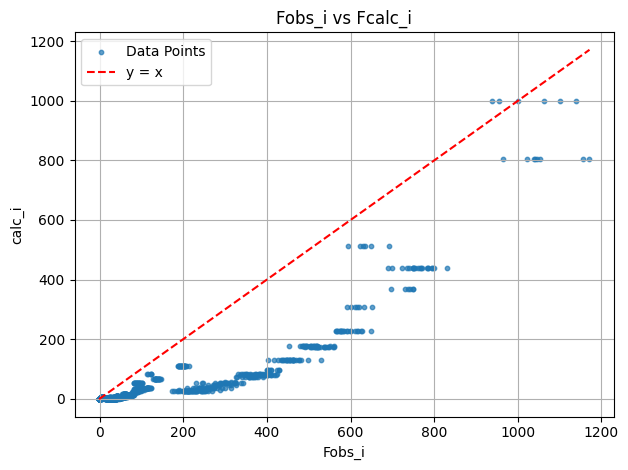

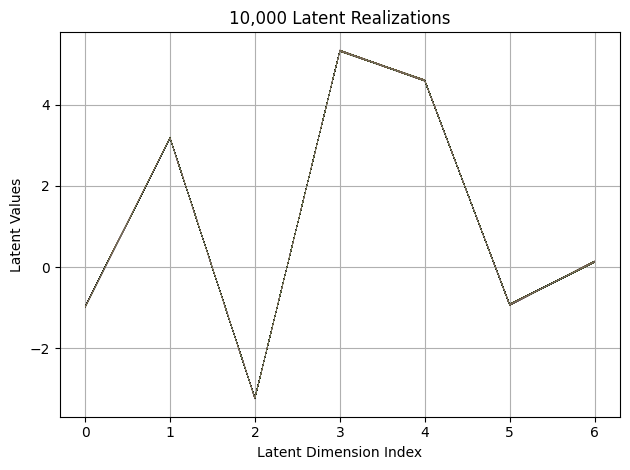

First 10 latent vectors from the VAE:
Sample 1: [-0.9840949773788452, 3.1828269958496094, -3.214891195297241, 5.323915004730225, 4.576199531555176, -0.9239012002944946, 0.14511968195438385]
Sample 2: [-0.9869707226753235, 3.18489670753479, -3.23530650138855, 5.331939697265625, 4.602644920349121, -0.926089346408844, 0.12068599462509155]
Sample 3: [-0.9727616906166077, 3.1671106815338135, -3.218858480453491, 5.322454929351807, 4.600373268127441, -0.936240553855896, 0.12364312261343002]
Sample 4: [-0.9859381318092346, 3.181541681289673, -3.232625722885132, 5.321638584136963, 4.598597526550293, -0.9202082753181458, 0.13004042208194733]
Sample 5: [-0.9924991726875305, 3.1828773021698, -3.236499309539795, 5.332816123962402, 4.600564479827881, -0.9201180338859558, 0.13517741858959198]
Sample 6: [-0.9880326390266418, 3.188596487045288, -3.2276294231414795, 5.325164794921875, 4.602198123931885, -0.9294851422309875, 0.1381043940782547]
Sample 7: [-0.9794871807098389, 3.184971332550049, -3.226423

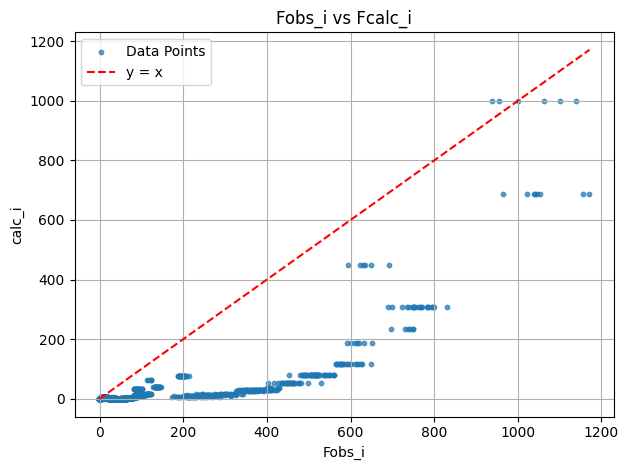

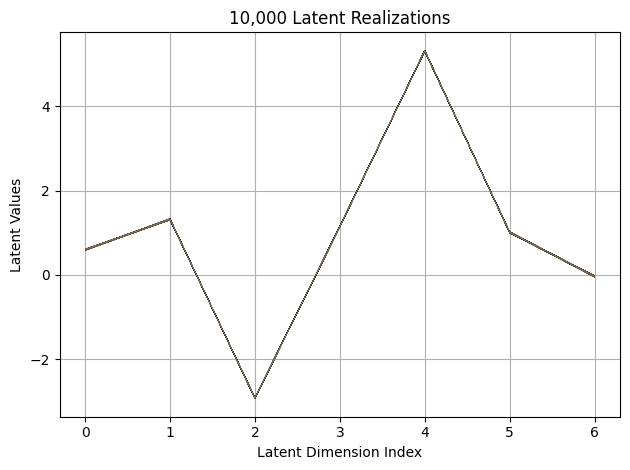

First 10 latent vectors from the VAE:
Sample 1: [0.5958934426307678, 1.336902141571045, -2.9180006980895996, 1.15503990650177, 5.305700778961182, 1.0105412006378174, -0.020579654723405838]
Sample 2: [0.5898769497871399, 1.309160828590393, -2.91939115524292, 1.1500550508499146, 5.31608772277832, 1.0114599466323853, -0.025292588397860527]
Sample 3: [0.5918188095092773, 1.3179877996444702, -2.916619062423706, 1.144250512123108, 5.301447868347168, 1.0091215372085571, -0.03670220449566841]
Sample 4: [0.5944212675094604, 1.3164688348770142, -2.9225356578826904, 1.1578776836395264, 5.309059143066406, 1.0224360227584839, -0.03497142717242241]
Sample 5: [0.5912171006202698, 1.321256160736084, -2.917614221572876, 1.1444675922393799, 5.311654090881348, 1.0073282718658447, -0.03574340045452118]
Sample 6: [0.5770240426063538, 1.3298532962799072, -2.9265317916870117, 1.1405736207962036, 5.314990520477295, 1.0046532154083252, -0.04219222441315651]
Sample 7: [0.5950979590415955, 1.3285928964614868, -2

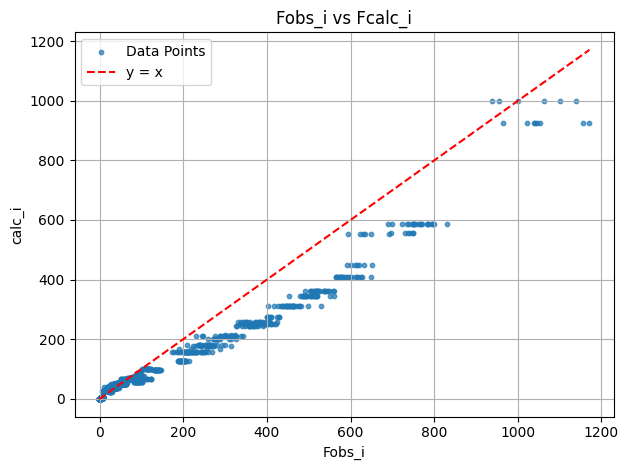

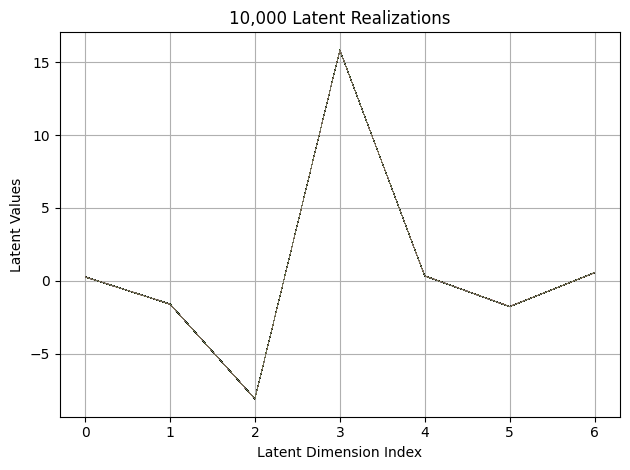

First 10 latent vectors from the VAE:
Sample 1: [0.2703506350517273, -1.597681999206543, -8.099000930786133, 15.81904411315918, 0.3373916745185852, -1.7812741994857788, 0.5527549982070923]
Sample 2: [0.2720526158809662, -1.604749083518982, -8.099349975585938, 15.826988220214844, 0.3439447581768036, -1.7698966264724731, 0.5615150332450867]
Sample 3: [0.27173876762390137, -1.6100456714630127, -8.095067024230957, 15.830531120300293, 0.33937838673591614, -1.7717397212982178, 0.5498250722885132]
Sample 4: [0.2756301760673523, -1.6007949113845825, -8.10863971710205, 15.819592475891113, 0.3304826021194458, -1.7720340490341187, 0.5642421245574951]
Sample 5: [0.27624693512916565, -1.603177547454834, -8.105992317199707, 15.821648597717285, 0.34241893887519836, -1.7629804611206055, 0.5603256821632385]
Sample 6: [0.27198687195777893, -1.5969351530075073, -8.10555648803711, 15.822084426879883, 0.33813217282295227, -1.7626510858535767, 0.5643683671951294]
Sample 7: [0.26454609632492065, -1.602468490

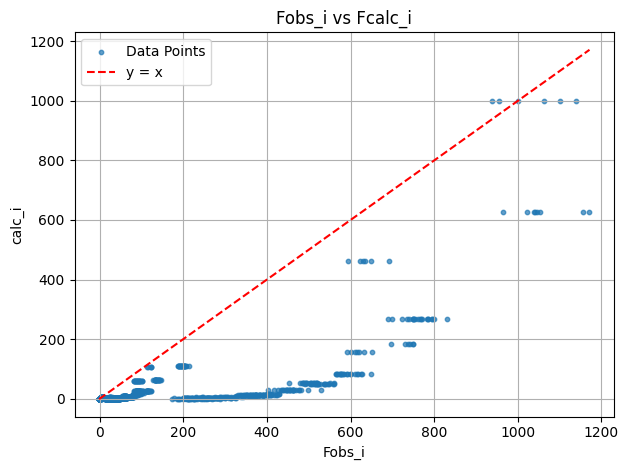

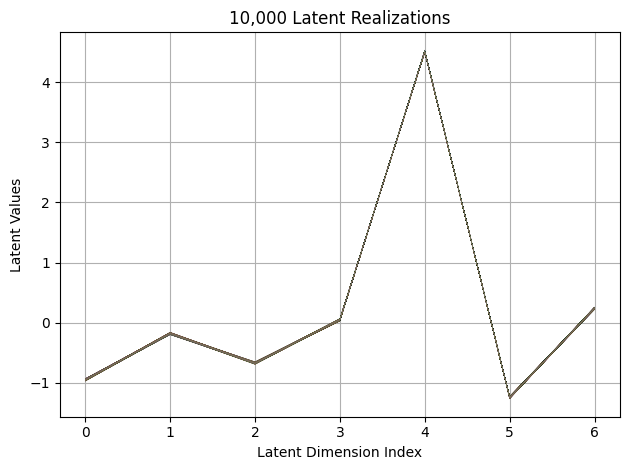

First 10 latent vectors from the VAE:
Sample 1: [-0.9461956024169922, -0.17944172024726868, -0.6775801777839661, 0.03670409694314003, 4.509459018707275, -1.234776496887207, 0.23610316216945648]
Sample 2: [-0.9438575506210327, -0.19163326919078827, -0.6686792969703674, 0.03676220402121544, 4.502222061157227, -1.248613715171814, 0.22853174805641174]
Sample 3: [-0.961104691028595, -0.18349061906337738, -0.6787340044975281, 0.05746644362807274, 4.494599342346191, -1.2452207803726196, 0.2477857768535614]
Sample 4: [-0.9553559422492981, -0.17966802418231964, -0.6672355532646179, 0.038717009127140045, 4.523165702819824, -1.252223014831543, 0.23730134963989258]
Sample 5: [-0.9432713389396667, -0.18410995602607727, -0.6781439781188965, 0.049026597291231155, 4.508494853973389, -1.2507736682891846, 0.22772815823554993]
Sample 6: [-0.946162760257721, -0.17426545917987823, -0.670883297920227, 0.04805496335029602, 4.5218658447265625, -1.2460956573486328, 0.24496586620807648]
Sample 7: [-0.9673202037

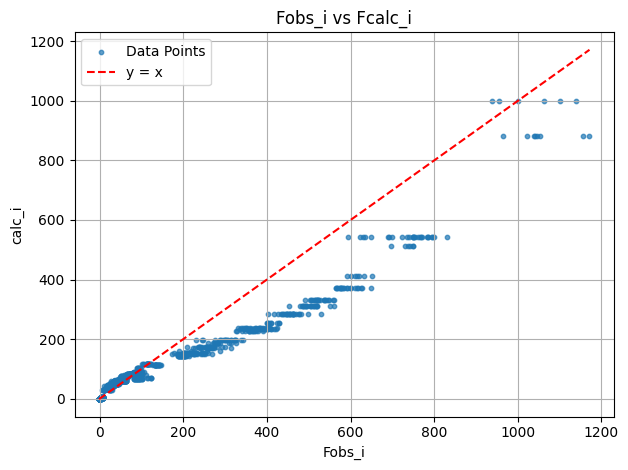

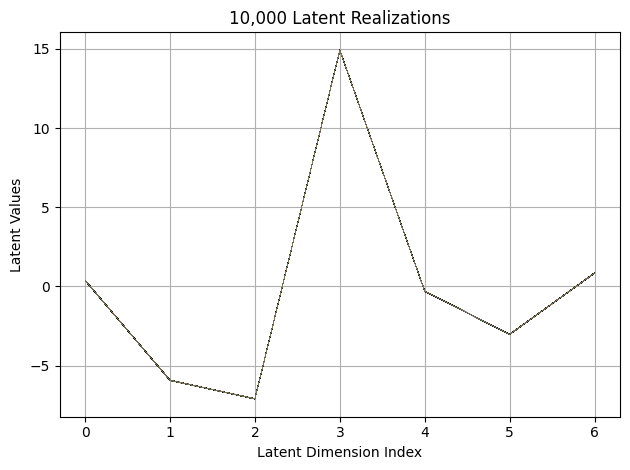

First 10 latent vectors from the VAE:
Sample 1: [0.38187375664711, -5.92350959777832, -7.108536243438721, 14.90883731842041, -0.29899898171424866, -3.03881573677063, 0.8407822847366333]
Sample 2: [0.37790724635124207, -5.92489767074585, -7.1050238609313965, 14.91219711303711, -0.31298187375068665, -3.019160032272339, 0.8495639562606812]
Sample 3: [0.37846997380256653, -5.92733097076416, -7.092527389526367, 14.907124519348145, -0.2913939356803894, -3.028838872909546, 0.8332567811012268]
Sample 4: [0.38408800959587097, -5.924540996551514, -7.0924224853515625, 14.916133880615234, -0.3153717517852783, -3.0262997150421143, 0.8370574712753296]
Sample 5: [0.38161441683769226, -5.924965858459473, -7.1013360023498535, 14.910859107971191, -0.30396124720573425, -3.027613401412964, 0.8338354825973511]
Sample 6: [0.3791647255420685, -5.922934055328369, -7.0956830978393555, 14.912008285522461, -0.29108813405036926, -3.032665491104126, 0.8541002869606018]
Sample 7: [0.3862032890319824, -5.92314577102

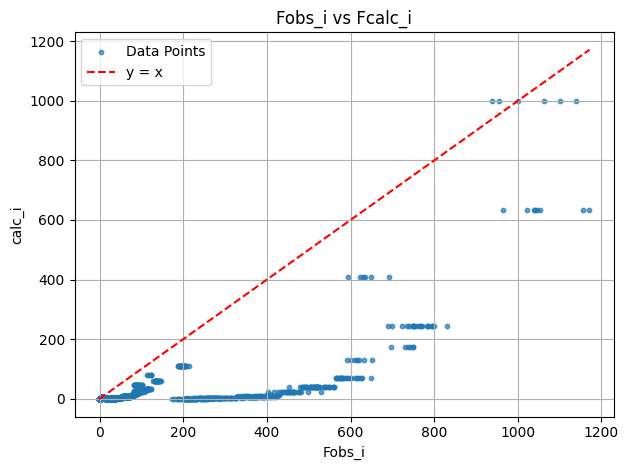

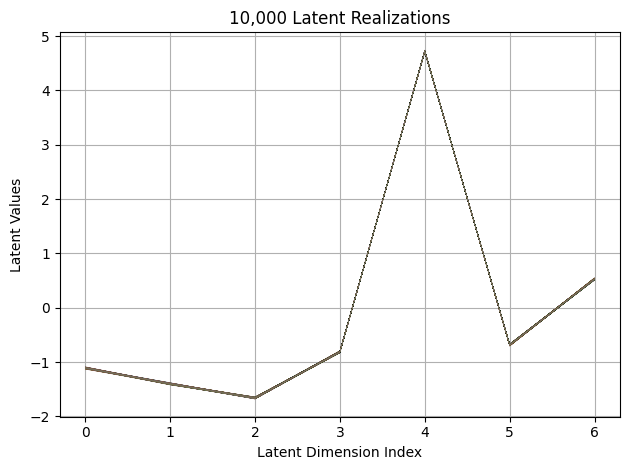

First 10 latent vectors from the VAE:
Sample 1: [-1.111404299736023, -1.405055046081543, -1.6624362468719482, -0.8014712333679199, 4.719193935394287, -0.6837087869644165, 0.5263859629631042]
Sample 2: [-1.113896369934082, -1.3899447917938232, -1.6579649448394775, -0.7978357672691345, 4.721374034881592, -0.6805905103683472, 0.5313242673873901]
Sample 3: [-1.111417293548584, -1.4009801149368286, -1.6728845834732056, -0.8196471333503723, 4.729342460632324, -0.6836251020431519, 0.5281198024749756]
Sample 4: [-1.112135887145996, -1.402281641960144, -1.6618918180465698, -0.8149216771125793, 4.728819370269775, -0.680865466594696, 0.5397610068321228]
Sample 5: [-1.0992131233215332, -1.4079805612564087, -1.659932255744934, -0.8163701295852661, 4.711319446563721, -0.6878401041030884, 0.5262587666511536]
Sample 6: [-1.103503704071045, -1.4028472900390625, -1.651633858680725, -0.8081162571907043, 4.724457740783691, -0.6967172622680664, 0.5262956023216248]
Sample 7: [-1.102278232574463, -1.39968097

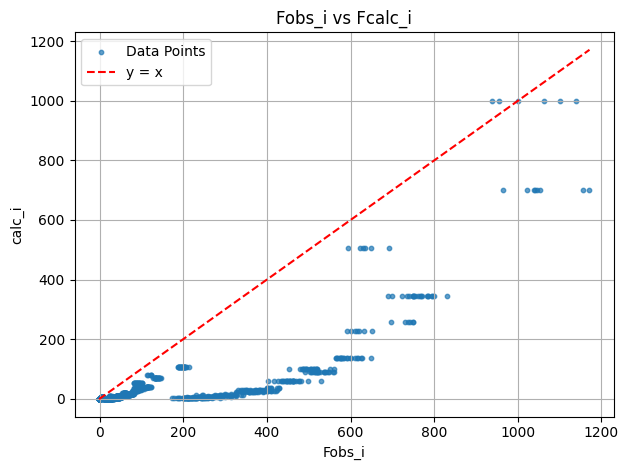

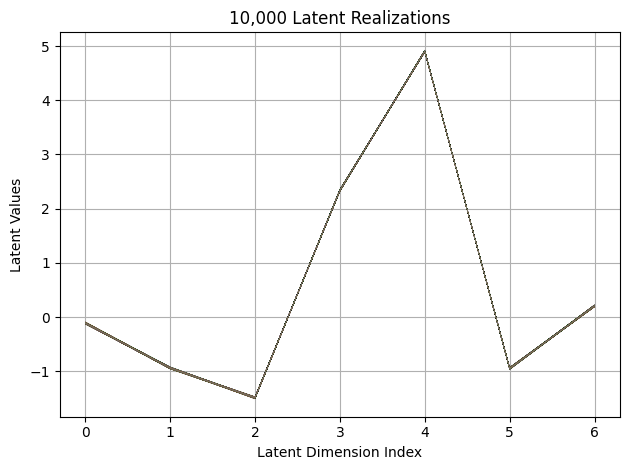

First 10 latent vectors from the VAE:
Sample 1: [-0.11220463365316391, -0.9226945042610168, -1.4992543458938599, 2.332416534423828, 4.90584659576416, -0.9367243051528931, 0.21349087357521057]
Sample 2: [-0.11493083089590073, -0.9336938858032227, -1.4848341941833496, 2.348745584487915, 4.911355495452881, -0.9458242654800415, 0.19418352842330933]
Sample 3: [-0.10480409115552902, -0.9397116303443909, -1.4850965738296509, 2.3426952362060547, 4.90131950378418, -0.9436390399932861, 0.20145204663276672]
Sample 4: [-0.1064085140824318, -0.9331687092781067, -1.4814132452011108, 2.3478493690490723, 4.901230335235596, -0.9546643495559692, 0.200526162981987]
Sample 5: [-0.10728199779987335, -0.950173556804657, -1.493127703666687, 2.343890428543091, 4.909465789794922, -0.9427094459533691, 0.20430846512317657]
Sample 6: [-0.12402883172035217, -0.9445015788078308, -1.4925048351287842, 2.3302865028381348, 4.908583641052246, -0.9501051306724548, 0.2032041996717453]
Sample 7: [-0.1202971488237381, -0.93

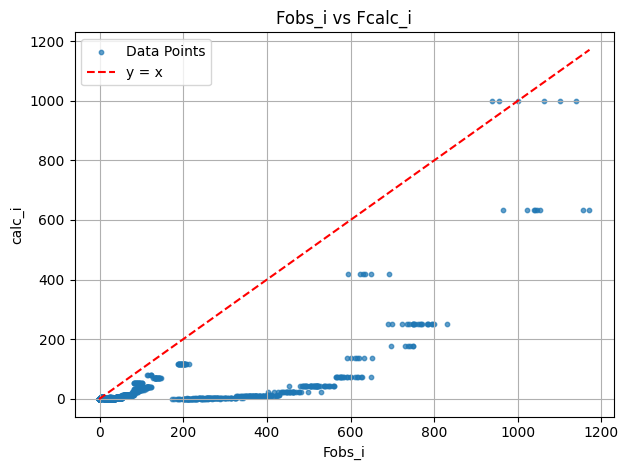

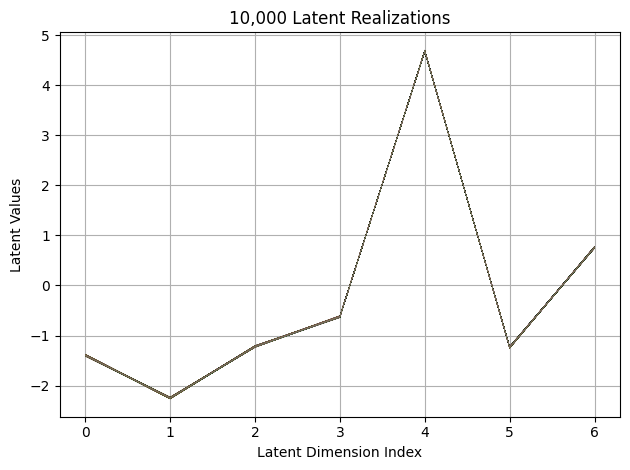

First 10 latent vectors from the VAE:
Sample 1: [-1.4000279903411865, -2.2413806915283203, -1.2224688529968262, -0.6215440630912781, 4.67690896987915, -1.2403753995895386, 0.7569926381111145]
Sample 2: [-1.3968803882598877, -2.2470548152923584, -1.2210347652435303, -0.6116993427276611, 4.676615238189697, -1.2316690683364868, 0.7592198252677917]
Sample 3: [-1.391945719718933, -2.243668794631958, -1.223763108253479, -0.6357916593551636, 4.676140785217285, -1.2361325025558472, 0.7679104804992676]
Sample 4: [-1.389981985092163, -2.2526609897613525, -1.2098894119262695, -0.6316537261009216, 4.680469512939453, -1.2373074293136597, 0.7491222620010376]
Sample 5: [-1.3957138061523438, -2.2409465312957764, -1.2057242393493652, -0.6230637431144714, 4.6850385665893555, -1.2485766410827637, 0.7628474235534668]
Sample 6: [-1.3843562602996826, -2.2501375675201416, -1.2148271799087524, -0.6251189112663269, 4.681521892547607, -1.2440590858459473, 0.774350643157959]
Sample 7: [-1.3922497034072876, -2.23

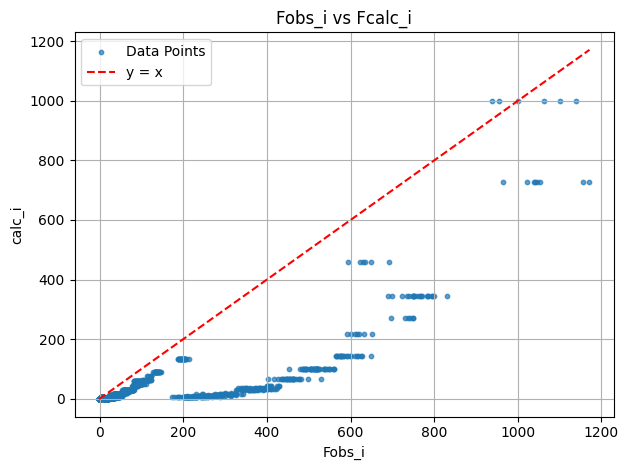

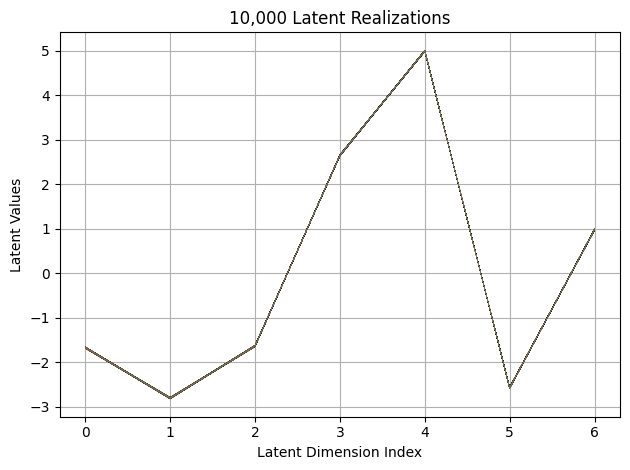

First 10 latent vectors from the VAE:
Sample 1: [-1.662467360496521, -2.7964179515838623, -1.6351889371871948, 2.6445624828338623, 4.984911918640137, -2.561293840408325, 0.9822348356246948]
Sample 2: [-1.6652939319610596, -2.7968764305114746, -1.6328908205032349, 2.654527425765991, 4.9945597648620605, -2.5777876377105713, 0.9892240166664124]
Sample 3: [-1.6681662797927856, -2.790855646133423, -1.6306538581848145, 2.643388509750366, 4.991796016693115, -2.5702364444732666, 0.9804989099502563]
Sample 4: [-1.6675288677215576, -2.7975611686706543, -1.622574806213379, 2.6583197116851807, 4.991910457611084, -2.5821878910064697, 0.9694300889968872]
Sample 5: [-1.6762449741363525, -2.8021860122680664, -1.6227469444274902, 2.647965908050537, 4.997770309448242, -2.572269916534424, 0.9839991331100464]
Sample 6: [-1.6680752038955688, -2.7952988147735596, -1.627034306526184, 2.65094256401062, 4.998365879058838, -2.5651285648345947, 0.9912645816802979]
Sample 7: [-1.6768264770507812, -2.7965838909149

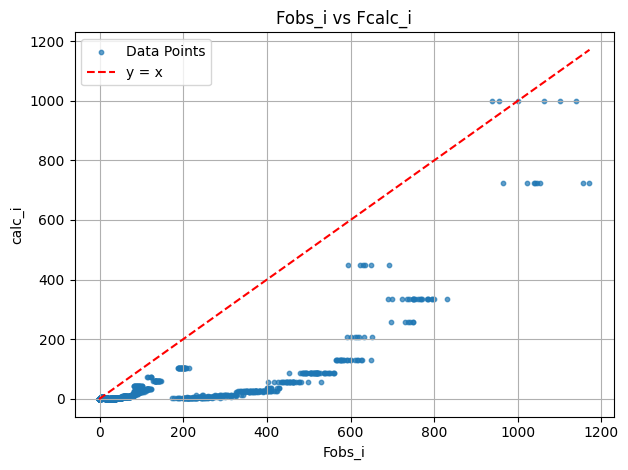

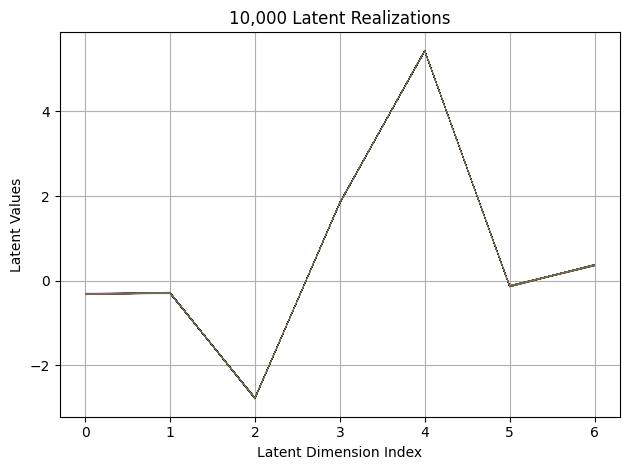

First 10 latent vectors from the VAE:
Sample 1: [-0.3030034601688385, -0.2984718978404999, -2.7648439407348633, 1.8334333896636963, 5.425048351287842, -0.13493147492408752, 0.3486826419830322]
Sample 2: [-0.29990217089653015, -0.28876960277557373, -2.7876780033111572, 1.8517614603042603, 5.43440055847168, -0.13102196156978607, 0.3689659833908081]
Sample 3: [-0.308352530002594, -0.2969406247138977, -2.7706449031829834, 1.8394930362701416, 5.4344868659973145, -0.1381174623966217, 0.37582072615623474]
Sample 4: [-0.3207088112831116, -0.2895764708518982, -2.7727150917053223, 1.8480091094970703, 5.426867961883545, -0.12455818802118301, 0.36612042784690857]
Sample 5: [-0.3153785765171051, -0.30099955201148987, -2.77691650390625, 1.8445923328399658, 5.429015159606934, -0.11295824497938156, 0.3567125201225281]
Sample 6: [-0.3128103017807007, -0.28618699312210083, -2.7730743885040283, 1.8409970998764038, 5.436400413513184, -0.1375170648097992, 0.3746812045574188]
Sample 7: [-0.3050953447818756,

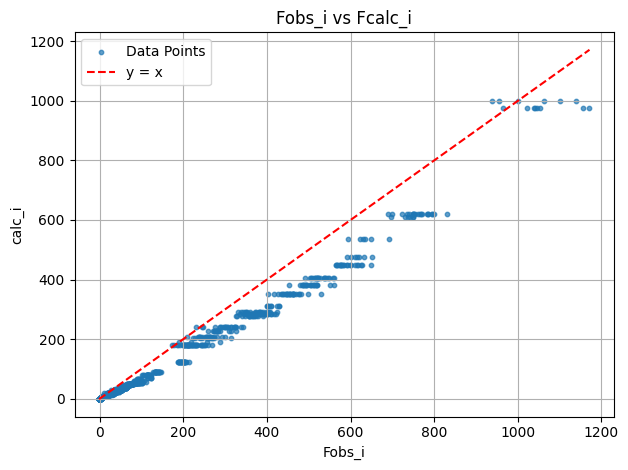

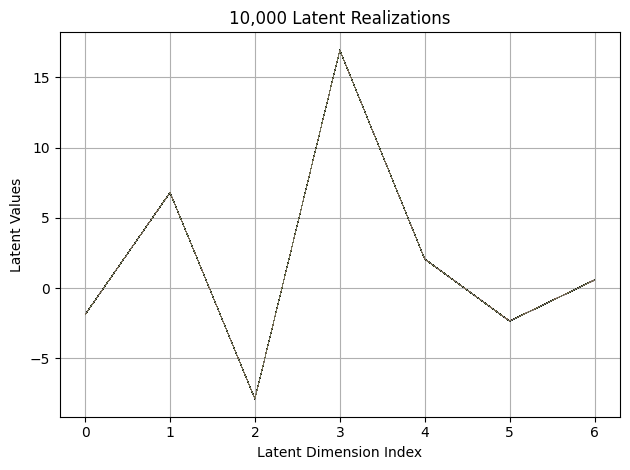

First 10 latent vectors from the VAE:
Sample 1: [-1.8868118524551392, 6.792486190795898, -7.897170066833496, 16.947416305541992, 2.0648887157440186, -2.3540282249450684, 0.5813944935798645]
Sample 2: [-1.8951317071914673, 6.810108661651611, -7.883825778961182, 16.95355224609375, 2.06870698928833, -2.3420755863189697, 0.5831005573272705]
Sample 3: [-1.8792787790298462, 6.796536445617676, -7.88831901550293, 16.955690383911133, 2.072080135345459, -2.352705955505371, 0.5833960175514221]
Sample 4: [-1.8914496898651123, 6.806309223175049, -7.88986873626709, 16.93913459777832, 2.0694456100463867, -2.350950241088867, 0.5827606916427612]
Sample 5: [-1.8819286823272705, 6.798184394836426, -7.886875152587891, 16.947811126708984, 2.053008556365967, -2.345928430557251, 0.5745438933372498]
Sample 6: [-1.8960107564926147, 6.799356937408447, -7.884332180023193, 16.940980911254883, 2.0616793632507324, -2.361823320388794, 0.5727965235710144]
Sample 7: [-1.8927432298660278, 6.808995246887207, -7.88001441

C:\Users\USER\anaconda3\envs\gsas\Lib\site-packages\gpytorch\lazy\triangular_lazy_tensor.py:130: UserWarning: torch.triangular_solve is deprecated in favor of torch.linalg.solve_triangularand will be removed in a future PyTorch release.
torch.linalg.solve_triangular has its arguments reversed and does not return a copy of one of the inputs.
X = torch.triangular_solve(B, A).solution
should be replaced with
X = torch.linalg.solve_triangular(A, B). (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\native\BatchLinearAlgebra.cpp:2259.)
  res = torch.triangular_solve(right_tensor, self.evaluate(), upper=self.upper).solution
C:\Users\USER\anaconda3\envs\gsas\Lib\site-packages\torch\functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\native\TensorShape.cpp:3638.)
  return _VF.meshgrid(tensors, **kwargs

#########################################################
Current best solutions at iteration:1
Best params among evaluated samples:
tensor([[0.9000, 0.0000, 0.9173, 0.0033]]) tensor(3.2200)
Best params from GP map:
tensor([[0.9000, 0.0000, 0.9200, 0.0000]]) tensor(7.8900)


<Figure size 640x480 with 0 Axes>

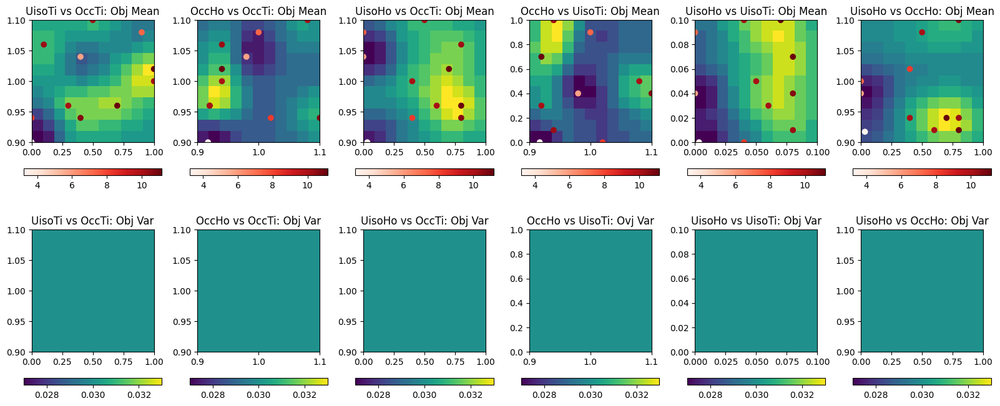

C:\Users\USER\AppData\Local\Temp\ipykernel_8016\93244214.py:141: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  Z[i] =  (y_means[i]-best_value-eta)/y_std[i]
C:\Users\USER\AppData\Local\Temp\ipykernel_8016\93244214.py:142: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  EI_val[i] = (y_means[i]-best_value-eta)*norm.cdf(Z[i]) + y_std[i]*norm.pdf(Z[i])


EI: [1.54586633e-06 1.50016785e-06 1.10075052e-06 ... 2.88310730e-07
 2.88378033e-07 2.88383490e-07]
Function eval #12
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.8999999761581421, 0.0, 0.9199999570846558, 0.009999999776482582]
[0.421597, 0.920386, 0.008262, 0.00325]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
initial chi^2 1.1609e+05 with 2596 obs.
Cycle 0: 0.64s, Chi**2: 52967 for 2596 obs., Lambda: 0,  Delta: 0.544, SVD=0
Maximum shift/esd = -52.310 for all cycles
Read from file:C:\Users\USER\Ph

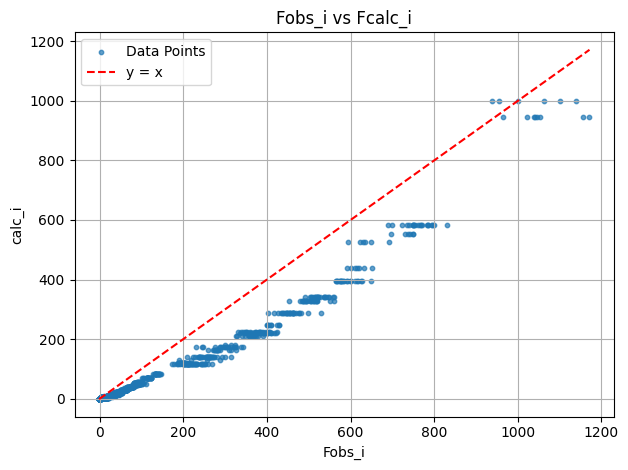

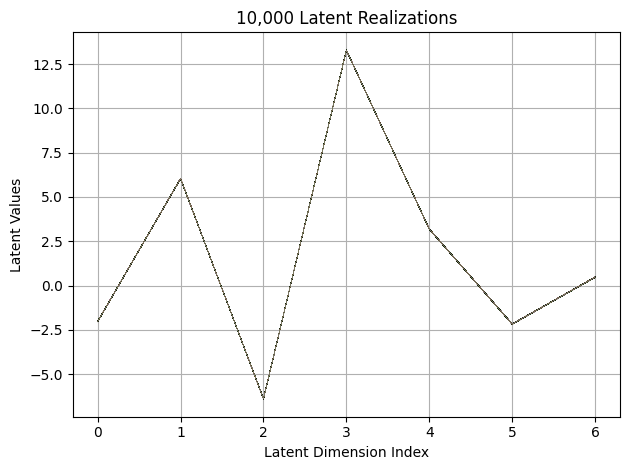

First 10 latent vectors from the VAE:
Sample 1: [-2.0400993824005127, 6.040200233459473, -6.400712966918945, 13.282270431518555, 3.1866559982299805, -2.1694912910461426, 0.46683767437934875]
Sample 2: [-2.033704996109009, 6.0334062576293945, -6.390655040740967, 13.288886070251465, 3.195807695388794, -2.1789376735687256, 0.4811285734176636]
Sample 3: [-2.033262014389038, 6.035181999206543, -6.403160095214844, 13.281057357788086, 3.1889617443084717, -2.177396059036255, 0.4736057221889496]
Sample 4: [-2.0267183780670166, 6.034234523773193, -6.400660514831543, 13.278912544250488, 3.188547134399414, -2.1877362728118896, 0.4588887095451355]
Sample 5: [-2.0347237586975098, 6.028468132019043, -6.4027180671691895, 13.283888816833496, 3.2003071308135986, -2.1681177616119385, 0.46989870071411133]
Sample 6: [-2.0275216102600098, 6.034432888031006, -6.399521350860596, 13.29205322265625, 3.1832027435302734, -2.172534942626953, 0.4725106656551361]
Sample 7: [-2.026313543319702, 6.0367326736450195, -6

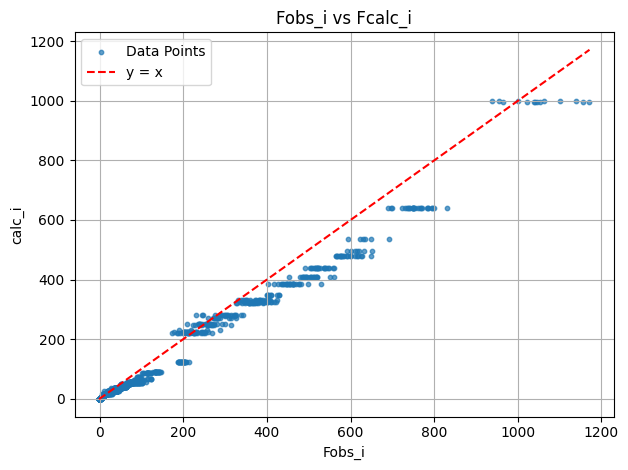

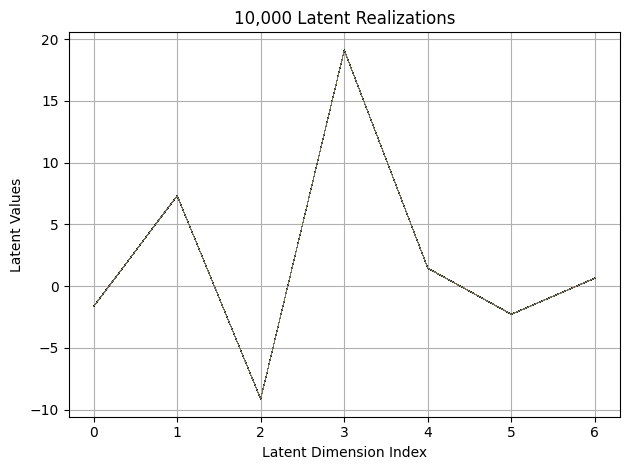

First 10 latent vectors from the VAE:
Sample 1: [-1.6597336530685425, 7.327995777130127, -9.125300407409668, 19.122896194458008, 1.4514636993408203, -2.2671687602996826, 0.646862268447876]
Sample 2: [-1.6554499864578247, 7.329476833343506, -9.134889602661133, 19.114809036254883, 1.4497822523117065, -2.2713444232940674, 0.6580011248588562]
Sample 3: [-1.6640050411224365, 7.324286937713623, -9.128989219665527, 19.115049362182617, 1.458389163017273, -2.2814455032348633, 0.6542522311210632]
Sample 4: [-1.6477197408676147, 7.33514404296875, -9.135170936584473, 19.108036041259766, 1.4644924402236938, -2.276294708251953, 0.6485382318496704]
Sample 5: [-1.6584358215332031, 7.319622993469238, -9.127508163452148, 19.126012802124023, 1.4683647155761719, -2.265730857849121, 0.6414427757263184]
Sample 6: [-1.6566824913024902, 7.3215484619140625, -9.126665115356445, 19.10927963256836, 1.4660371541976929, -2.2738258838653564, 0.6553875207901001]
Sample 7: [-1.64987313747406, 7.321794033050537, -9.124

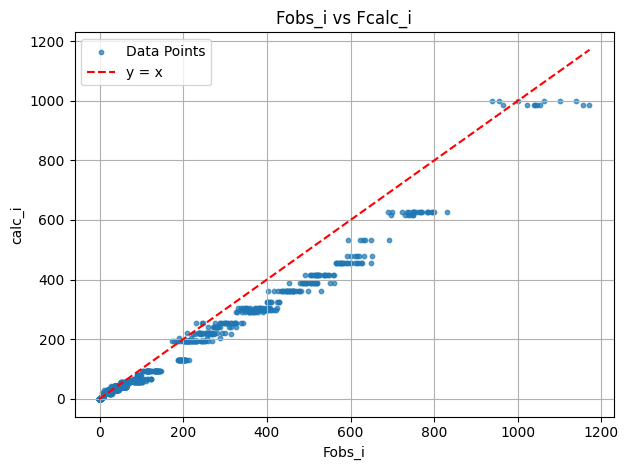

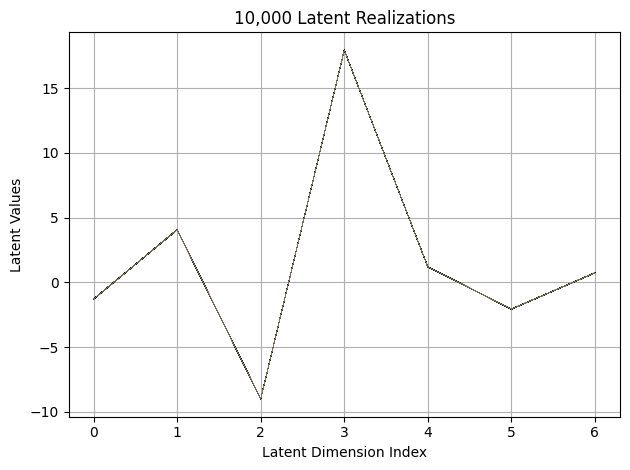

First 10 latent vectors from the VAE:
Sample 1: [-1.300947666168213, 4.052210807800293, -9.002718925476074, 17.91918182373047, 1.1948539018630981, -2.0754175186157227, 0.7267462015151978]
Sample 2: [-1.2998366355895996, 4.061465263366699, -9.004502296447754, 17.925045013427734, 1.204559564590454, -2.061246395111084, 0.7289329767227173]
Sample 3: [-1.298836588859558, 4.046780109405518, -9.01272201538086, 17.92493438720703, 1.1844121217727661, -2.0726099014282227, 0.7355366945266724]
Sample 4: [-1.2905843257904053, 4.0632500648498535, -9.009831428527832, 17.93256378173828, 1.1988095045089722, -2.0767412185668945, 0.7316430807113647]
Sample 5: [-1.299376130104065, 4.065220355987549, -8.996809005737305, 17.922840118408203, 1.201451063156128, -2.068185806274414, 0.737209677696228]
Sample 6: [-1.3086992502212524, 4.0527448654174805, -9.00829029083252, 17.922800064086914, 1.1936479806900024, -2.071307420730591, 0.7260448932647705]
Sample 7: [-1.3082036972045898, 4.05848503112793, -9.002882003

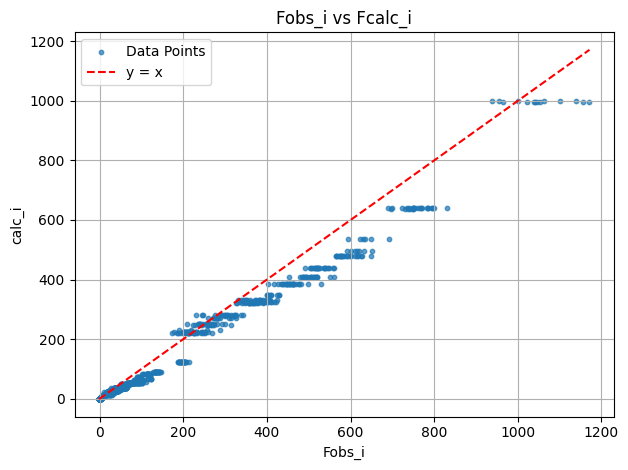

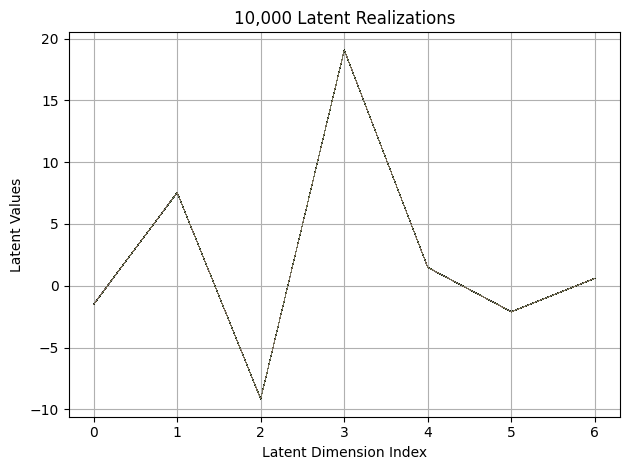

First 10 latent vectors from the VAE:
Sample 1: [-1.5186470746994019, 7.543359279632568, -9.14000415802002, 19.064266204833984, 1.4820853471755981, -2.0966901779174805, 0.6075857281684875]
Sample 2: [-1.5104095935821533, 7.5393805503845215, -9.13554573059082, 19.057344436645508, 1.4866292476654053, -2.101041316986084, 0.600964367389679]
Sample 3: [-1.504098653793335, 7.529975891113281, -9.14133071899414, 19.060888290405273, 1.4891663789749146, -2.089580774307251, 0.5991356372833252]
Sample 4: [-1.5021262168884277, 7.5433855056762695, -9.148531913757324, 19.07102394104004, 1.484226942062378, -2.102320671081543, 0.6093478798866272]
Sample 5: [-1.5046329498291016, 7.540097713470459, -9.150890350341797, 19.061840057373047, 1.479417085647583, -2.0958847999572754, 0.6031445860862732]
Sample 6: [-1.5008209943771362, 7.537882328033447, -9.142908096313477, 19.06132698059082, 1.4693633317947388, -2.088998794555664, 0.6009560823440552]
Sample 7: [-1.5012333393096924, 7.5358967781066895, -9.157823

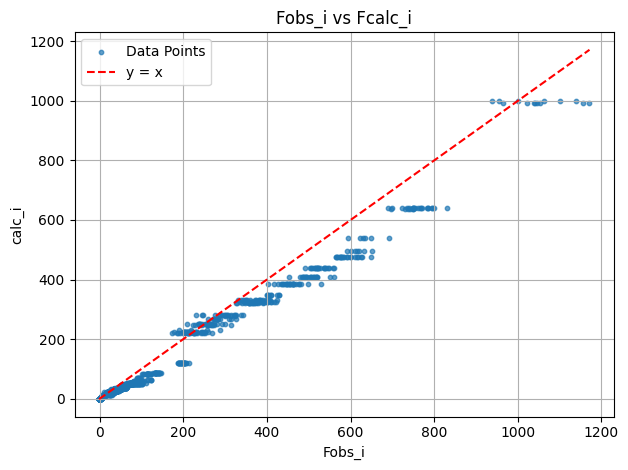

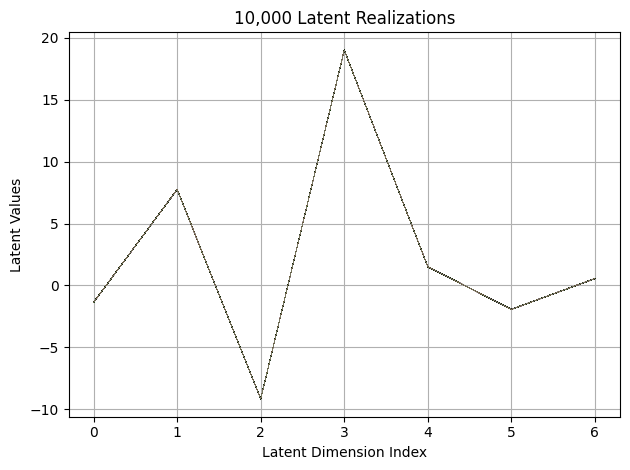

First 10 latent vectors from the VAE:
Sample 1: [-1.3639343976974487, 7.746423244476318, -9.172994613647461, 19.006959915161133, 1.5073533058166504, -1.9255757331848145, 0.5588940382003784]
Sample 2: [-1.3804527521133423, 7.756093502044678, -9.166303634643555, 19.010601043701172, 1.5217955112457275, -1.9289634227752686, 0.5509082078933716]
Sample 3: [-1.3679522275924683, 7.750263214111328, -9.179356575012207, 19.00249671936035, 1.5093483924865723, -1.9415074586868286, 0.5527184009552002]
Sample 4: [-1.360182523727417, 7.762754917144775, -9.167582511901855, 18.995859146118164, 1.5099307298660278, -1.923646092414856, 0.5516030192375183]
Sample 5: [-1.36677086353302, 7.749813079833984, -9.179170608520508, 18.995521545410156, 1.508816123008728, -1.917442798614502, 0.5564008951187134]
Sample 6: [-1.3606958389282227, 7.741382598876953, -9.162101745605469, 18.993301391601562, 1.50492525100708, -1.932614803314209, 0.5613623261451721]
Sample 7: [-1.373250961303711, 7.7403411865234375, -9.164740

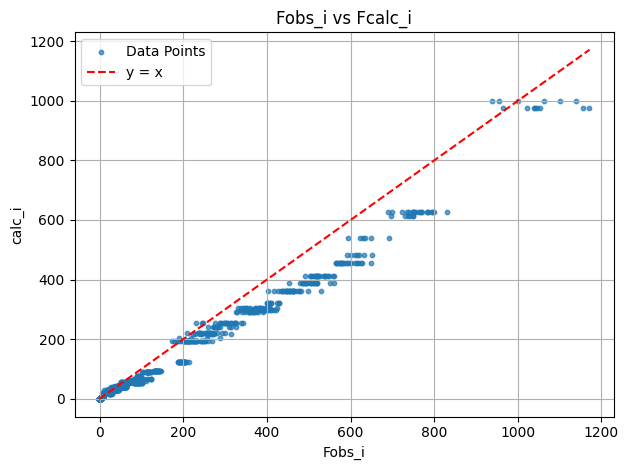

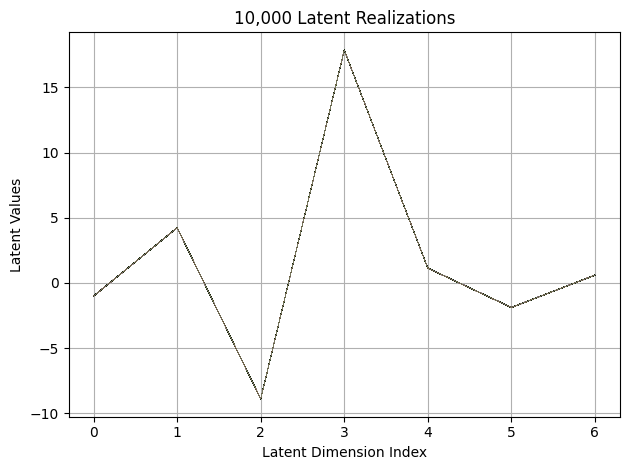

First 10 latent vectors from the VAE:
Sample 1: [-1.0102779865264893, 4.247615814208984, -8.91048526763916, 17.8690185546875, 1.1364226341247559, -1.8826086521148682, 0.5960832834243774]
Sample 2: [-1.016007900238037, 4.226216793060303, -8.901490211486816, 17.858247756958008, 1.1318832635879517, -1.8968570232391357, 0.6056459546089172]
Sample 3: [-1.0114997625350952, 4.2298126220703125, -8.915473937988281, 17.859947204589844, 1.1263186931610107, -1.8927034139633179, 0.600990891456604]
Sample 4: [-1.005240797996521, 4.236960411071777, -8.915164947509766, 17.857925415039062, 1.122393012046814, -1.8811181783676147, 0.5906797051429749]
Sample 5: [-1.013515830039978, 4.240429878234863, -8.897527694702148, 17.865747451782227, 1.1292836666107178, -1.8852434158325195, 0.6081629991531372]
Sample 6: [-1.0087999105453491, 4.231310844421387, -8.911030769348145, 17.874618530273438, 1.1275317668914795, -1.8881633281707764, 0.6003985404968262]
Sample 7: [-1.0182139873504639, 4.222026348114014, -8.896

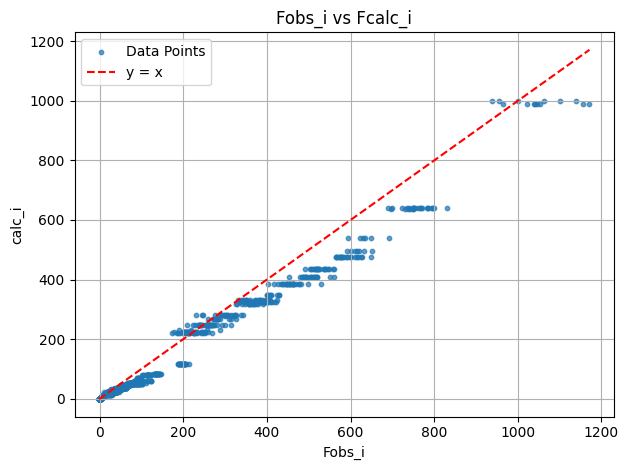

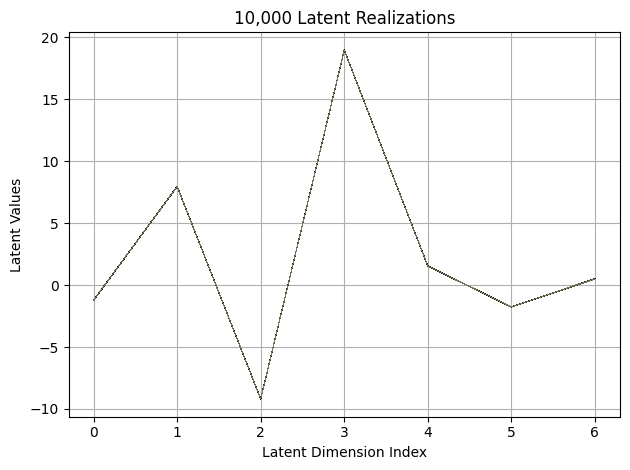

First 10 latent vectors from the VAE:
Sample 1: [-1.2291514873504639, 7.950808525085449, -9.188446044921875, 18.956209182739258, 1.5181313753128052, -1.768005132675171, 0.49918562173843384]
Sample 2: [-1.2400108575820923, 7.954771995544434, -9.187519073486328, 18.96038818359375, 1.536878228187561, -1.7701423168182373, 0.507169783115387]
Sample 3: [-1.2373998165130615, 7.958574295043945, -9.192500114440918, 18.948043823242188, 1.5267634391784668, -1.7750345468521118, 0.5066277980804443]
Sample 4: [-1.2397340536117554, 7.957897663116455, -9.198251724243164, 18.935226440429688, 1.5352827310562134, -1.7673195600509644, 0.49837157130241394]
Sample 5: [-1.2322280406951904, 7.9419074058532715, -9.180130958557129, 18.949127197265625, 1.523305892944336, -1.7782546281814575, 0.5026055574417114]
Sample 6: [-1.2306485176086426, 7.953573703765869, -9.204792022705078, 18.959203720092773, 1.5231493711471558, -1.7706388235092163, 0.5113304257392883]
Sample 7: [-1.2341915369033813, 7.947829723358154, -

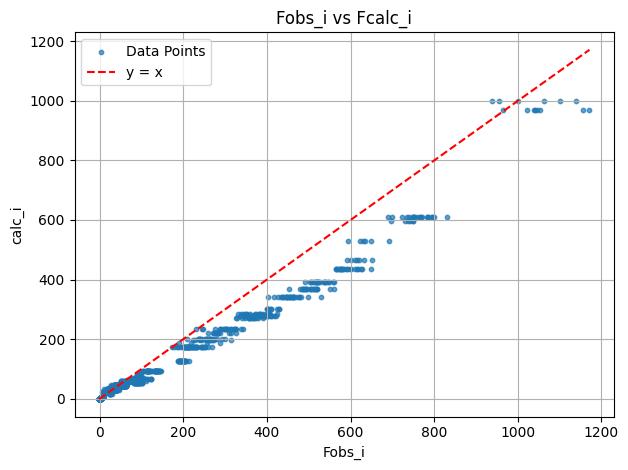

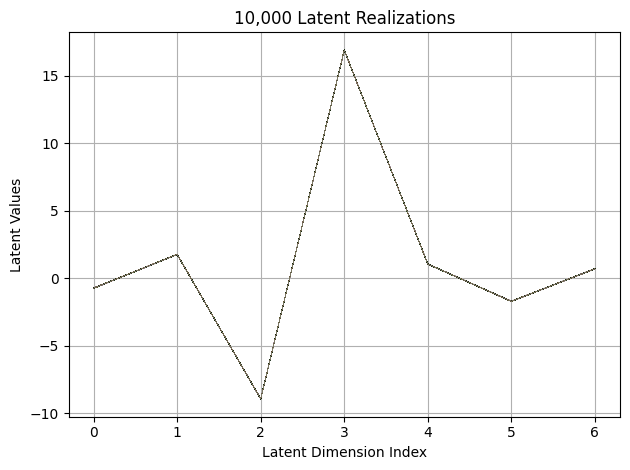

First 10 latent vectors from the VAE:
Sample 1: [-0.7103683948516846, 1.7720260620117188, -8.922683715820312, 16.911624908447266, 1.071028470993042, -1.6938787698745728, 0.7182998061180115]
Sample 2: [-0.7206265926361084, 1.774735450744629, -8.912668228149414, 16.911602020263672, 1.0666598081588745, -1.6907892227172852, 0.7186895608901978]
Sample 3: [-0.725919783115387, 1.7681207656860352, -8.910575866699219, 16.910690307617188, 1.063033103942871, -1.696419596672058, 0.724450409412384]
Sample 4: [-0.7257637977600098, 1.773256778717041, -8.934847831726074, 16.9022216796875, 1.0659621953964233, -1.6946369409561157, 0.7100817561149597]
Sample 5: [-0.723170816898346, 1.776619791984558, -8.92469310760498, 16.910552978515625, 1.0581458806991577, -1.7021476030349731, 0.7163853049278259]
Sample 6: [-0.7374594211578369, 1.7868242263793945, -8.930803298950195, 16.904951095581055, 1.0557639598846436, -1.6924704313278198, 0.7074323892593384]
Sample 7: [-0.7280298471450806, 1.7814970016479492, -8.9

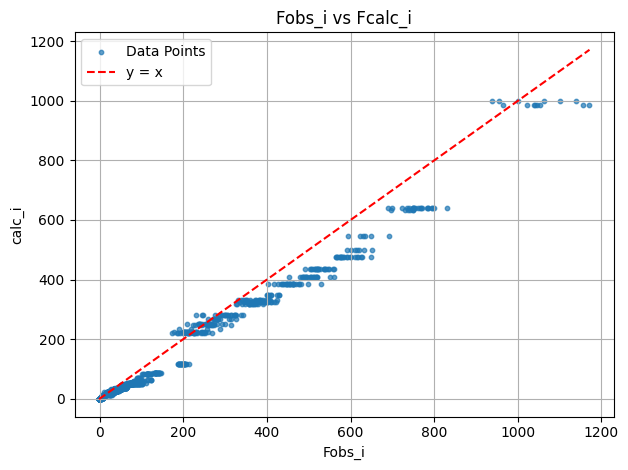

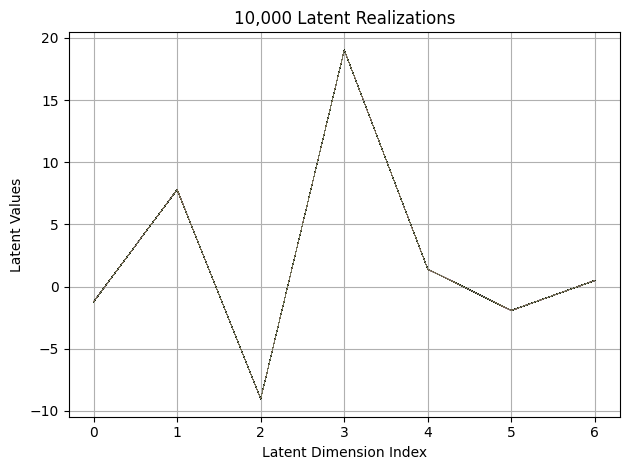

First 10 latent vectors from the VAE:
Sample 1: [-1.2267701625823975, 7.786372661590576, -9.054829597473145, 19.009166717529297, 1.3809013366699219, -1.9215168952941895, 0.499755859375]
Sample 2: [-1.2173752784729004, 7.800776958465576, -9.03840160369873, 19.018579483032227, 1.3840032815933228, -1.9174094200134277, 0.4904705882072449]
Sample 3: [-1.2411425113677979, 7.794009685516357, -9.040377616882324, 19.01505470275879, 1.373526930809021, -1.9230952262878418, 0.486851304769516]
Sample 4: [-1.219273567199707, 7.786846160888672, -9.041068077087402, 19.00933074951172, 1.3777309656143188, -1.9220547676086426, 0.48729363083839417]
Sample 5: [-1.2186064720153809, 7.794041633605957, -9.04679012298584, 18.99907112121582, 1.3813700675964355, -1.9229880571365356, 0.48134779930114746]
Sample 6: [-1.2249712944030762, 7.791904926300049, -9.039361953735352, 19.01258087158203, 1.384554147720337, -1.9184080362319946, 0.49274808168411255]
Sample 7: [-1.222383975982666, 7.789224147796631, -9.03439235

<Figure size 640x480 with 0 Axes>

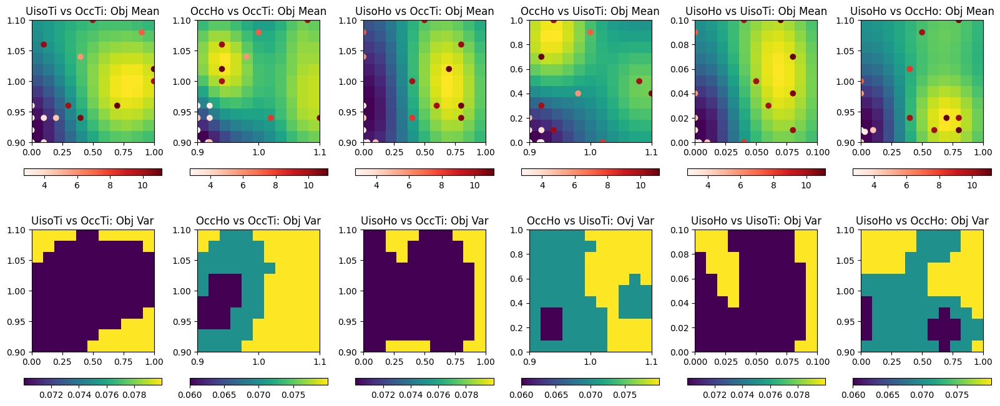

EI: [-1.          0.00750262  0.00648434 ...  0.00101668  0.00112759
  0.00120533]
Function eval #21
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9399999976158142, 0.0, 0.9399999976158142, 0.0]
[0.421597, 0.920386, 0.008262, 0.00325]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.5430
initial chi^2 6.5668e+05 with 2596 obs.
New scale: 0.5430
Cycle 0: 0.60s, Chi**2: 2.6676e+05 for 2596 obs., Lambda: 0,  Delta: 0.594, SVD=0
New scale: 0.5430
Maximum shift/esd = -144.566 for all cycles
Read f

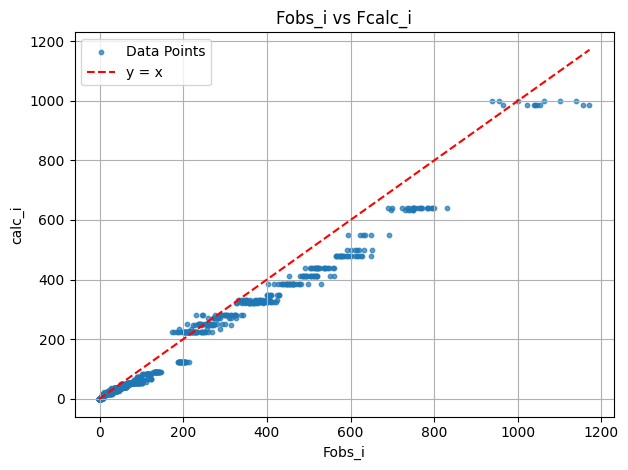

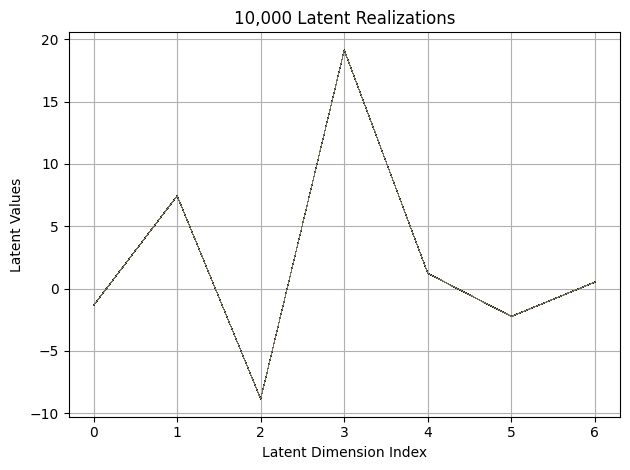

First 10 latent vectors from the VAE:
Sample 1: [-1.3517085313796997, 7.436524391174316, -8.847268104553223, 19.13222885131836, 1.2178891897201538, -2.2421939373016357, 0.5120100378990173]
Sample 2: [-1.3576991558074951, 7.439783573150635, -8.858942985534668, 19.129547119140625, 1.2207765579223633, -2.2345268726348877, 0.512186586856842]
Sample 3: [-1.362282156944275, 7.425238609313965, -8.848710060119629, 19.120281219482422, 1.2147740125656128, -2.2418763637542725, 0.5074422955513]
Sample 4: [-1.3595000505447388, 7.429750442504883, -8.855051040649414, 19.139392852783203, 1.215375304222107, -2.2392795085906982, 0.5048578977584839]
Sample 5: [-1.3685650825500488, 7.422547340393066, -8.8709077835083, 19.135459899902344, 1.2142717838287354, -2.2448318004608154, 0.5090325474739075]
Sample 6: [-1.3608986139297485, 7.4401445388793945, -8.851347923278809, 19.123701095581055, 1.215776801109314, -2.2479448318481445, 0.5087060332298279]
Sample 7: [-1.364372730255127, 7.426056861877441, -8.856491

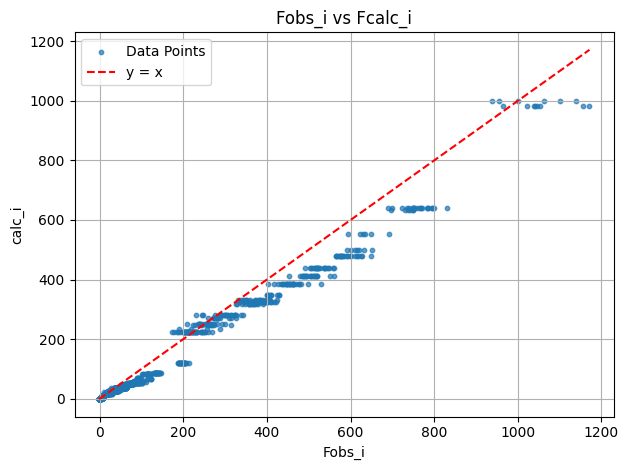

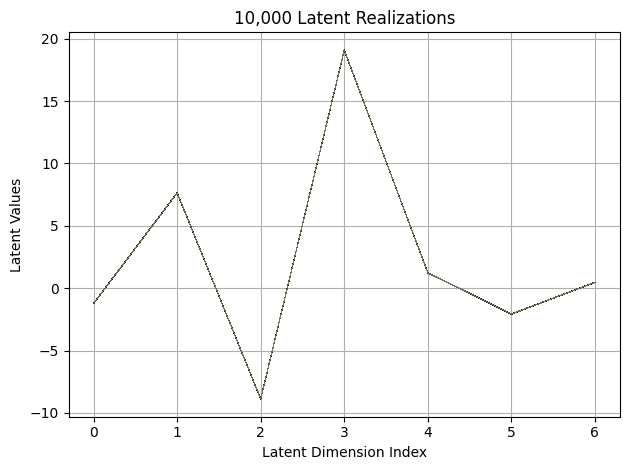

First 10 latent vectors from the VAE:
Sample 1: [-1.2204698324203491, 7.6334943771362305, -8.860349655151367, 19.069425582885742, 1.233778953552246, -2.0869648456573486, 0.481160044670105]
Sample 2: [-1.2177460193634033, 7.636795520782471, -8.877616882324219, 19.083213806152344, 1.246095061302185, -2.075732469558716, 0.465044766664505]
Sample 3: [-1.219986915588379, 7.635934829711914, -8.861473083496094, 19.074665069580078, 1.236396074295044, -2.076604127883911, 0.4568193852901459]
Sample 4: [-1.216265082359314, 7.637997627258301, -8.876762390136719, 19.08344841003418, 1.2368727922439575, -2.0787768363952637, 0.47630399465560913]
Sample 5: [-1.223953127861023, 7.638804912567139, -8.867585182189941, 19.080520629882812, 1.2436108589172363, -2.087522506713867, 0.46446046233177185]
Sample 6: [-1.2226747274398804, 7.636846542358398, -8.867863655090332, 19.077716827392578, 1.2359052896499634, -2.0691559314727783, 0.46695294976234436]
Sample 7: [-1.2312372922897339, 7.645052433013916, -8.8706

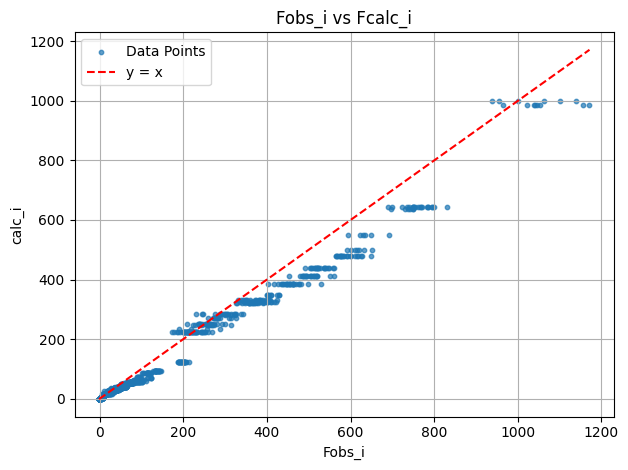

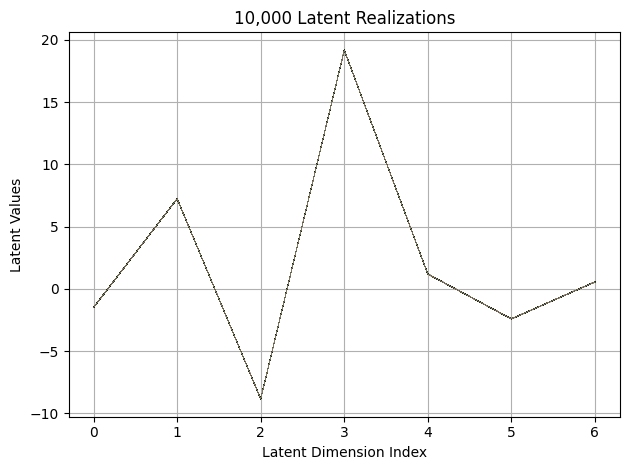

First 10 latent vectors from the VAE:
Sample 1: [-1.4819027185440063, 7.242790699005127, -8.848725318908691, 19.18062973022461, 1.1825339794158936, -2.416778802871704, 0.5515344142913818]
Sample 2: [-1.4961161613464355, 7.224910259246826, -8.85453987121582, 19.18678855895996, 1.1906254291534424, -2.4209706783294678, 0.5439894795417786]
Sample 3: [-1.4964500665664673, 7.231314659118652, -8.85296630859375, 19.180007934570312, 1.1887131929397583, -2.4196834564208984, 0.563117265701294]
Sample 4: [-1.4912854433059692, 7.236905574798584, -8.84189224243164, 19.1762752532959, 1.1841083765029907, -2.4119555950164795, 0.5474535226821899]
Sample 5: [-1.4862370491027832, 7.23952054977417, -8.849884033203125, 19.180864334106445, 1.178554654121399, -2.4271600246429443, 0.5566927194595337]
Sample 6: [-1.4908115863800049, 7.239696979522705, -8.847684860229492, 19.180522918701172, 1.1821600198745728, -2.413430690765381, 0.5575321316719055]
Sample 7: [-1.4881457090377808, 7.2362518310546875, -8.8603420

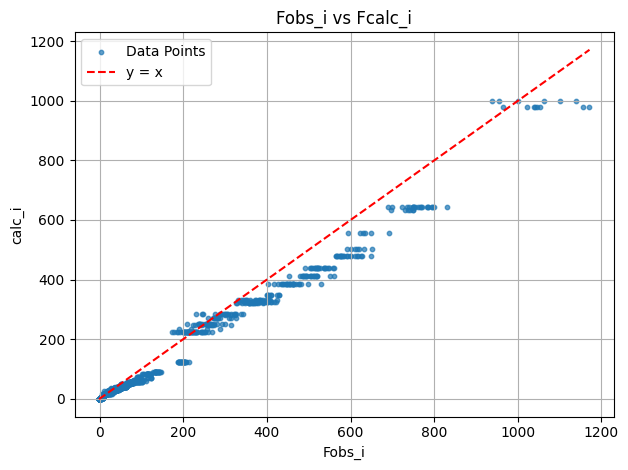

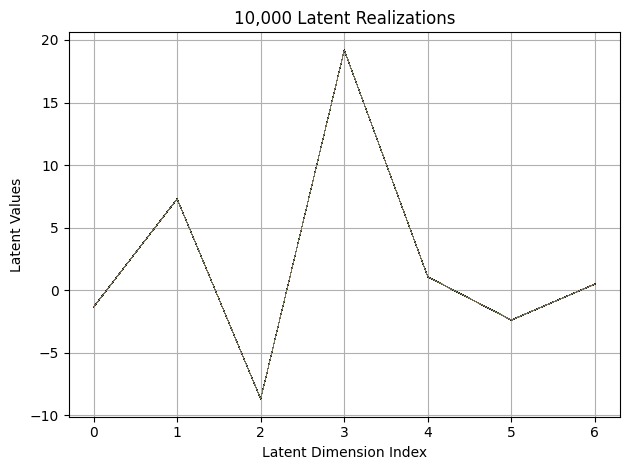

First 10 latent vectors from the VAE:
Sample 1: [-1.3491787910461426, 7.298216342926025, -8.708858489990234, 19.196392059326172, 1.0505319833755493, -2.3907034397125244, 0.4780859351158142]
Sample 2: [-1.3584961891174316, 7.290457248687744, -8.702844619750977, 19.200441360473633, 1.0546396970748901, -2.399301290512085, 0.4927580654621124]
Sample 3: [-1.3539313077926636, 7.290848255157471, -8.701719284057617, 19.189786911010742, 1.0620049238204956, -2.382534980773926, 0.48293769359588623]
Sample 4: [-1.339766263961792, 7.294428825378418, -8.712092399597168, 19.17609405517578, 1.0704699754714966, -2.3910069465637207, 0.48527562618255615]
Sample 5: [-1.3469057083129883, 7.2922892570495605, -8.71147632598877, 19.1845645904541, 1.0619807243347168, -2.4004061222076416, 0.48015978932380676]
Sample 6: [-1.3508528470993042, 7.287704944610596, -8.693058967590332, 19.198165893554688, 1.0611028671264648, -2.3845245838165283, 0.4944453835487366]
Sample 7: [-1.3406766653060913, 7.28035831451416, -8.

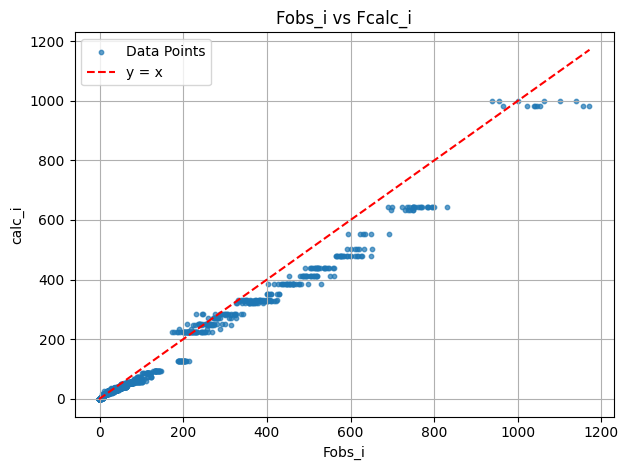

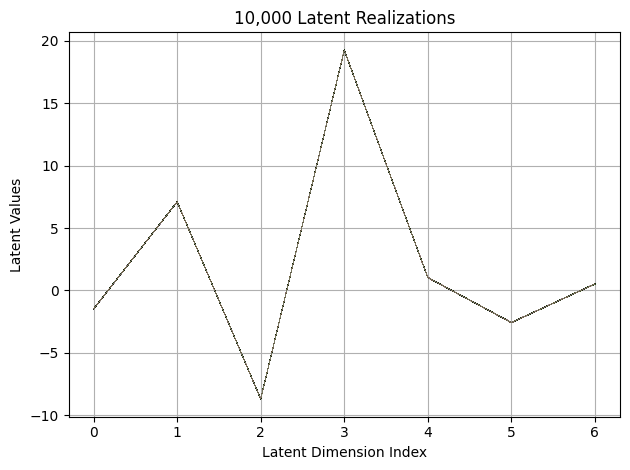

First 10 latent vectors from the VAE:
Sample 1: [-1.492396593093872, 7.092143535614014, -8.678008079528809, 19.236526489257812, 1.0480661392211914, -2.5664288997650146, 0.5189332365989685]
Sample 2: [-1.4784438610076904, 7.092312812805176, -8.678292274475098, 19.243728637695312, 1.0223743915557861, -2.5524258613586426, 0.5336607694625854]
Sample 3: [-1.4804706573486328, 7.085045337677002, -8.690228462219238, 19.241025924682617, 1.044927954673767, -2.5645806789398193, 0.5299102663993835]
Sample 4: [-1.4863089323043823, 7.114536762237549, -8.694977760314941, 19.253549575805664, 1.0316990613937378, -2.5692355632781982, 0.5180517435073853]
Sample 5: [-1.4847644567489624, 7.093808650970459, -8.682058334350586, 19.243810653686523, 1.0345627069473267, -2.5718727111816406, 0.5209469199180603]
Sample 6: [-1.4868708848953247, 7.096951007843018, -8.691179275512695, 19.23541259765625, 1.025258183479309, -2.5741801261901855, 0.5164361000061035]
Sample 7: [-1.484760046005249, 7.1051530838012695, -8.

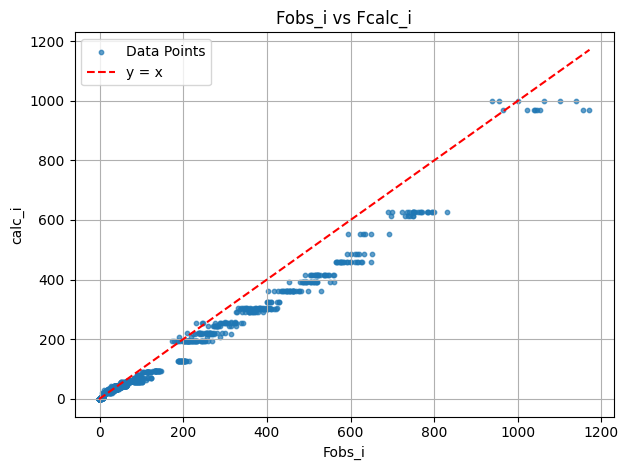

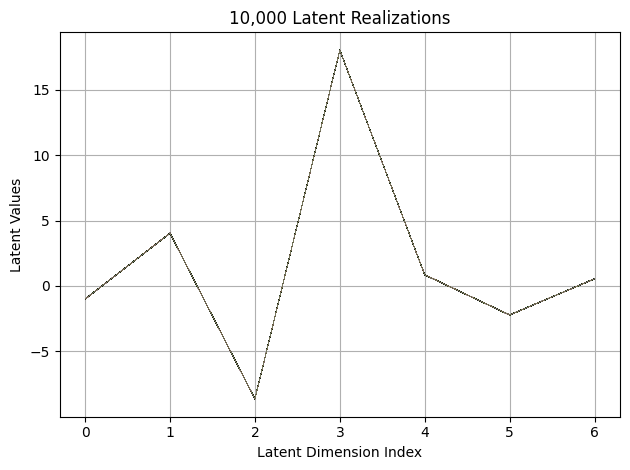

First 10 latent vectors from the VAE:
Sample 1: [-0.991753876209259, 4.038842678070068, -8.647971153259277, 18.01437759399414, 0.849482536315918, -2.2187976837158203, 0.5358725190162659]
Sample 2: [-0.9940886497497559, 4.029018878936768, -8.631681442260742, 18.019046783447266, 0.8542519807815552, -2.212843179702759, 0.5445832014083862]
Sample 3: [-1.0016300678253174, 4.02116584777832, -8.627046585083008, 18.009986877441406, 0.8481813669204712, -2.217841386795044, 0.5384491086006165]
Sample 4: [-0.9995538592338562, 4.036246299743652, -8.629053115844727, 18.01179313659668, 0.8607104420661926, -2.2236337661743164, 0.5523800849914551]
Sample 5: [-0.9942917823791504, 4.030545234680176, -8.6344633102417, 18.014263153076172, 0.8517111539840698, -2.2253122329711914, 0.5413477420806885]
Sample 6: [-0.9936761856079102, 4.0314154624938965, -8.6295747756958, 18.012907028198242, 0.8375680446624756, -2.2064690589904785, 0.5370649099349976]
Sample 7: [-0.9990313649177551, 4.021252155303955, -8.621524

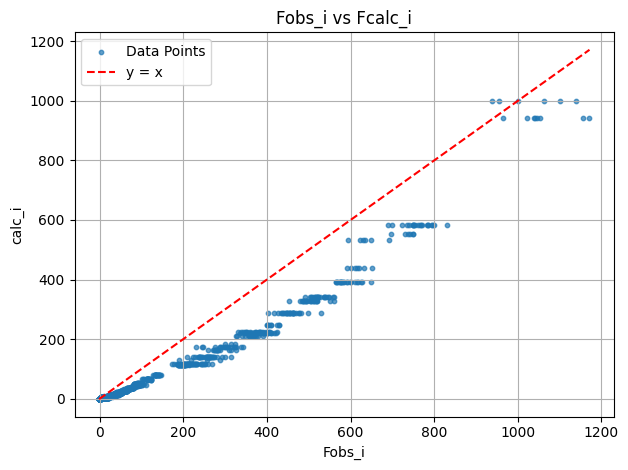

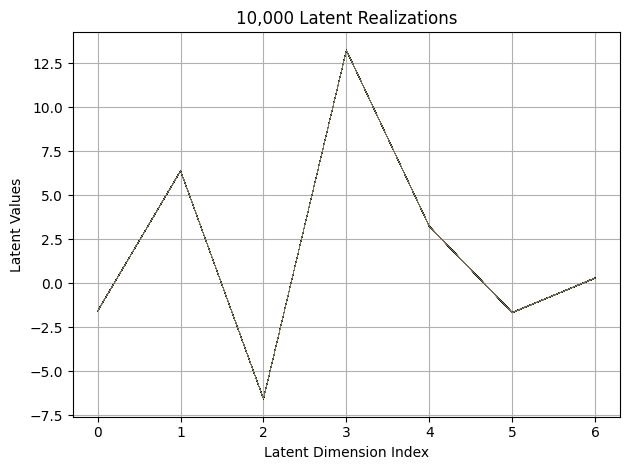

First 10 latent vectors from the VAE:
Sample 1: [-1.5756733417510986, 6.387735366821289, -6.564851760864258, 13.248517990112305, 3.241995334625244, -1.6648461818695068, 0.2955459952354431]
Sample 2: [-1.5739823579788208, 6.377060890197754, -6.569667339324951, 13.233834266662598, 3.225527048110962, -1.6680684089660645, 0.29765984416007996]
Sample 3: [-1.5807642936706543, 6.393970966339111, -6.551167011260986, 13.254329681396484, 3.2417140007019043, -1.6623061895370483, 0.29607677459716797]
Sample 4: [-1.5645548105239868, 6.387098789215088, -6.569844722747803, 13.251469612121582, 3.221156597137451, -1.6537792682647705, 0.29001158475875854]
Sample 5: [-1.5732516050338745, 6.399313449859619, -6.559143543243408, 13.247564315795898, 3.2341532707214355, -1.6583366394042969, 0.2851712107658386]
Sample 6: [-1.5749255418777466, 6.400297164916992, -6.556556701660156, 13.238669395446777, 3.2352488040924072, -1.659514307975769, 0.29413673281669617]
Sample 7: [-1.5701439380645752, 6.387547492980957,

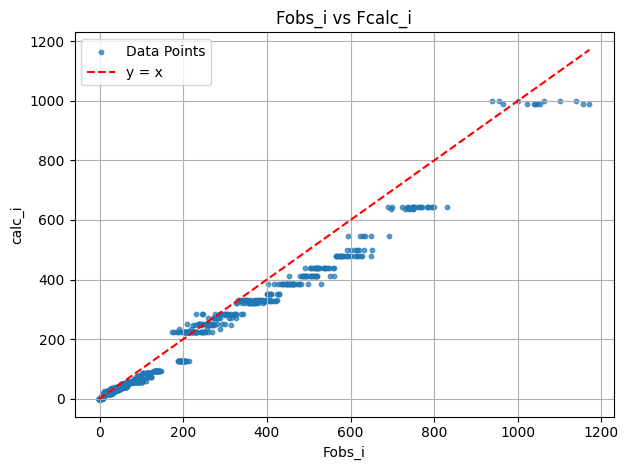

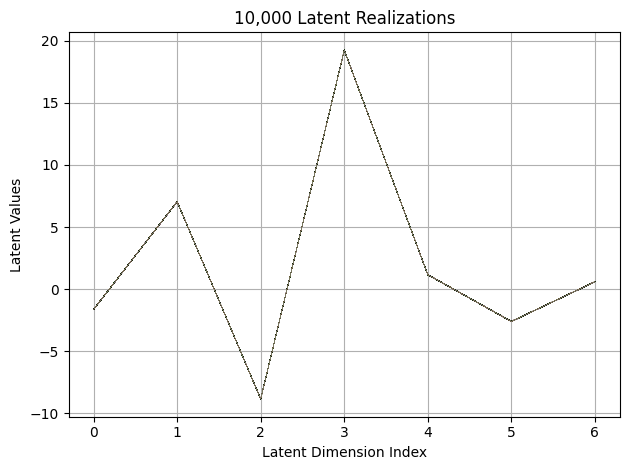

First 10 latent vectors from the VAE:
Sample 1: [-1.6242140531539917, 7.04347562789917, -8.831366539001465, 19.232738494873047, 1.1664557456970215, -2.5898165702819824, 0.5876951813697815]
Sample 2: [-1.6248294115066528, 7.034078598022461, -8.826301574707031, 19.229961395263672, 1.1593928337097168, -2.5899152755737305, 0.5958999395370483]
Sample 3: [-1.635284423828125, 7.045409679412842, -8.82249927520752, 19.226137161254883, 1.1658174991607666, -2.602172613143921, 0.5906678438186646]
Sample 4: [-1.6292314529418945, 7.040927410125732, -8.823713302612305, 19.235088348388672, 1.1689190864562988, -2.595625638961792, 0.5993830561637878]
Sample 5: [-1.6353346109390259, 7.026453018188477, -8.834151268005371, 19.245532989501953, 1.1606436967849731, -2.5977838039398193, 0.5938502550125122]
Sample 6: [-1.6470303535461426, 7.0424604415893555, -8.833308219909668, 19.233064651489258, 1.1619007587432861, -2.593065023422241, 0.588013768196106]
Sample 7: [-1.6419556140899658, 7.035309791564941, -8.82

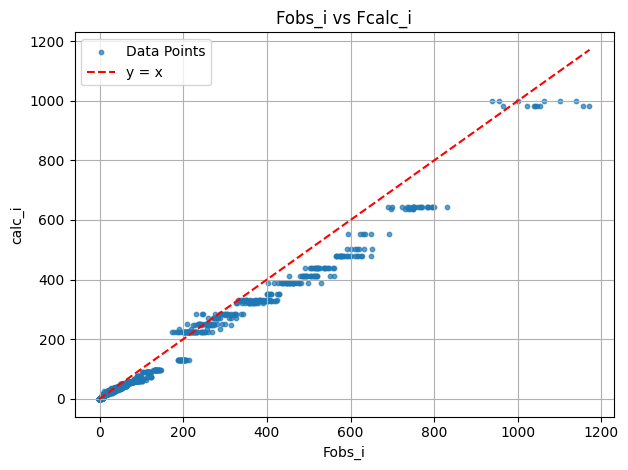

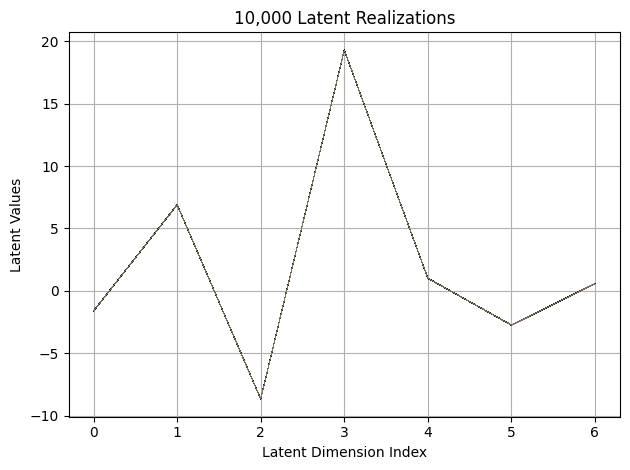

First 10 latent vectors from the VAE:
Sample 1: [-1.6164573431015015, 6.908397674560547, -8.67159652709961, 19.294828414916992, 0.9965307116508484, -2.7359707355499268, 0.5647436380386353]
Sample 2: [-1.6177574396133423, 6.896035671234131, -8.665864944458008, 19.298622131347656, 0.9944623708724976, -2.763511896133423, 0.552439272403717]
Sample 3: [-1.6042276620864868, 6.90111780166626, -8.672880172729492, 19.30248260498047, 0.9900405406951904, -2.7639129161834717, 0.5707928538322449]
Sample 4: [-1.6173338890075684, 6.907410144805908, -8.658550262451172, 19.289854049682617, 1.0099331140518188, -2.767900228500366, 0.5652452111244202]
Sample 5: [-1.6192896366119385, 6.899319648742676, -8.675931930541992, 19.282360076904297, 1.005220651626587, -2.7697594165802, 0.5617246031761169]
Sample 6: [-1.6223658323287964, 6.893795013427734, -8.660170555114746, 19.27473258972168, 1.0067634582519531, -2.744375467300415, 0.5474762916564941]
Sample 7: [-1.620679497718811, 6.884946346282959, -8.683554649

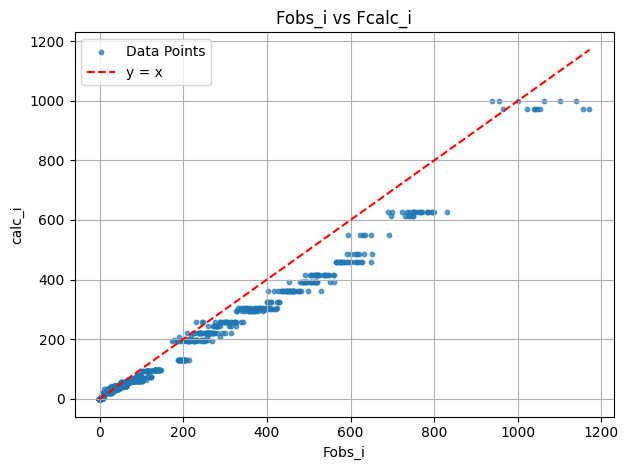

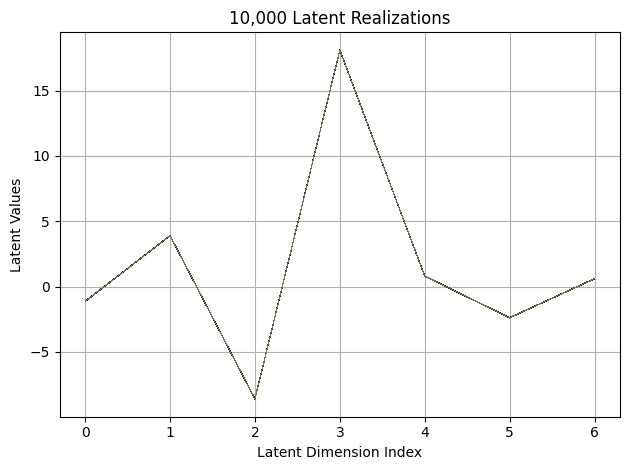

First 10 latent vectors from the VAE:
Sample 1: [-1.1268353462219238, 3.8991470336914062, -8.604966163635254, 18.09262466430664, 0.7954043745994568, -2.3967859745025635, 0.5997297763824463]
Sample 2: [-1.1538935899734497, 3.8915538787841797, -8.607400894165039, 18.07722282409668, 0.8111218810081482, -2.3892064094543457, 0.6039354205131531]
Sample 3: [-1.134714126586914, 3.899890422821045, -8.593812942504883, 18.096284866333008, 0.7999931573867798, -2.3803598880767822, 0.5945059061050415]
Sample 4: [-1.1347880363464355, 3.8970348834991455, -8.59882926940918, 18.097095489501953, 0.7925913333892822, -2.3805882930755615, 0.5977208614349365]
Sample 5: [-1.1233941316604614, 3.882826328277588, -8.59835147857666, 18.102872848510742, 0.7951950430870056, -2.3985705375671387, 0.5927578210830688]
Sample 6: [-1.1260861158370972, 3.8786489963531494, -8.611824989318848, 18.092647552490234, 0.7924727201461792, -2.395482301712036, 0.5883532762527466]
Sample 7: [-1.1471552848815918, 3.9004838466644287, 

<Figure size 640x480 with 0 Axes>

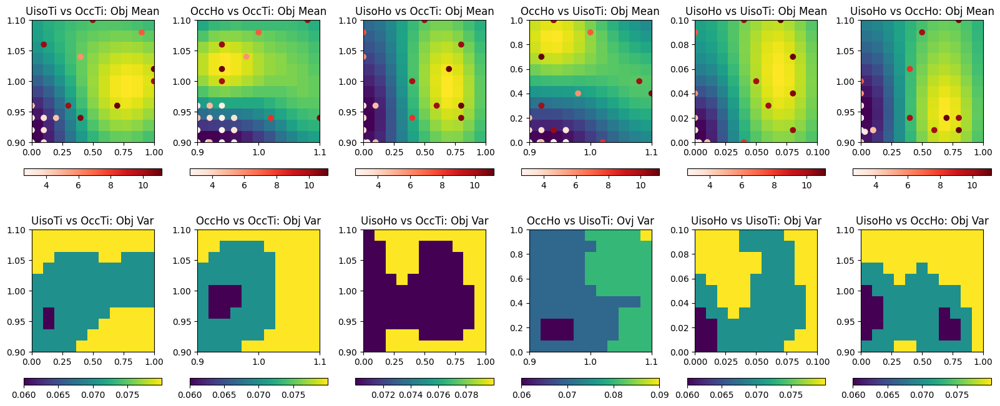

EI: [-1.          0.00692864  0.00501995 ...  0.00123836  0.00137914
  0.00148505]
Function eval #31
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9199999570846558, 0.0, 0.9199999570846558, 0.0]
[0.421597, 0.920386, 0.008262, 0.00325]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.5666
initial chi^2 5.4035e+05 with 2596 obs.
New scale: 0.5666
Cycle 0: 0.61s, Chi**2: 2.4287e+05 for 2596 obs., Lambda: 0,  Delta: 0.551, SVD=0
New scale: 0.5666
Maximum shift/esd = -131.961 for all cycles
Read f

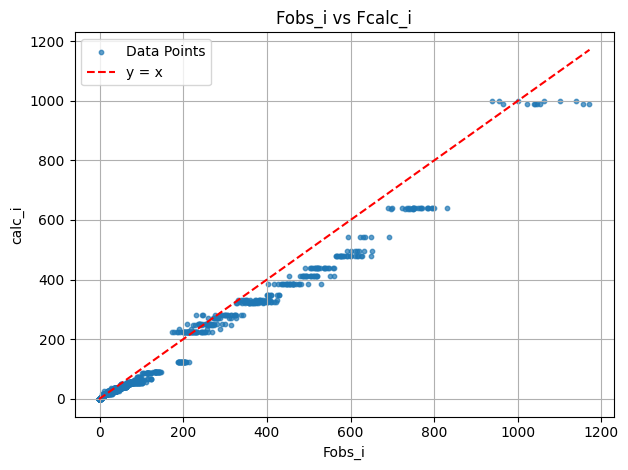

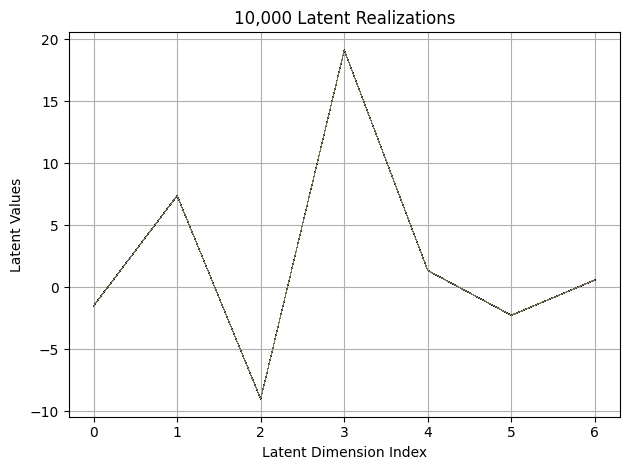

First 10 latent vectors from the VAE:
Sample 1: [-1.4891471862792969, 7.380773544311523, -9.020561218261719, 19.129545211791992, 1.3488893508911133, -2.2687950134277344, 0.5846013426780701]
Sample 2: [-1.4951850175857544, 7.379534721374512, -9.015730857849121, 19.12877082824707, 1.3554764986038208, -2.2722396850585938, 0.592923641204834]
Sample 3: [-1.5157005786895752, 7.387312412261963, -9.010336875915527, 19.112606048583984, 1.3349238634109497, -2.2674479484558105, 0.5882798433303833]
Sample 4: [-1.4978281259536743, 7.379622459411621, -9.014019012451172, 19.123077392578125, 1.3560724258422852, -2.2714099884033203, 0.5963665843009949]
Sample 5: [-1.5055025815963745, 7.380959987640381, -9.021512985229492, 19.12360382080078, 1.344695806503296, -2.2649803161621094, 0.5742141008377075]
Sample 6: [-1.5030549764633179, 7.390364646911621, -9.015235900878906, 19.125350952148438, 1.3497451543807983, -2.2546725273132324, 0.581404983997345]
Sample 7: [-1.4985806941986084, 7.379064083099365, -9.0

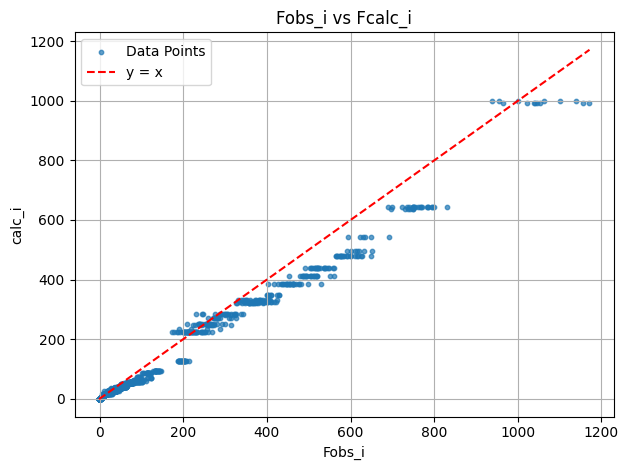

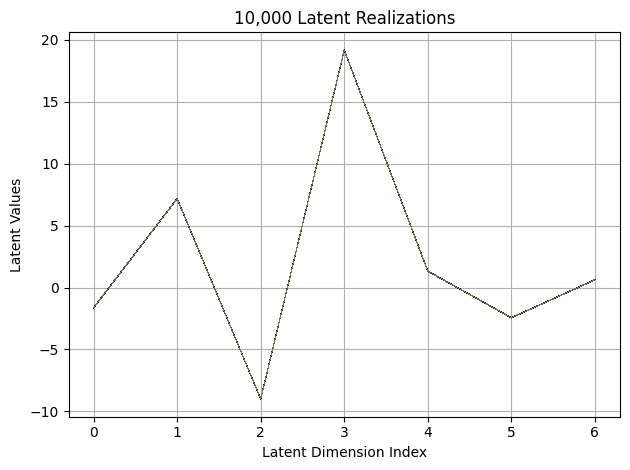

First 10 latent vectors from the VAE:
Sample 1: [-1.6495652198791504, 7.175547122955322, -9.001371383666992, 19.160070419311523, 1.312606930732727, -2.4385812282562256, 0.6328949928283691]
Sample 2: [-1.645621657371521, 7.172823429107666, -9.000463485717773, 19.181915283203125, 1.3270975351333618, -2.4274837970733643, 0.627070963382721]
Sample 3: [-1.633465051651001, 7.1880059242248535, -8.993439674377441, 19.17827033996582, 1.3198611736297607, -2.4477763175964355, 0.6348981857299805]
Sample 4: [-1.6390022039413452, 7.182413578033447, -9.001078605651855, 19.156051635742188, 1.3188518285751343, -2.446169853210449, 0.623950183391571]
Sample 5: [-1.6394574642181396, 7.171970367431641, -8.99252700805664, 19.17741584777832, 1.3177669048309326, -2.437591075897217, 0.6254516243934631]
Sample 6: [-1.6355376243591309, 7.177823543548584, -8.9977445602417, 19.177021026611328, 1.332872748374939, -2.4529995918273926, 0.6330849528312683]
Sample 7: [-1.6313135623931885, 7.174744129180908, -9.01066780

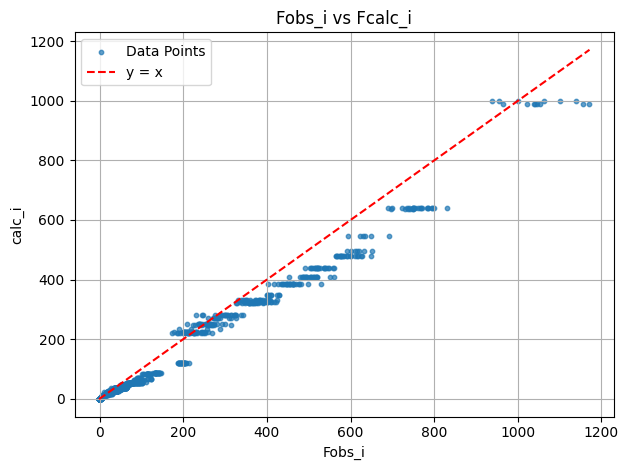

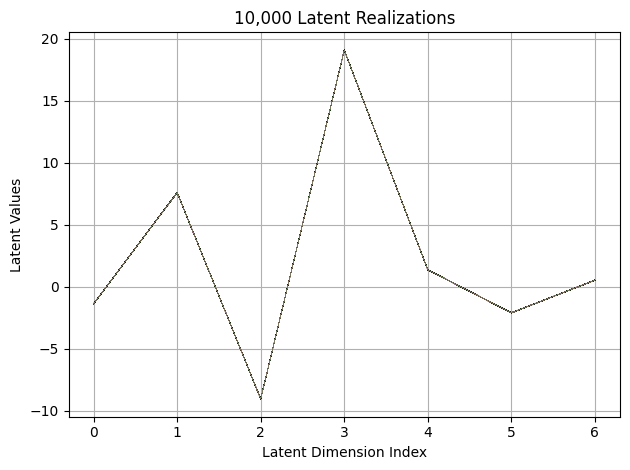

First 10 latent vectors from the VAE:
Sample 1: [-1.3588937520980835, 7.591623783111572, -9.01775074005127, 19.07701301574707, 1.3711732625961304, -2.083632230758667, 0.5368990898132324]
Sample 2: [-1.3566851615905762, 7.584079265594482, -9.019655227661133, 19.072399139404297, 1.3658424615859985, -2.089571475982666, 0.5224230885505676]
Sample 3: [-1.367427945137024, 7.5819854736328125, -9.014664649963379, 19.075328826904297, 1.378352403640747, -2.094667673110962, 0.5303139090538025]
Sample 4: [-1.3583405017852783, 7.580406188964844, -9.027017593383789, 19.07219696044922, 1.3655906915664673, -2.0943970680236816, 0.534633457660675]
Sample 5: [-1.3720576763153076, 7.609119892120361, -9.027167320251465, 19.064517974853516, 1.3672175407409668, -2.0935935974121094, 0.5373693108558655]
Sample 6: [-1.359044075012207, 7.578555583953857, -9.032672882080078, 19.065126419067383, 1.3724972009658813, -2.1003684997558594, 0.546714723110199]
Sample 7: [-1.3744971752166748, 7.5903801918029785, -9.03414

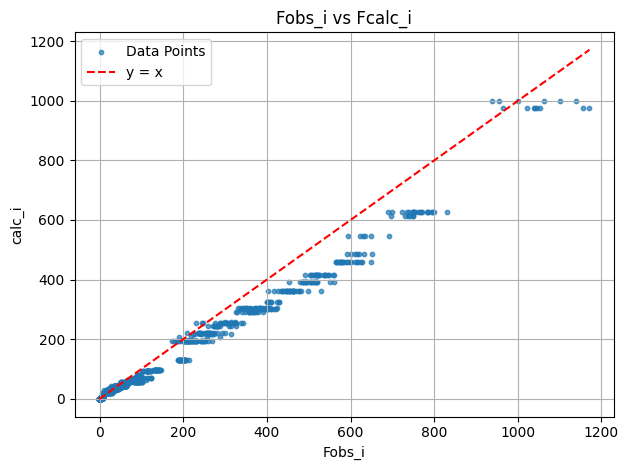

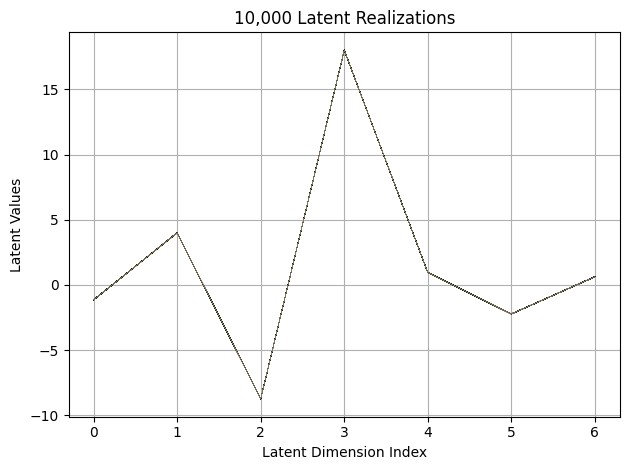

First 10 latent vectors from the VAE:
Sample 1: [-1.1420233249664307, 4.005836486816406, -8.745307922363281, 18.011127471923828, 0.956251323223114, -2.2312328815460205, 0.6202849745750427]
Sample 2: [-1.1340352296829224, 3.994319438934326, -8.742095947265625, 18.01757049560547, 0.9499244093894958, -2.2161014080047607, 0.6345825791358948]
Sample 3: [-1.135347843170166, 4.003026485443115, -8.748024940490723, 18.01530647277832, 0.9556266665458679, -2.2177231311798096, 0.6299017667770386]
Sample 4: [-1.1489818096160889, 4.002303123474121, -8.734002113342285, 18.011817932128906, 0.9463988542556763, -2.205465793609619, 0.6265246868133545]
Sample 5: [-1.1390255689620972, 3.9876058101654053, -8.750472068786621, 18.004976272583008, 0.9461056590080261, -2.2258362770080566, 0.6199290752410889]
Sample 6: [-1.139189600944519, 3.9871132373809814, -8.747376441955566, 18.012798309326172, 0.9645698070526123, -2.238302230834961, 0.6197621822357178]
Sample 7: [-1.1410311460494995, 3.999067783355713, -8.7

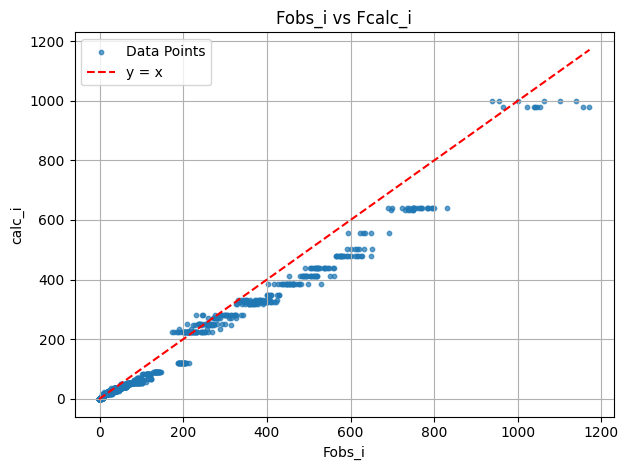

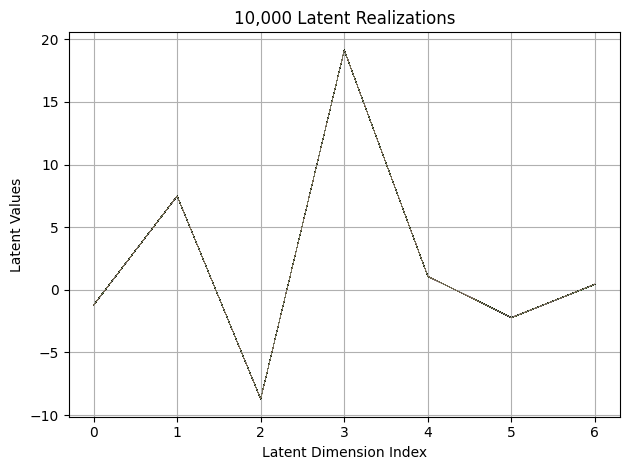

First 10 latent vectors from the VAE:
Sample 1: [-1.2291200160980225, 7.473248481750488, -8.719256401062012, 19.155797958374023, 1.0715439319610596, -2.221681594848633, 0.45466163754463196]
Sample 2: [-1.2193957567214966, 7.4922404289245605, -8.708266258239746, 19.133298873901367, 1.0829589366912842, -2.233839511871338, 0.4359174966812134]
Sample 3: [-1.225355625152588, 7.498868465423584, -8.714263916015625, 19.126005172729492, 1.0928670167922974, -2.222928524017334, 0.4503726065158844]
Sample 4: [-1.2167079448699951, 7.4798903465271, -8.71096420288086, 19.13693618774414, 1.081674337387085, -2.221916913986206, 0.44698941707611084]
Sample 5: [-1.2154407501220703, 7.504633903503418, -8.702601432800293, 19.132219314575195, 1.0938913822174072, -2.2242980003356934, 0.4400699734687805]
Sample 6: [-1.2238014936447144, 7.489746570587158, -8.704422950744629, 19.1434326171875, 1.0954418182373047, -2.2114672660827637, 0.4421406090259552]
Sample 7: [-1.218385934829712, 7.4893999099731445, -8.71271

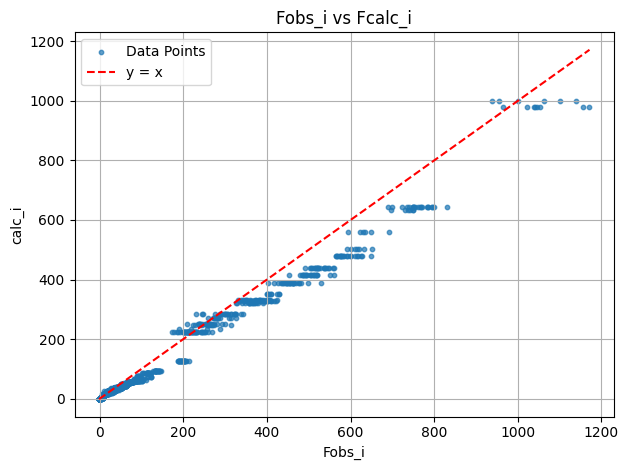

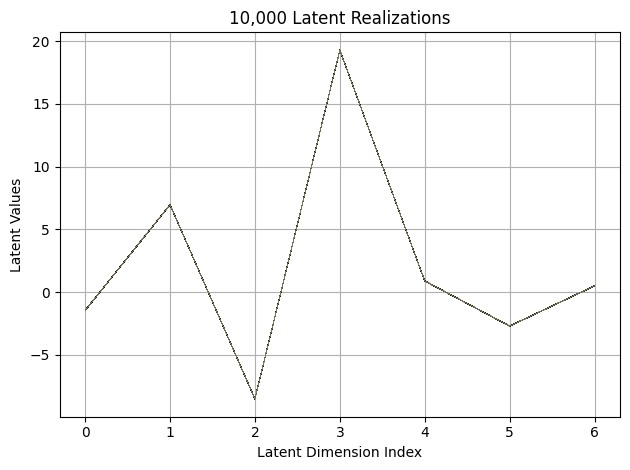

First 10 latent vectors from the VAE:
Sample 1: [-1.4721778631210327, 6.954034805297852, -8.522198677062988, 19.295759201049805, 0.891811728477478, -2.7086358070373535, 0.49426424503326416]
Sample 2: [-1.465080738067627, 6.960070610046387, -8.532268524169922, 19.299896240234375, 0.8884111046791077, -2.7123916149139404, 0.4776945412158966]
Sample 3: [-1.4669703245162964, 6.9472455978393555, -8.534773826599121, 19.290287017822266, 0.8875250220298767, -2.722210645675659, 0.4802050292491913]
Sample 4: [-1.475630760192871, 6.958769798278809, -8.522424697875977, 19.289649963378906, 0.8779506683349609, -2.724576950073242, 0.4827772080898285]
Sample 5: [-1.4767881631851196, 6.965851783752441, -8.515914916992188, 19.28790855407715, 0.8839364051818848, -2.7079923152923584, 0.488983690738678]
Sample 6: [-1.4750536680221558, 6.956284523010254, -8.537732124328613, 19.306615829467773, 0.8850886225700378, -2.730222463607788, 0.4857234060764313]
Sample 7: [-1.479211688041687, 6.958250522613525, -8.527

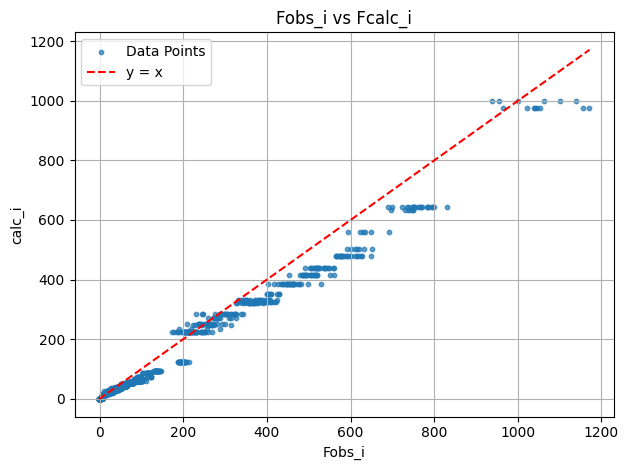

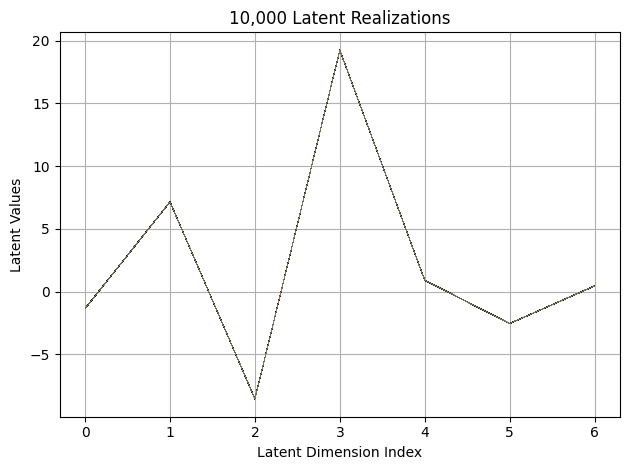

First 10 latent vectors from the VAE:
Sample 1: [-1.3439147472381592, 7.1589555740356445, -8.543761253356934, 19.238462448120117, 0.9097267389297485, -2.5454039573669434, 0.4606550335884094]
Sample 2: [-1.342476487159729, 7.152342319488525, -8.54318904876709, 19.237306594848633, 0.9116391539573669, -2.532942771911621, 0.4494019150733948]
Sample 3: [-1.330446481704712, 7.156932353973389, -8.542567253112793, 19.246234893798828, 0.916702926158905, -2.539499282836914, 0.4681340754032135]
Sample 4: [-1.3452327251434326, 7.146735191345215, -8.541471481323242, 19.258987426757812, 0.9071618914604187, -2.5472047328948975, 0.45742520689964294]
Sample 5: [-1.342180609703064, 7.157297611236572, -8.539487838745117, 19.248310089111328, 0.9175516963005066, -2.5508460998535156, 0.45556122064590454]
Sample 6: [-1.356870412826538, 7.141046047210693, -8.546134948730469, 19.246503829956055, 0.9003691673278809, -2.549431800842285, 0.45213478803634644]
Sample 7: [-1.3448593616485596, 7.162608623504639, -8.5

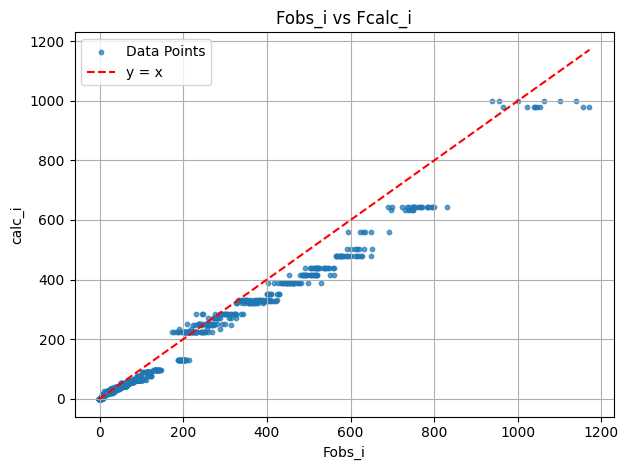

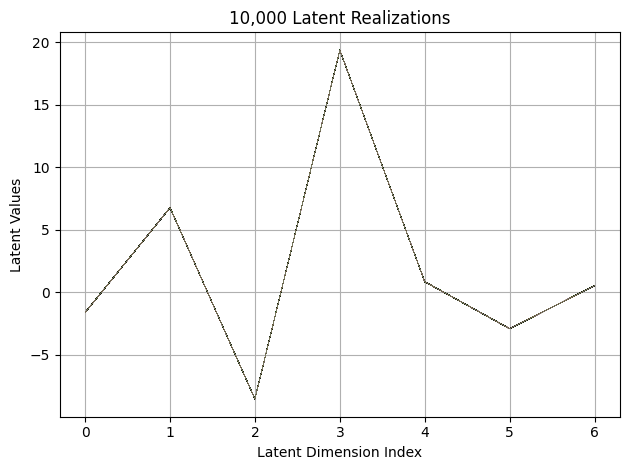

First 10 latent vectors from the VAE:
Sample 1: [-1.6005806922912598, 6.768834114074707, -8.500930786132812, 19.342998504638672, 0.8546870946884155, -2.902374505996704, 0.525505542755127]
Sample 2: [-1.6000102758407593, 6.7560038566589355, -8.504782676696777, 19.355939865112305, 0.8640142679214478, -2.9041967391967773, 0.5256330370903015]
Sample 3: [-1.599974513053894, 6.771092414855957, -8.519837379455566, 19.346004486083984, 0.8398830890655518, -2.8959743976593018, 0.5241475701332092]
Sample 4: [-1.609560251235962, 6.7631378173828125, -8.51645565032959, 19.3422794342041, 0.8603092432022095, -2.9020955562591553, 0.5298423767089844]
Sample 5: [-1.6100139617919922, 6.7576093673706055, -8.505754470825195, 19.345849990844727, 0.8552374243736267, -2.8994228839874268, 0.5345517992973328]
Sample 6: [-1.6038012504577637, 6.762279987335205, -8.499126434326172, 19.34988021850586, 0.8556149005889893, -2.908107280731201, 0.5400335788726807]
Sample 7: [-1.6036498546600342, 6.7618842124938965, -8.5

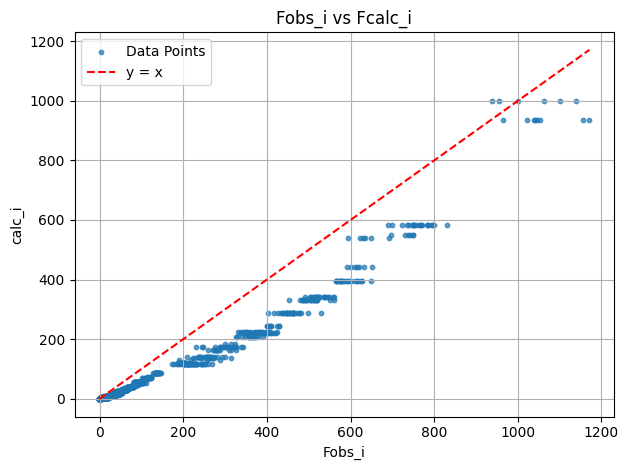

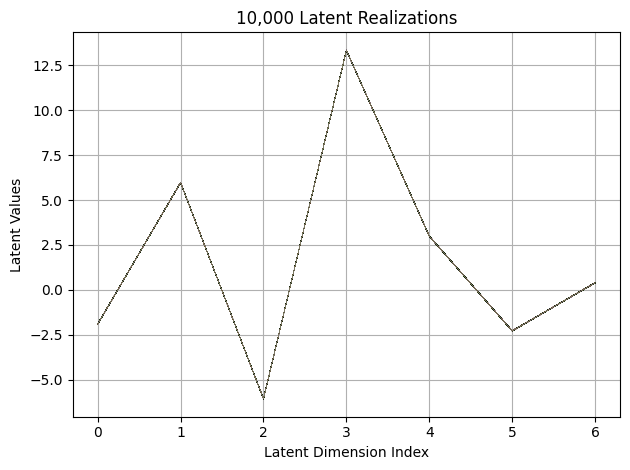

First 10 latent vectors from the VAE:
Sample 1: [-1.9139009714126587, 5.971057891845703, -6.0681562423706055, 13.340277671813965, 2.9860315322875977, -2.2913544178009033, 0.38981303572654724]
Sample 2: [-1.90830397605896, 5.972598075866699, -6.06921911239624, 13.344482421875, 2.9769816398620605, -2.2960543632507324, 0.38989031314849854]
Sample 3: [-1.9133821725845337, 5.9828033447265625, -6.07708740234375, 13.336580276489258, 2.985804557800293, -2.2864201068878174, 0.3939771354198456]
Sample 4: [-1.91697096824646, 5.980825424194336, -6.065348148345947, 13.348812103271484, 2.9726696014404297, -2.290865898132324, 0.3941327631473541]
Sample 5: [-1.9117103815078735, 5.9712958335876465, -6.065589904785156, 13.352625846862793, 2.986499547958374, -2.291987895965576, 0.3914453089237213]
Sample 6: [-1.9232083559036255, 5.968230724334717, -6.080756664276123, 13.339957237243652, 2.992436408996582, -2.2955665588378906, 0.38825225830078125]
Sample 7: [-1.9130918979644775, 5.977206707000732, -6.0730

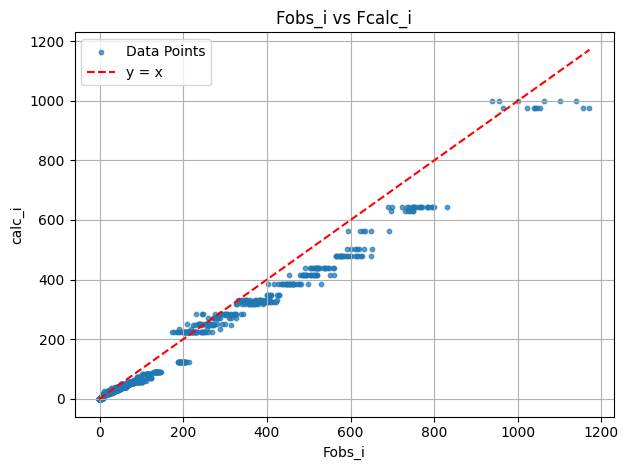

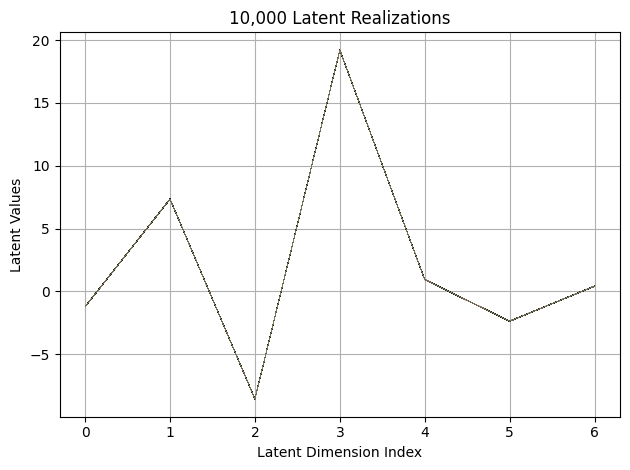

First 10 latent vectors from the VAE:
Sample 1: [-1.2144240140914917, 7.3542327880859375, -8.550859451293945, 19.203777313232422, 0.9301604628562927, -2.3722989559173584, 0.42696818709373474]
Sample 2: [-1.2207380533218384, 7.358066558837891, -8.539284706115723, 19.204357147216797, 0.9448462724685669, -2.3657784461975098, 0.4193679392337799]
Sample 3: [-1.2031681537628174, 7.337527275085449, -8.55574893951416, 19.20983123779297, 0.9387209415435791, -2.373790979385376, 0.430417537689209]
Sample 4: [-1.2212275266647339, 7.356973171234131, -8.557035446166992, 19.2043514251709, 0.9352661967277527, -2.370939254760742, 0.42127078771591187]
Sample 5: [-1.2140647172927856, 7.356915473937988, -8.555158615112305, 19.188180923461914, 0.9432559609413147, -2.3697829246520996, 0.414768785238266]
Sample 6: [-1.217902421951294, 7.337117671966553, -8.555920600891113, 19.19349479675293, 0.9470449686050415, -2.35992169380188, 0.42770740389823914]
Sample 7: [-1.2146116495132446, 7.340242385864258, -8.5518

<Figure size 640x480 with 0 Axes>

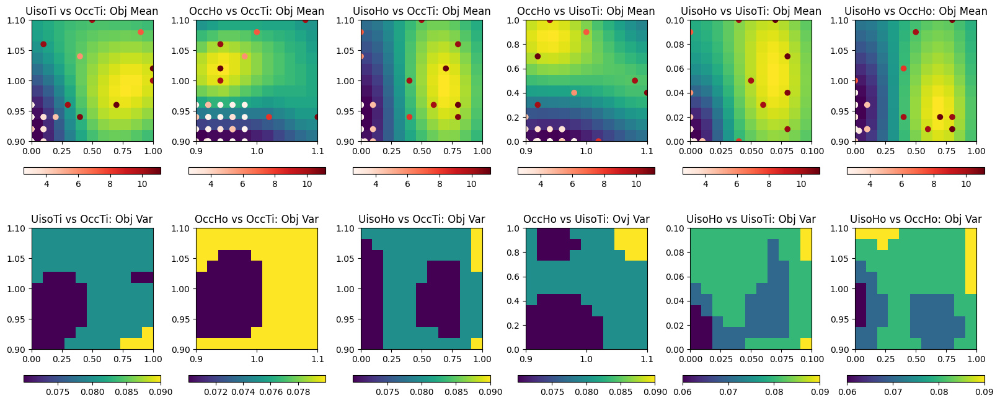

EI: [-1.          0.00560764  0.00391669 ...  0.00152379  0.00167144
  0.00178201]
Function eval #41
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.8999999761581421, 0.009999999776482582, 0.9599999785423279, 0.0]
[0.421597, 0.920386, 0.008262, 0.00325]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.5355
initial chi^2 8.5004e+05 with 2596 obs.
New scale: 0.5355
Cycle 0: 0.62s, Chi**2: 2.733e+05 for 2596 obs., Lambda: 0,  Delta: 0.678, SVD=0
New scale: 0.5355
Maximum shift/esd = -156.418 for a

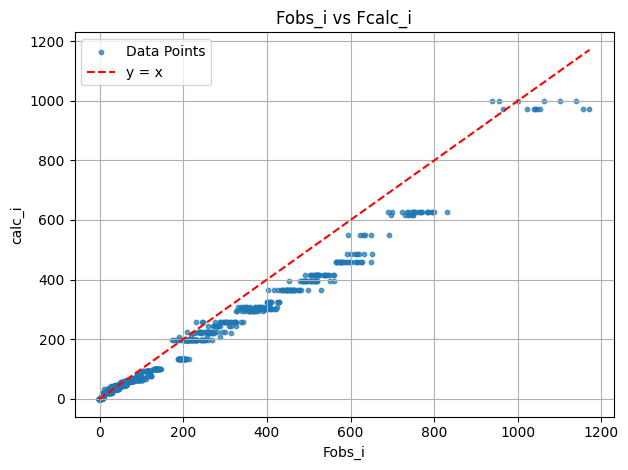

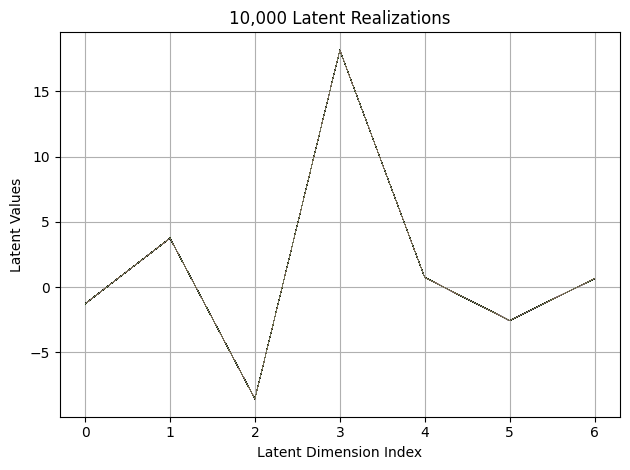

First 10 latent vectors from the VAE:
Sample 1: [-1.2687604427337646, 3.7588188648223877, -8.563088417053223, 18.168798446655273, 0.7396408319473267, -2.5582196712493896, 0.6709428429603577]
Sample 2: [-1.2747364044189453, 3.7595667839050293, -8.55895709991455, 18.16053581237793, 0.7494587302207947, -2.5568315982818604, 0.6476698517799377]
Sample 3: [-1.2685716152191162, 3.7546427249908447, -8.55817985534668, 18.17469596862793, 0.7337331175804138, -2.5475618839263916, 0.6515933871269226]
Sample 4: [-1.2828384637832642, 3.75930118560791, -8.556050300598145, 18.172014236450195, 0.7482609748840332, -2.552123546600342, 0.6578089594841003]
Sample 5: [-1.2753649950027466, 3.7591397762298584, -8.572284698486328, 18.155933380126953, 0.7538306713104248, -2.563685178756714, 0.6609277725219727]
Sample 6: [-1.279604196548462, 3.758906841278076, -8.556714057922363, 18.16432762145996, 0.7311925888061523, -2.5572001934051514, 0.6632431149482727]
Sample 7: [-1.2671120166778564, 3.757516860961914, -8.5

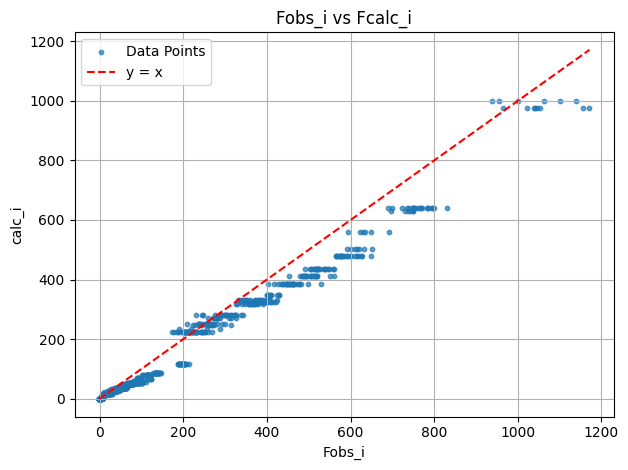

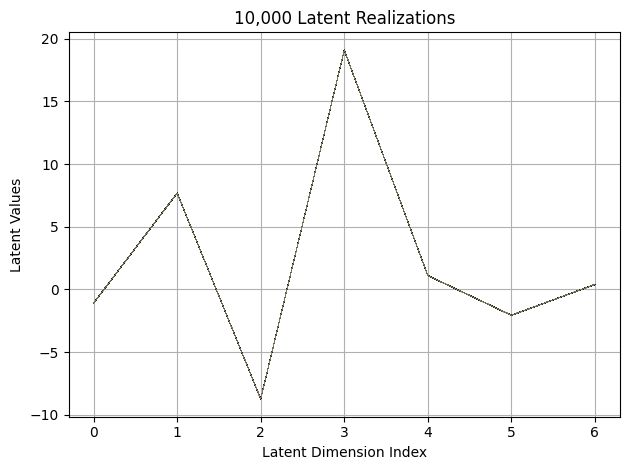

First 10 latent vectors from the VAE:
Sample 1: [-1.0826833248138428, 7.681644439697266, -8.73718547821045, 19.074344635009766, 1.1240235567092896, -2.0630695819854736, 0.40207064151763916]
Sample 2: [-1.095899224281311, 7.687338829040527, -8.724228858947754, 19.08358383178711, 1.1155450344085693, -2.057875633239746, 0.3938067853450775]
Sample 3: [-1.092292308807373, 7.695162296295166, -8.727093696594238, 19.080623626708984, 1.0979039669036865, -2.0671401023864746, 0.39349424839019775]
Sample 4: [-1.0783952474594116, 7.689941883087158, -8.722230911254883, 19.079896926879883, 1.1043908596038818, -2.063844919204712, 0.4077003002166748]
Sample 5: [-1.0850825309753418, 7.686429023742676, -8.736021041870117, 19.096086502075195, 1.1055368185043335, -2.0647785663604736, 0.3974086344242096]
Sample 6: [-1.087997555732727, 7.682068347930908, -8.720963478088379, 19.090662002563477, 1.104377269744873, -2.077205181121826, 0.3997957408428192]
Sample 7: [-1.0987426042556763, 7.684460639953613, -8.734

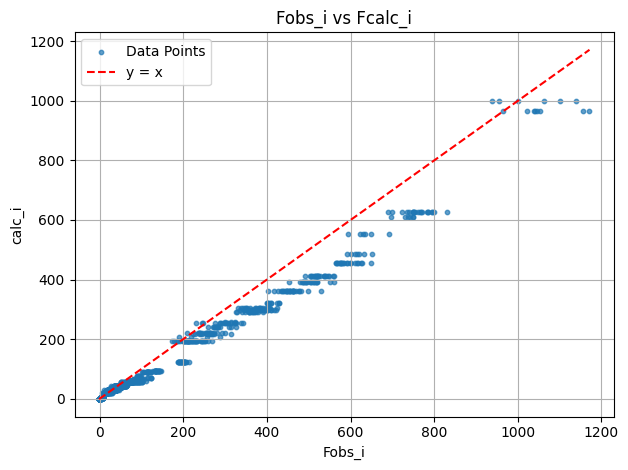

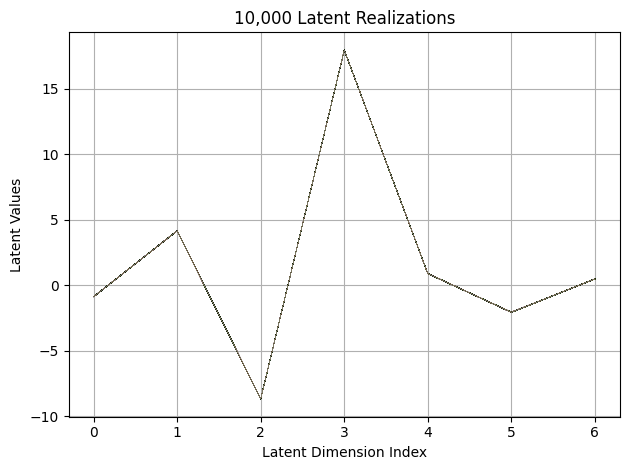

First 10 latent vectors from the VAE:
Sample 1: [-0.8748093247413635, 4.162599086761475, -8.663387298583984, 17.936080932617188, 0.8959681391716003, -2.051661491394043, 0.49077460169792175]
Sample 2: [-0.866706371307373, 4.168968677520752, -8.653152465820312, 17.95115852355957, 0.9055619239807129, -2.0495119094848633, 0.5022819638252258]
Sample 3: [-0.8710635304450989, 4.1724019050598145, -8.685467720031738, 17.93979263305664, 0.8993492126464844, -2.0615129470825195, 0.49673590064048767]
Sample 4: [-0.8680136799812317, 4.159904479980469, -8.670280456542969, 17.95276641845703, 0.9075447916984558, -2.0609841346740723, 0.4906059503555298]
Sample 5: [-0.8639265894889832, 4.160323143005371, -8.676368713378906, 17.950746536254883, 0.9024536609649658, -2.047468900680542, 0.49514326453208923]
Sample 6: [-0.8474448323249817, 4.15347957611084, -8.660588264465332, 17.946151733398438, 0.8964407444000244, -2.05418062210083, 0.49678343534469604]
Sample 7: [-0.868264377117157, 4.150890827178955, -8.6

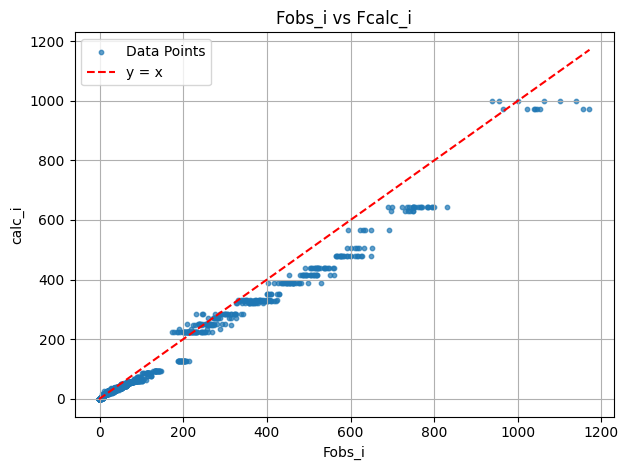

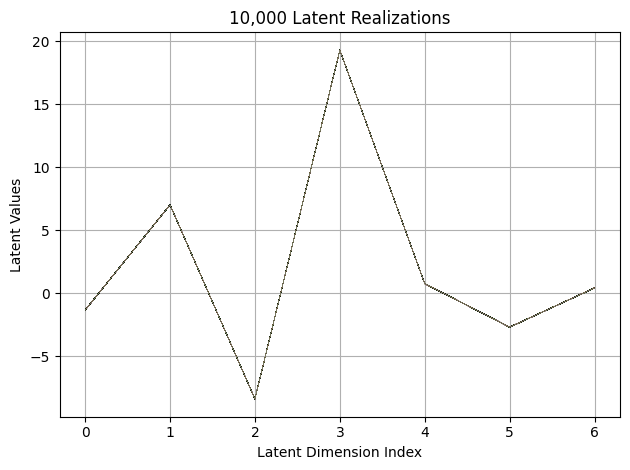

First 10 latent vectors from the VAE:
Sample 1: [-1.326012372970581, 7.019347667694092, -8.386265754699707, 19.290929794311523, 0.7706618309020996, -2.703831434249878, 0.4113443195819855]
Sample 2: [-1.3325045108795166, 7.021124839782715, -8.387068748474121, 19.293067932128906, 0.7621907591819763, -2.707709312438965, 0.4254767596721649]
Sample 3: [-1.3294754028320312, 7.012938976287842, -8.389141082763672, 19.30499267578125, 0.7625742554664612, -2.7009568214416504, 0.42345014214515686]
Sample 4: [-1.332836627960205, 7.015264987945557, -8.3930025100708, 19.309602737426758, 0.7855486273765564, -2.6976428031921387, 0.4314018487930298]
Sample 5: [-1.343380331993103, 7.0331878662109375, -8.375442504882812, 19.307649612426758, 0.7631000280380249, -2.6870646476745605, 0.4236449897289276]
Sample 6: [-1.327757716178894, 7.015122890472412, -8.394680976867676, 19.311241149902344, 0.7736235857009888, -2.6859681606292725, 0.4322640299797058]
Sample 7: [-1.331739902496338, 7.025908946990967, -8.3928

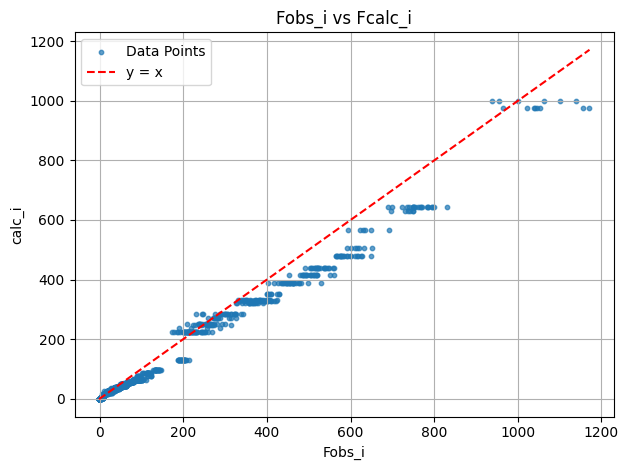

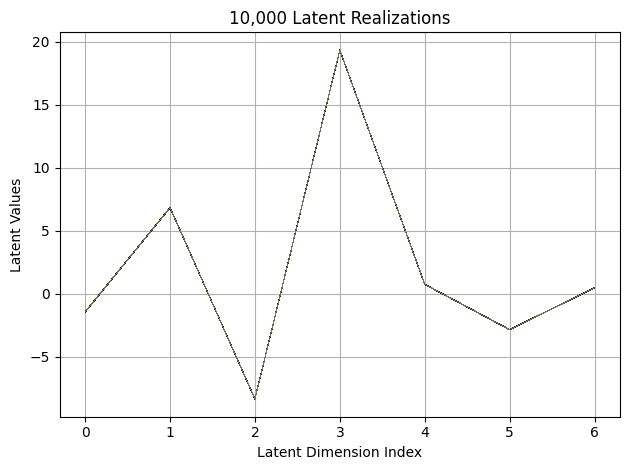

First 10 latent vectors from the VAE:
Sample 1: [-1.4612736701965332, 6.831452369689941, -8.368346214294434, 19.354984283447266, 0.7343045473098755, -2.8691868782043457, 0.452363520860672]
Sample 2: [-1.4670002460479736, 6.820375919342041, -8.356229782104492, 19.347900390625, 0.7289745211601257, -2.8600707054138184, 0.4717048704624176]
Sample 3: [-1.4499188661575317, 6.815850257873535, -8.359776496887207, 19.360679626464844, 0.7359513640403748, -2.874267339706421, 0.4494068920612335]
Sample 4: [-1.462722659111023, 6.832218170166016, -8.371373176574707, 19.34676170349121, 0.7309087514877319, -2.862748622894287, 0.46367213129997253]
Sample 5: [-1.479798436164856, 6.824092864990234, -8.38524341583252, 19.3472900390625, 0.7349485754966736, -2.8717024326324463, 0.4640052914619446]
Sample 6: [-1.4714369773864746, 6.837443828582764, -8.366302490234375, 19.35055160522461, 0.7306536436080933, -2.869248151779175, 0.4651722311973572]
Sample 7: [-1.4546433687210083, 6.822162628173828, -8.370521545

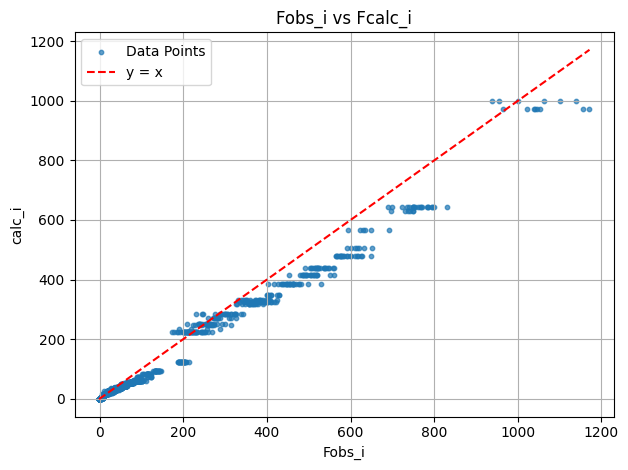

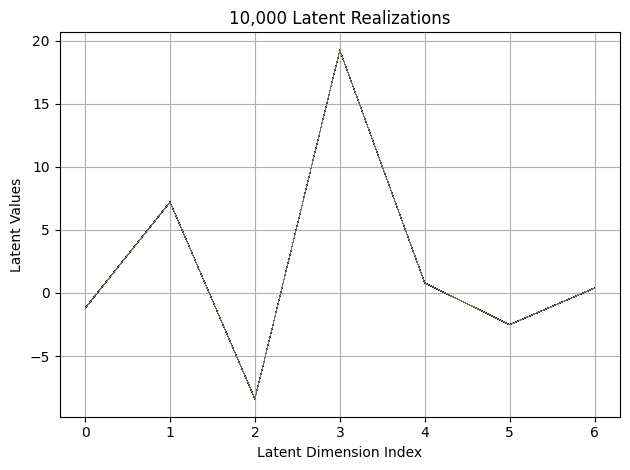

First 10 latent vectors from the VAE:
Sample 1: [-1.2083852291107178, 7.206879138946533, -8.400611877441406, 19.255767822265625, 0.8024596571922302, -2.5133140087127686, 0.388628214597702]
Sample 2: [-1.2104401588439941, 7.218303680419922, -8.399614334106445, 19.264596939086914, 0.8004060983657837, -2.518554925918579, 0.382726788520813]
Sample 3: [-1.203111171722412, 7.217510223388672, -8.412675857543945, 19.260177612304688, 0.7896971702575684, -2.515803098678589, 0.3969862759113312]
Sample 4: [-1.205033779144287, 7.213651180267334, -8.407374382019043, 19.252416610717773, 0.7850595712661743, -2.5119822025299072, 0.3947785198688507]
Sample 5: [-1.2095606327056885, 7.199961185455322, -8.406817436218262, 19.256980895996094, 0.7878769636154175, -2.522226572036743, 0.37654370069503784]
Sample 6: [-1.1980760097503662, 7.205260276794434, -8.411548614501953, 19.252836227416992, 0.791744589805603, -2.5134775638580322, 0.3757789731025696]
Sample 7: [-1.2062678337097168, 7.196073055267334, -8.396

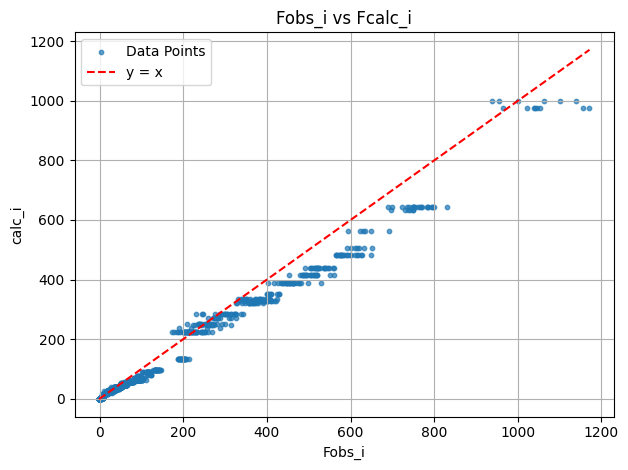

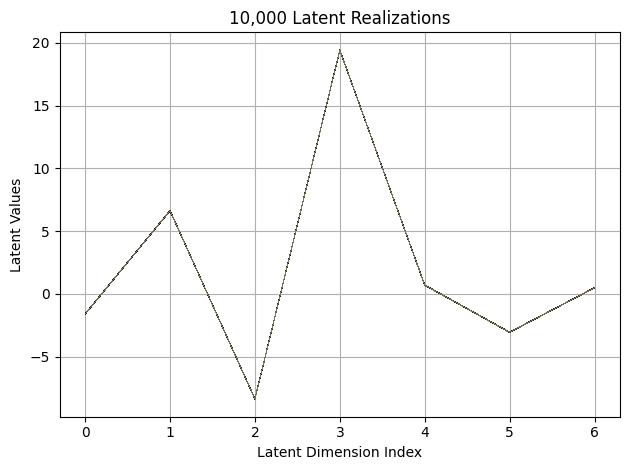

First 10 latent vectors from the VAE:
Sample 1: [-1.5868382453918457, 6.631963729858398, -8.366168975830078, 19.402889251708984, 0.7050013542175293, -3.037740707397461, 0.49815404415130615]
Sample 2: [-1.5895589590072632, 6.623969078063965, -8.34496784210205, 19.405277252197266, 0.6970404386520386, -3.0432605743408203, 0.4998411238193512]
Sample 3: [-1.5838664770126343, 6.623449802398682, -8.36153793334961, 19.410114288330078, 0.7230992913246155, -3.0524041652679443, 0.49901971220970154]
Sample 4: [-1.5989116430282593, 6.633213996887207, -8.338027954101562, 19.414125442504883, 0.6998486518859863, -3.044574737548828, 0.49933433532714844]
Sample 5: [-1.5908950567245483, 6.630258083343506, -8.350702285766602, 19.414859771728516, 0.7176656723022461, -3.0452489852905273, 0.49851152300834656]
Sample 6: [-1.5884411334991455, 6.618892192840576, -8.348889350891113, 19.415578842163086, 0.7169326543807983, -3.0534980297088623, 0.4908238649368286]
Sample 7: [-1.5954890251159668, 6.635379314422607,

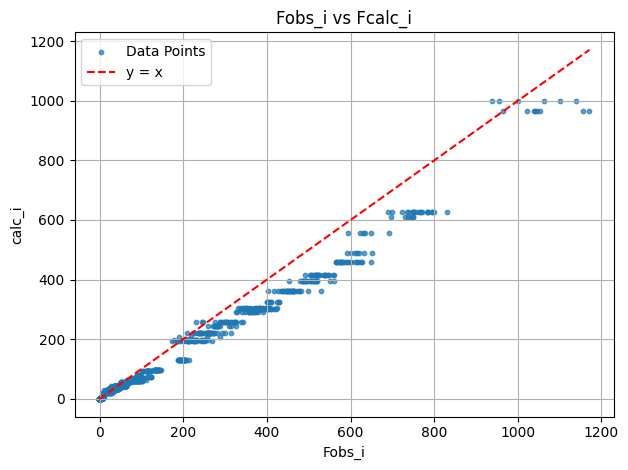

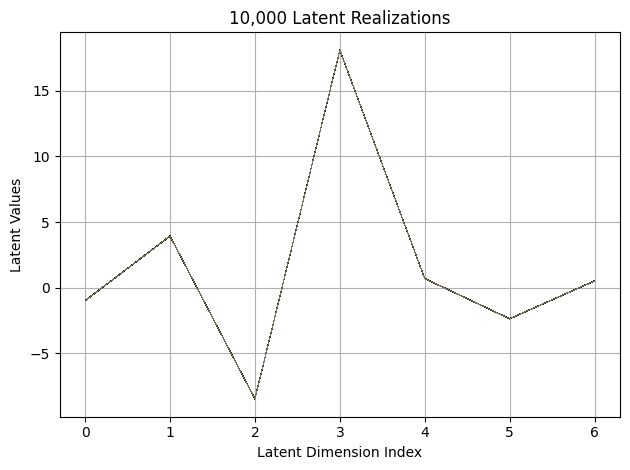

First 10 latent vectors from the VAE:
Sample 1: [-0.9854485988616943, 3.9331865310668945, -8.468544006347656, 18.09151268005371, 0.6911070942878723, -2.3722259998321533, 0.5204959511756897]
Sample 2: [-1.0060384273529053, 3.9221904277801514, -8.469840049743652, 18.09713363647461, 0.6988916397094727, -2.372499465942383, 0.5153584480285645]
Sample 3: [-0.9926266074180603, 3.9252190589904785, -8.466033935546875, 18.09218406677246, 0.6915212273597717, -2.377105474472046, 0.5273318886756897]
Sample 4: [-0.9891239404678345, 3.920313596725464, -8.48128604888916, 18.101497650146484, 0.6958242654800415, -2.368425130844116, 0.5284156203269958]
Sample 5: [-0.9948849678039551, 3.927215099334717, -8.476353645324707, 18.105953216552734, 0.7120142579078674, -2.3820853233337402, 0.5097589492797852]
Sample 6: [-0.9978505969047546, 3.930591583251953, -8.485350608825684, 18.100399017333984, 0.6898459792137146, -2.3684847354888916, 0.5112851858139038]
Sample 7: [-1.0018037557601929, 3.9339041709899902, -8

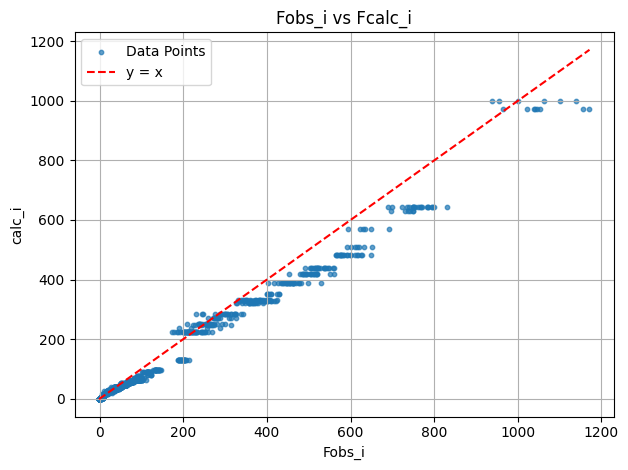

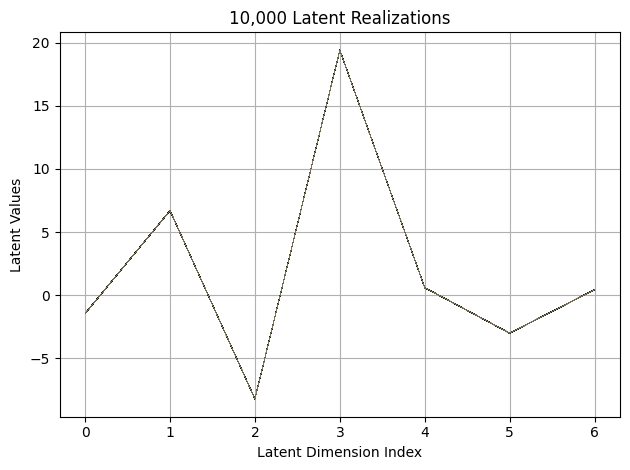

First 10 latent vectors from the VAE:
Sample 1: [-1.4488379955291748, 6.697610378265381, -8.208709716796875, 19.41253089904785, 0.5949746966362, -3.019859790802002, 0.4376491606235504]
Sample 2: [-1.4531686305999756, 6.689425468444824, -8.22485065460205, 19.40288734436035, 0.5981764197349548, -3.0021092891693115, 0.42914366722106934]
Sample 3: [-1.454601526260376, 6.693838119506836, -8.213160514831543, 19.415742874145508, 0.5861988067626953, -3.014289617538452, 0.42804646492004395]
Sample 4: [-1.4544178247451782, 6.690649032592773, -8.226669311523438, 19.40792465209961, 0.6059756278991699, -2.992981195449829, 0.42961329221725464]
Sample 5: [-1.4447230100631714, 6.696475505828857, -8.214314460754395, 19.40560531616211, 0.5958625674247742, -3.0056138038635254, 0.4079703986644745]
Sample 6: [-1.4561232328414917, 6.699723243713379, -8.216238975524902, 19.4106502532959, 0.5952422618865967, -3.006065845489502, 0.43575283885002136]
Sample 7: [-1.4527143239974976, 6.6949615478515625, -8.220212

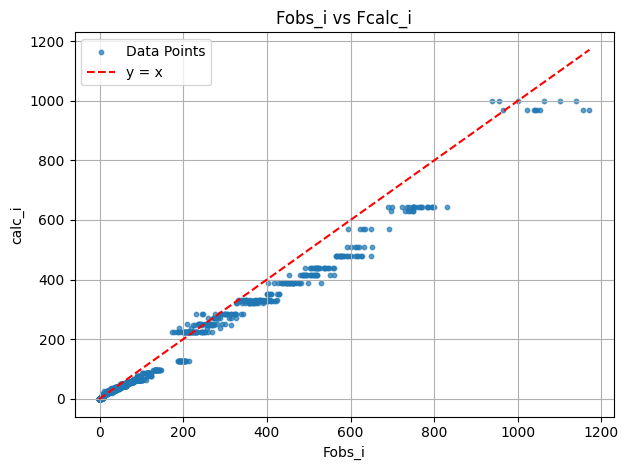

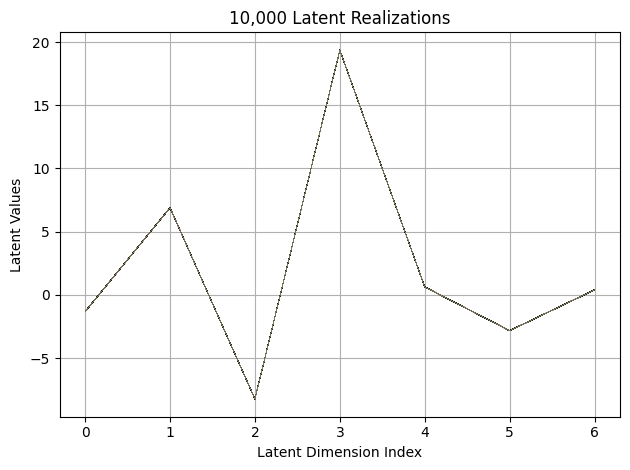

First 10 latent vectors from the VAE:
Sample 1: [-1.3317441940307617, 6.8902997970581055, -8.221184730529785, 19.355257034301758, 0.6335814595222473, -2.843716859817505, 0.39189639687538147]
Sample 2: [-1.3138530254364014, 6.880588531494141, -8.23223876953125, 19.341299057006836, 0.6306313872337341, -2.846674680709839, 0.39035454392433167]
Sample 3: [-1.337363600730896, 6.881951808929443, -8.232425689697266, 19.363513946533203, 0.6321964859962463, -2.835263967514038, 0.38550636172294617]
Sample 4: [-1.3264567852020264, 6.87771463394165, -8.234082221984863, 19.37106704711914, 0.6354768872261047, -2.8334081172943115, 0.3880296051502228]
Sample 5: [-1.3228120803833008, 6.881513595581055, -8.2417631149292, 19.348613739013672, 0.622761607170105, -2.8391659259796143, 0.39693549275398254]
Sample 6: [-1.3151254653930664, 6.901124000549316, -8.241796493530273, 19.368288040161133, 0.617401659488678, -2.8326618671417236, 0.388872355222702]
Sample 7: [-1.3149223327636719, 6.890775203704834, -8.226

<Figure size 640x480 with 0 Axes>

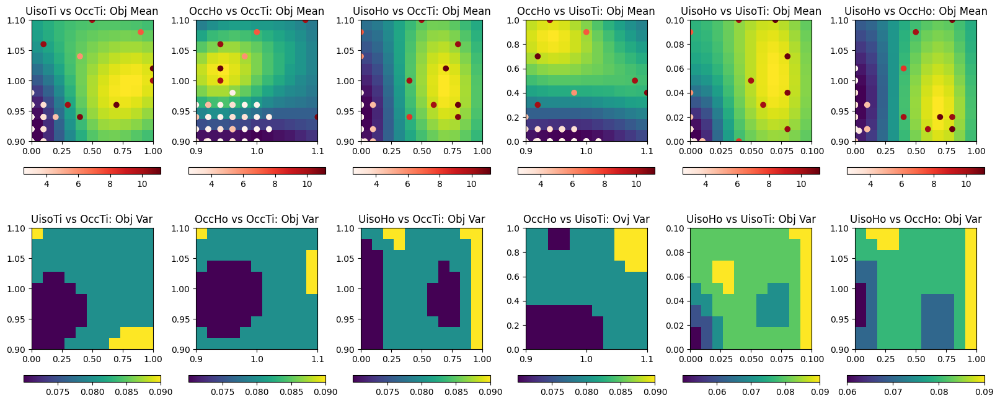

EI: [-1.          0.00487228  0.00358392 ...  0.00182975  0.0020215
  0.00217035]
Function eval #51
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.8999999761581421, 0.0, 1.0199999809265137, 0.0]
[0.421597, 0.920386, 0.008262, 0.00325]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4693
initial chi^2 1.2863e+06 with 2596 obs.
New scale: 0.4684
Cycle 0: 0.62s, Chi**2: 3.4033e+05 for 2596 obs., Lambda: 0,  Delta: 0.735, SVD=0
New scale: 0.4684
Maximum shift/esd = -203.004 for all cycles
Read fr

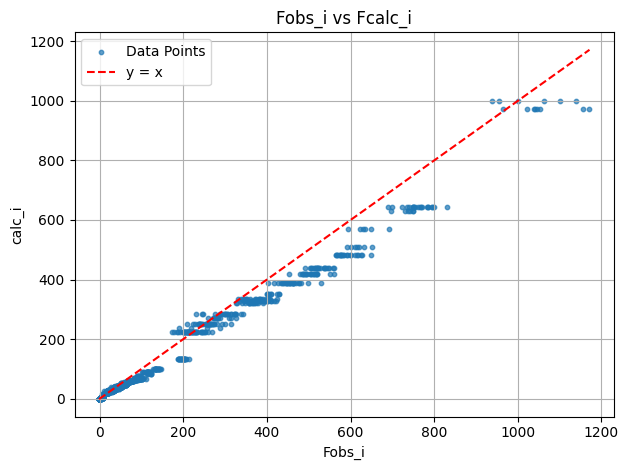

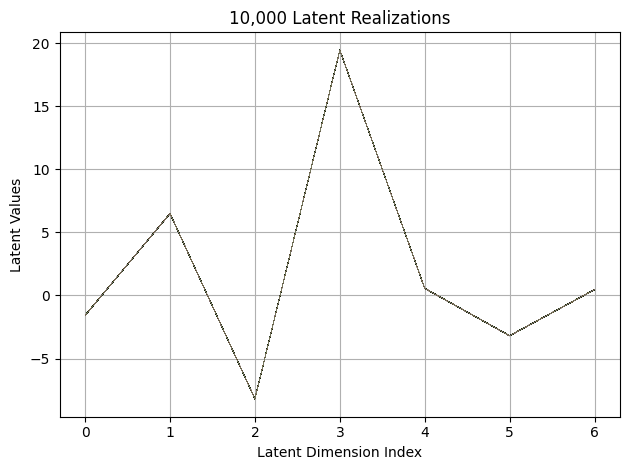

First 10 latent vectors from the VAE:
Sample 1: [-1.5729535818099976, 6.4913153648376465, -8.19345760345459, 19.46152687072754, 0.5651035308837891, -3.2002041339874268, 0.4716198146343231]
Sample 2: [-1.5749640464782715, 6.4960761070251465, -8.193119049072266, 19.461442947387695, 0.5622587203979492, -3.194720506668091, 0.46808671951293945]
Sample 3: [-1.5963612794876099, 6.5009026527404785, -8.194565773010254, 19.466615676879883, 0.568844735622406, -3.1896867752075195, 0.45392003655433655]
Sample 4: [-1.586691975593567, 6.500195503234863, -8.191011428833008, 19.46373748779297, 0.5690500736236572, -3.1888062953948975, 0.47552305459976196]
Sample 5: [-1.5802556276321411, 6.490306377410889, -8.200159072875977, 19.446603775024414, 0.5565847158432007, -3.187802791595459, 0.45762553811073303]
Sample 6: [-1.5815829038619995, 6.490553855895996, -8.18768310546875, 19.455917358398438, 0.5561047792434692, -3.1935389041900635, 0.47506269812583923]
Sample 7: [-1.5803848505020142, 6.499454021453857,

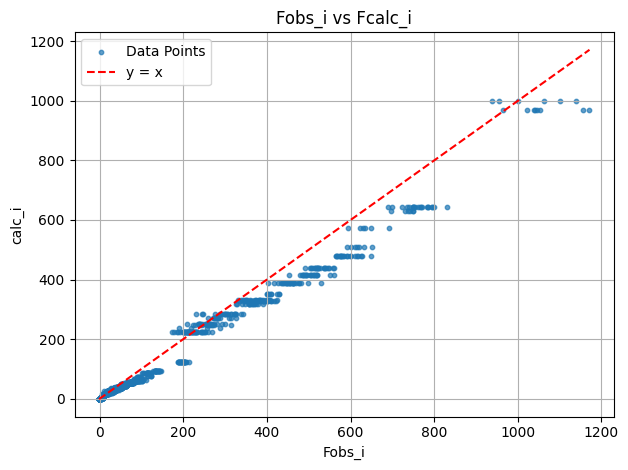

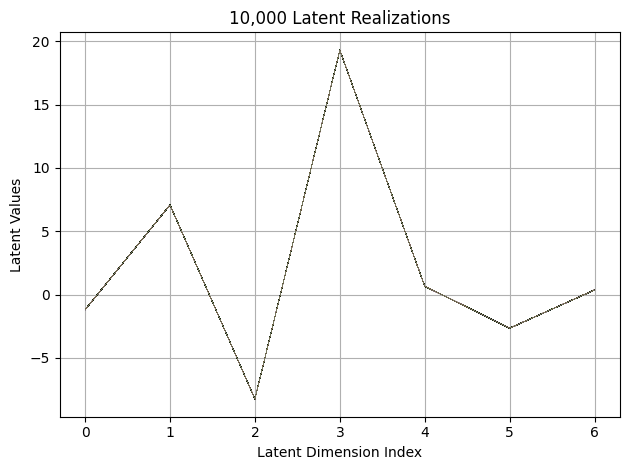

First 10 latent vectors from the VAE:
Sample 1: [-1.1871501207351685, 7.073683738708496, -8.253658294677734, 19.30956268310547, 0.6530807614326477, -2.6589486598968506, 0.3625212609767914]
Sample 2: [-1.2014350891113281, 7.07915735244751, -8.254765510559082, 19.315683364868164, 0.6471236944198608, -2.6558570861816406, 0.3515632748603821]
Sample 3: [-1.1986618041992188, 7.077306747436523, -8.255378723144531, 19.31293487548828, 0.6511716842651367, -2.657963275909424, 0.3774729073047638]
Sample 4: [-1.2084684371948242, 7.078071594238281, -8.243081092834473, 19.308380126953125, 0.6599283814430237, -2.664687156677246, 0.35199663043022156]
Sample 5: [-1.1832164525985718, 7.079346656799316, -8.24349308013916, 19.31514549255371, 0.6540926694869995, -2.6790504455566406, 0.35460010170936584]
Sample 6: [-1.2008438110351562, 7.075845718383789, -8.258707046508789, 19.315227508544922, 0.6511046886444092, -2.6457300186157227, 0.36000895500183105]
Sample 7: [-1.2108908891677856, 7.06684684753418, -8.2

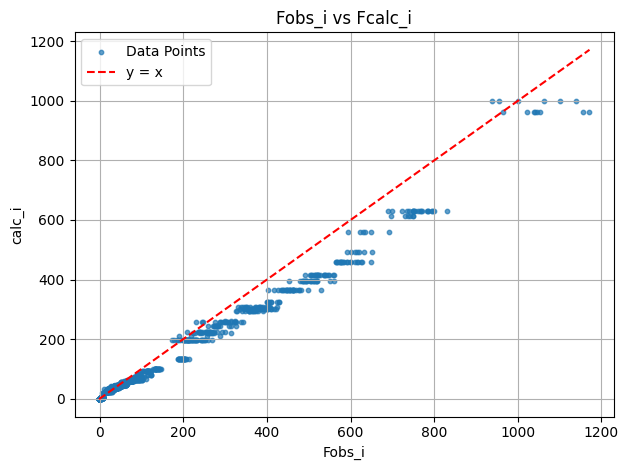

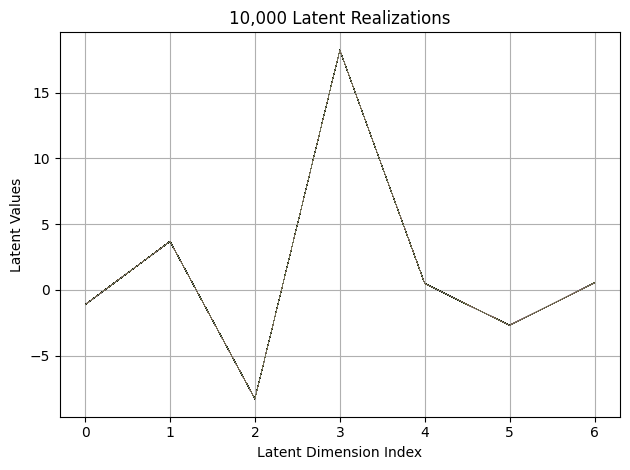

First 10 latent vectors from the VAE:
Sample 1: [-1.1237860918045044, 3.69909405708313, -8.279476165771484, 18.243331909179688, 0.4775695204734802, -2.699568748474121, 0.5338718891143799]
Sample 2: [-1.1043784618377686, 3.6884469985961914, -8.269120216369629, 18.247100830078125, 0.49126705527305603, -2.6985912322998047, 0.5370689034461975]
Sample 3: [-1.1136775016784668, 3.6982994079589844, -8.28641414642334, 18.243938446044922, 0.49849677085876465, -2.6824002265930176, 0.5349000692367554]
Sample 4: [-1.1141881942749023, 3.7010915279388428, -8.271403312683105, 18.24414825439453, 0.490629106760025, -2.6948204040527344, 0.5379188060760498]
Sample 5: [-1.1137328147888184, 3.6960127353668213, -8.289169311523438, 18.24455451965332, 0.4899730384349823, -2.6877517700195312, 0.5102335214614868]
Sample 6: [-1.1208391189575195, 3.6899263858795166, -8.29232120513916, 18.243566513061523, 0.48637157678604126, -2.6975831985473633, 0.5368333458900452]
Sample 7: [-1.1232693195343018, 3.706416368484497

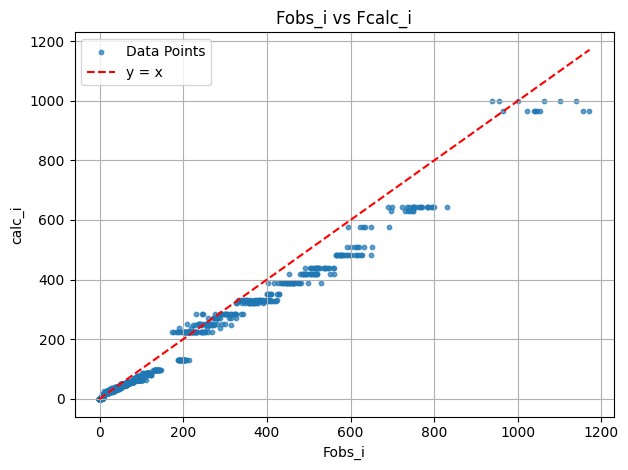

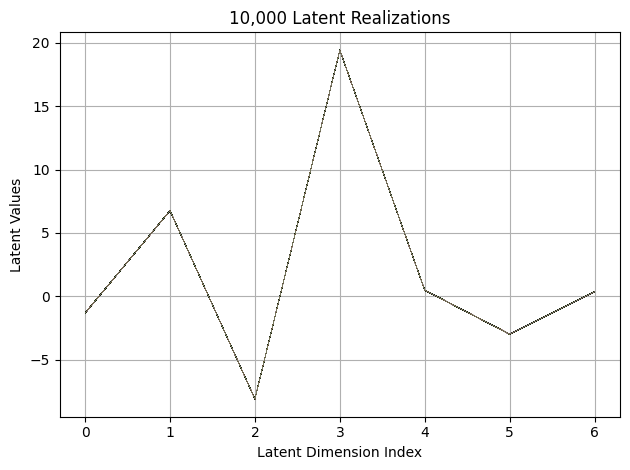

First 10 latent vectors from the VAE:
Sample 1: [-1.3259668350219727, 6.759366035461426, -8.091987609863281, 19.40740394592285, 0.4871942102909088, -2.974903106689453, 0.36376550793647766]
Sample 2: [-1.306717872619629, 6.765800952911377, -8.100455284118652, 19.418514251708984, 0.48196157813072205, -2.9739906787872314, 0.3712867200374603]
Sample 3: [-1.3212149143218994, 6.751568794250488, -8.084604263305664, 19.412534713745117, 0.49105462431907654, -2.979687213897705, 0.3664504289627075]
Sample 4: [-1.3029571771621704, 6.778596878051758, -8.07641315460205, 19.401779174804688, 0.48508894443511963, -2.987135410308838, 0.3746318221092224]
Sample 5: [-1.31783926486969, 6.746860027313232, -8.078882217407227, 19.416784286499023, 0.4867229759693146, -2.974642753601074, 0.35167375206947327]
Sample 6: [-1.3142229318618774, 6.7715229988098145, -8.081125259399414, 19.410938262939453, 0.5016099214553833, -2.9685685634613037, 0.3613571524620056]
Sample 7: [-1.3146291971206665, 6.749342918395996, -8

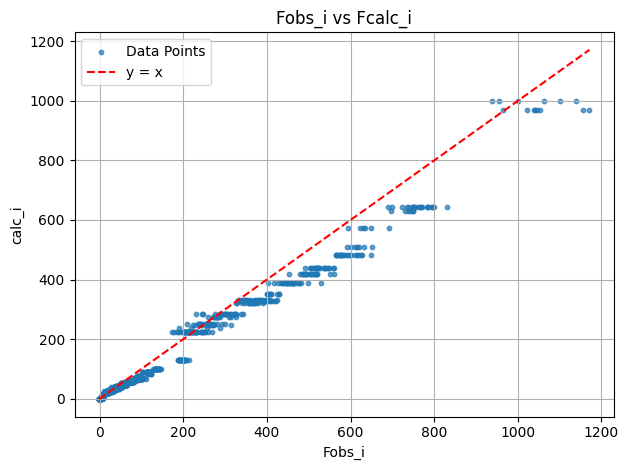

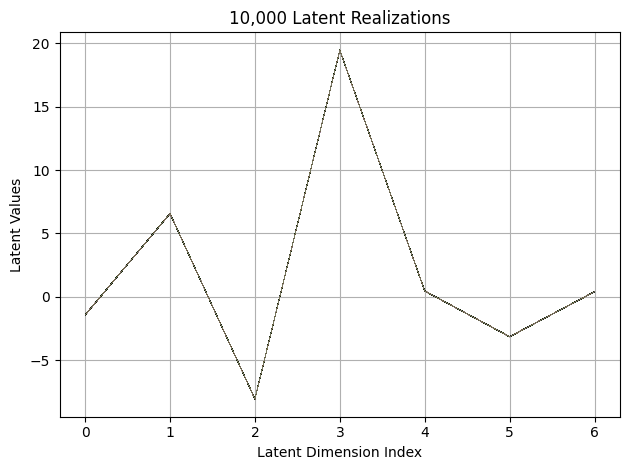

First 10 latent vectors from the VAE:
Sample 1: [-1.440737247467041, 6.57024621963501, -8.080265998840332, 19.456945419311523, 0.45430323481559753, -3.1566803455352783, 0.3983985185623169]
Sample 2: [-1.4374147653579712, 6.572298526763916, -8.065789222717285, 19.4615478515625, 0.4557572603225708, -3.158374786376953, 0.39724472165107727]
Sample 3: [-1.4389413595199585, 6.578212738037109, -8.062212944030762, 19.453296661376953, 0.4411739110946655, -3.161959648132324, 0.3998393416404724]
Sample 4: [-1.4307337999343872, 6.568807601928711, -8.05828857421875, 19.473934173583984, 0.4601505994796753, -3.1489131450653076, 0.4088318645954132]
Sample 5: [-1.4422155618667603, 6.563045501708984, -8.076744079589844, 19.47185707092285, 0.4545145034790039, -3.1425814628601074, 0.39860036969184875]
Sample 6: [-1.4405848979949951, 6.561890602111816, -8.057516098022461, 19.464031219482422, 0.46645841002464294, -3.1611745357513428, 0.3843037188053131]
Sample 7: [-1.4439735412597656, 6.560734272003174, -8.

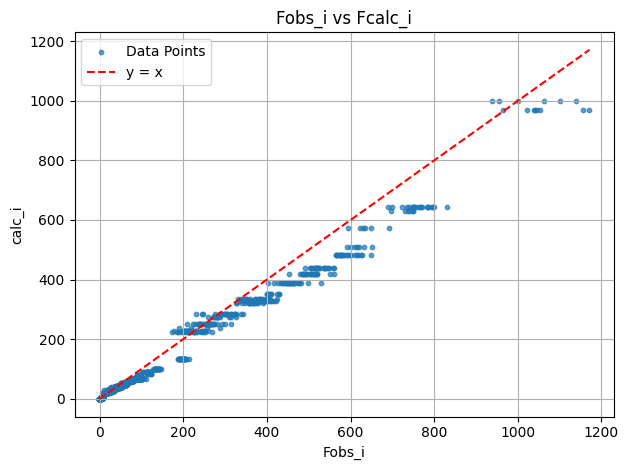

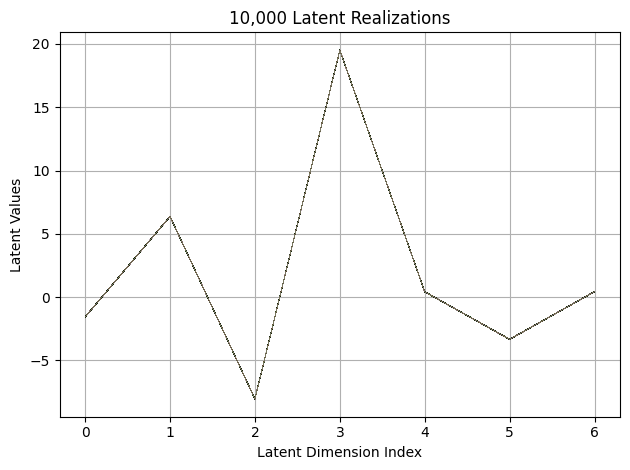

First 10 latent vectors from the VAE:
Sample 1: [-1.5629223585128784, 6.360544204711914, -8.054631233215332, 19.52495765686035, 0.43036603927612305, -3.336303234100342, 0.4403823912143707]
Sample 2: [-1.573522925376892, 6.376978397369385, -8.061150550842285, 19.521011352539062, 0.41903647780418396, -3.3329076766967773, 0.4338628053665161]
Sample 3: [-1.5562820434570312, 6.375753402709961, -8.045286178588867, 19.51862907409668, 0.4213115870952606, -3.334113597869873, 0.4294195771217346]
Sample 4: [-1.5829541683197021, 6.373010635375977, -8.05333423614502, 19.508071899414062, 0.430217444896698, -3.332763195037842, 0.4380553662776947]
Sample 5: [-1.557626724243164, 6.3733229637146, -8.034896850585938, 19.50008201599121, 0.4232376217842102, -3.341787576675415, 0.4348970055580139]
Sample 6: [-1.5759367942810059, 6.370805263519287, -8.05712604522705, 19.52188491821289, 0.4266583025455475, -3.3385002613067627, 0.427356481552124]
Sample 7: [-1.5786939859390259, 6.369964599609375, -8.0412931442

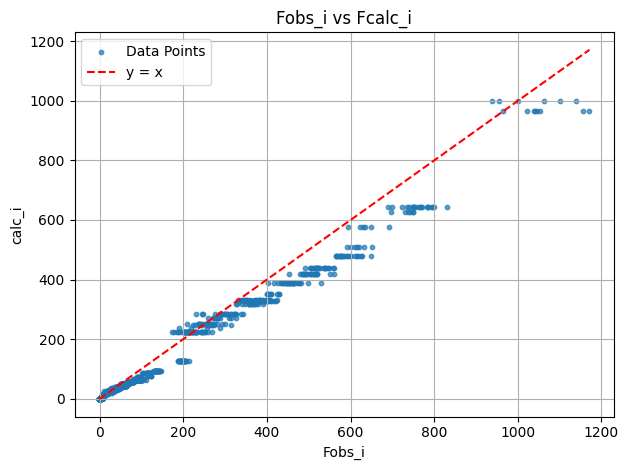

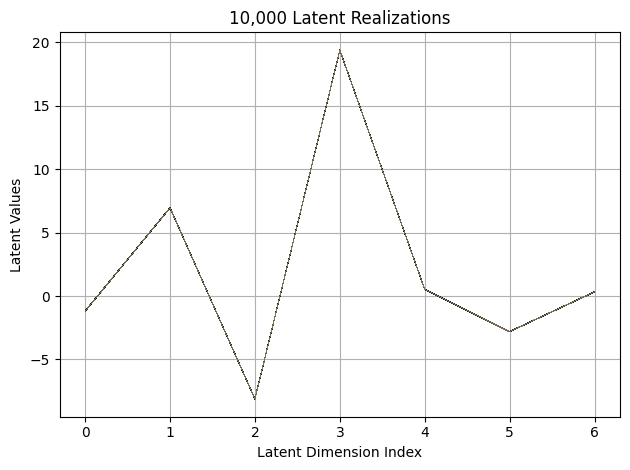

First 10 latent vectors from the VAE:
Sample 1: [-1.196657657623291, 6.9479451179504395, -8.108237266540527, 19.36433982849121, 0.5276515483856201, -2.7981128692626953, 0.32890546321868896]
Sample 2: [-1.1804813146591187, 6.940083026885986, -8.101120948791504, 19.373437881469727, 0.5336266160011292, -2.803978204727173, 0.3241659700870514]
Sample 3: [-1.1830565929412842, 6.936893463134766, -8.114664077758789, 19.366336822509766, 0.5087078809738159, -2.801085948944092, 0.3286449611186981]
Sample 4: [-1.1907154321670532, 6.942306041717529, -8.101698875427246, 19.368207931518555, 0.5140208601951599, -2.790813684463501, 0.33594802021980286]
Sample 5: [-1.1935646533966064, 6.941157817840576, -8.096097946166992, 19.367265701293945, 0.5191999077796936, -2.8040177822113037, 0.33714476227760315]
Sample 6: [-1.1794465780258179, 6.953792572021484, -8.096229553222656, 19.364360809326172, 0.5011837482452393, -2.802793502807617, 0.34393927454948425]
Sample 7: [-1.1975427865982056, 6.947476387023926, 

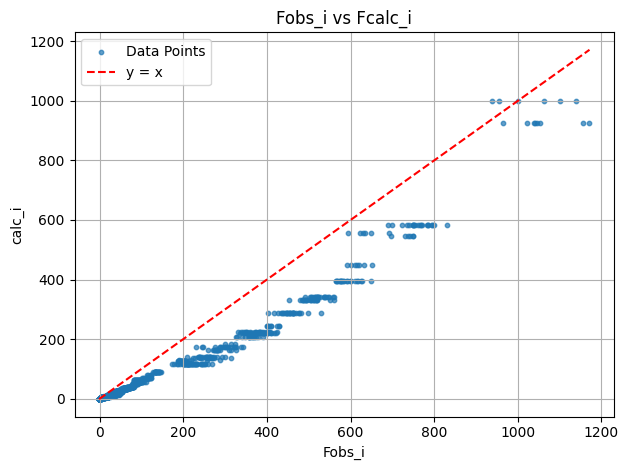

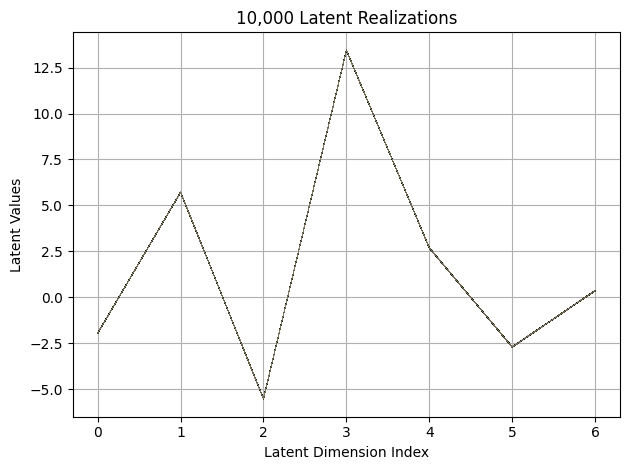

First 10 latent vectors from the VAE:
Sample 1: [-1.9670852422714233, 5.71285343170166, -5.521572113037109, 13.450393676757812, 2.689427375793457, -2.719418525695801, 0.3594202697277069]
Sample 2: [-1.9729654788970947, 5.718660831451416, -5.52772855758667, 13.44743824005127, 2.689267873764038, -2.708066701889038, 0.35403844714164734]
Sample 3: [-1.9628093242645264, 5.720139026641846, -5.532484531402588, 13.452668190002441, 2.6820273399353027, -2.719409227371216, 0.3474847972393036]
Sample 4: [-1.9679025411605835, 5.709968090057373, -5.524172782897949, 13.448352813720703, 2.6850507259368896, -2.7004926204681396, 0.3485296964645386]
Sample 5: [-1.9551531076431274, 5.713769912719727, -5.531010627746582, 13.439160346984863, 2.6780638694763184, -2.710150718688965, 0.3462284505367279]
Sample 6: [-1.9720813035964966, 5.716224193572998, -5.530793190002441, 13.454012870788574, 2.677248954772949, -2.710040330886841, 0.3641830086708069]
Sample 7: [-1.9508020877838135, 5.713393211364746, -5.519566

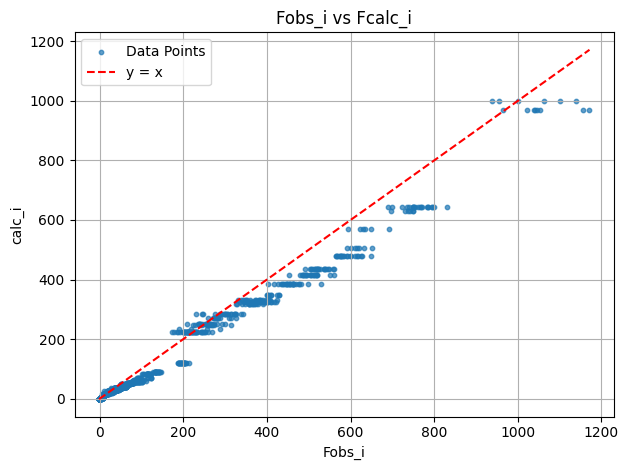

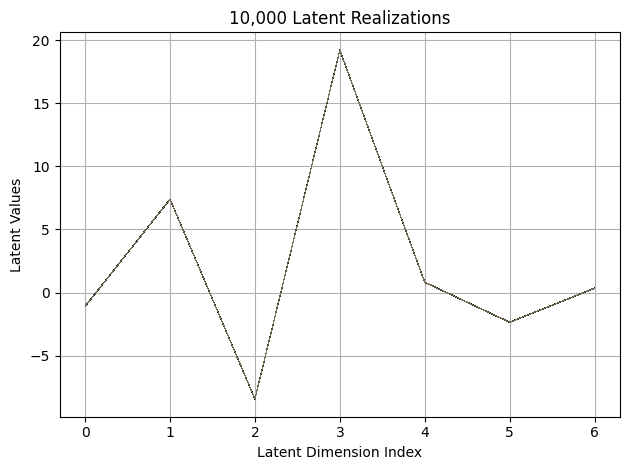

First 10 latent vectors from the VAE:
Sample 1: [-1.079506516456604, 7.388567924499512, -8.418129920959473, 19.201663970947266, 0.8240973949432373, -2.345266342163086, 0.3504268229007721]
Sample 2: [-1.0764771699905396, 7.401210308074951, -8.440455436706543, 19.194869995117188, 0.8307058215141296, -2.3565707206726074, 0.3571584224700928]
Sample 3: [-1.072812557220459, 7.39994478225708, -8.413678169250488, 19.212913513183594, 0.8189985752105713, -2.338576555252075, 0.36971238255500793]
Sample 4: [-1.0707573890686035, 7.384769439697266, -8.424775123596191, 19.211427688598633, 0.8230972290039062, -2.348111152648926, 0.3674827218055725]
Sample 5: [-1.0950161218643188, 7.406957149505615, -8.414048194885254, 19.198110580444336, 0.830335259437561, -2.357363700866699, 0.36138907074928284]
Sample 6: [-1.0812805891036987, 7.395673751831055, -8.408299446105957, 19.196359634399414, 0.816718578338623, -2.351072072982788, 0.35116133093833923]
Sample 7: [-1.086766242980957, 7.398809432983398, -8.4212

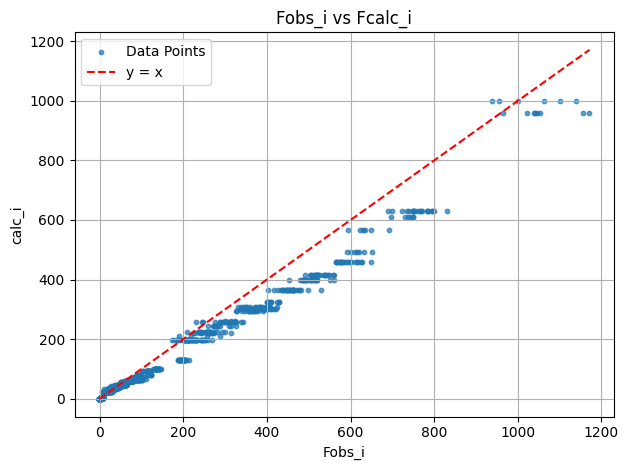

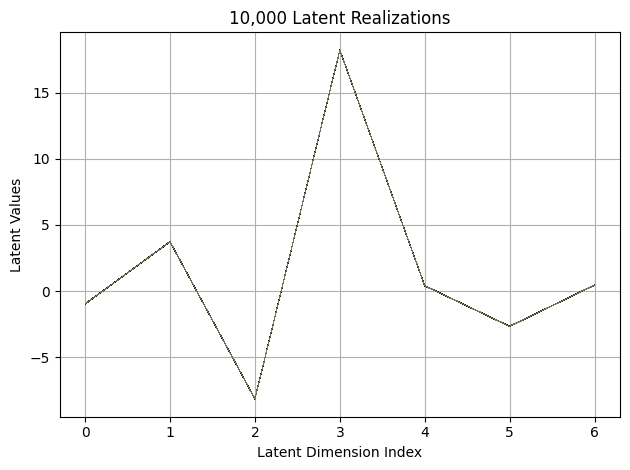

First 10 latent vectors from the VAE:
Sample 1: [-0.9789318442344666, 3.726044178009033, -8.183589935302734, 18.251306533813477, 0.39787882566452026, -2.6771481037139893, 0.4365283250808716]
Sample 2: [-0.9751561880111694, 3.729501724243164, -8.173880577087402, 18.23249626159668, 0.401222825050354, -2.678147554397583, 0.44310837984085083]
Sample 3: [-0.9871096611022949, 3.73370623588562, -8.167564392089844, 18.248008728027344, 0.40734705328941345, -2.6829752922058105, 0.4498618543148041]
Sample 4: [-0.9773380160331726, 3.726576805114746, -8.164416313171387, 18.248212814331055, 0.40376344323158264, -2.6658880710601807, 0.4410040080547333]
Sample 5: [-0.9847915768623352, 3.735933303833008, -8.18276309967041, 18.23712730407715, 0.39837291836738586, -2.676180601119995, 0.4490138292312622]
Sample 6: [-0.9783000349998474, 3.7314257621765137, -8.17696475982666, 18.245262145996094, 0.39271870255470276, -2.66664457321167, 0.45079541206359863]
Sample 7: [-0.9781821370124817, 3.7298803329467773, 

<Figure size 640x480 with 0 Axes>

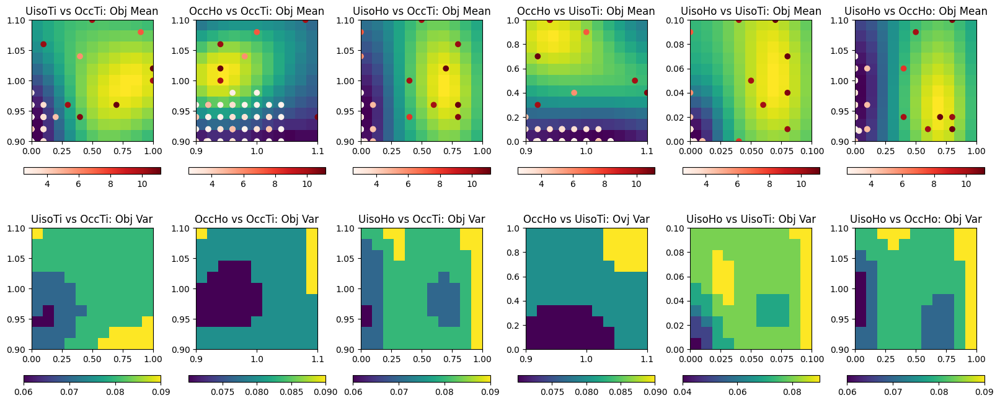

EI: [-1.          0.00451016  0.00346414 ...  0.00215238  0.00238377
  0.00256815]
Function eval #61
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9800000190734863, 0.0, 0.9800000190734863, 0.0]
[0.421597, 0.920386, 0.008262, 0.00325]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.5011
initial chi^2 9.1186e+05 with 2596 obs.
New scale: 0.5000
Cycle 0: 0.61s, Chi**2: 3.1015e+05 for 2596 obs., Lambda: 0,  Delta: 0.66, SVD=0
New scale: 0.5000
Maximum shift/esd = -171.238 for all cycles
Read fr

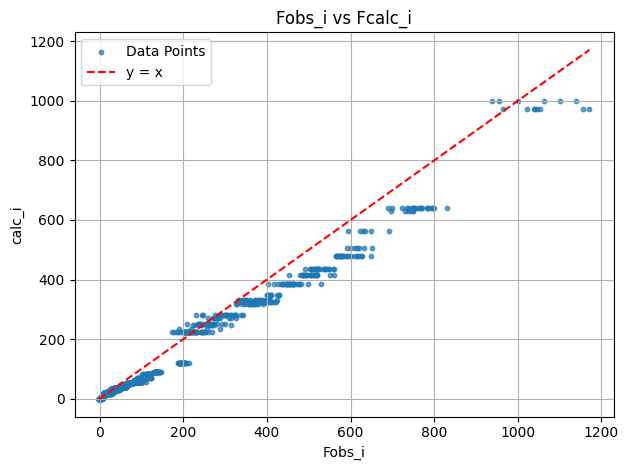

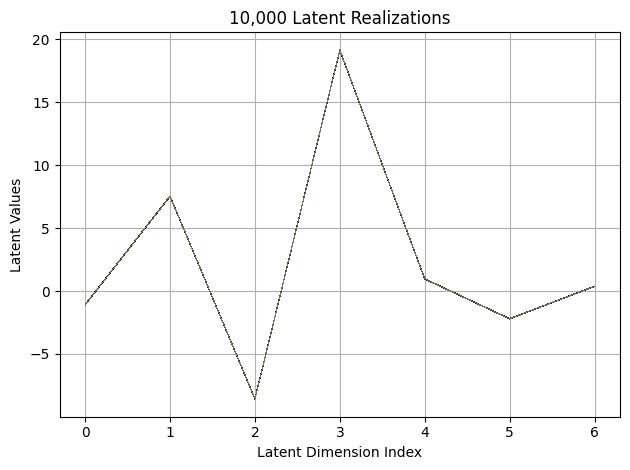

First 10 latent vectors from the VAE:
Sample 1: [-1.0876619815826416, 7.53878116607666, -8.565141677856445, 19.14451026916504, 0.971707820892334, -2.188215494155884, 0.3840222954750061]
Sample 2: [-1.0872222185134888, 7.546441555023193, -8.554927825927734, 19.142866134643555, 0.9729886054992676, -2.2070765495300293, 0.390243798494339]
Sample 3: [-1.0799403190612793, 7.534296035766602, -8.55882740020752, 19.146352767944336, 0.9674035906791687, -2.193401336669922, 0.3886581063270569]
Sample 4: [-1.0777615308761597, 7.543320178985596, -8.5650634765625, 19.16034698486328, 0.9709274768829346, -2.2167065143585205, 0.36600664258003235]
Sample 5: [-1.080281138420105, 7.533412456512451, -8.569557189941406, 19.154476165771484, 0.9660184383392334, -2.2045485973358154, 0.38111796975135803]
Sample 6: [-1.084740400314331, 7.534557342529297, -8.569229125976562, 19.14472770690918, 0.9653984308242798, -2.203667163848877, 0.38074037432670593]
Sample 7: [-1.0854923725128174, 7.542232990264893, -8.5663604

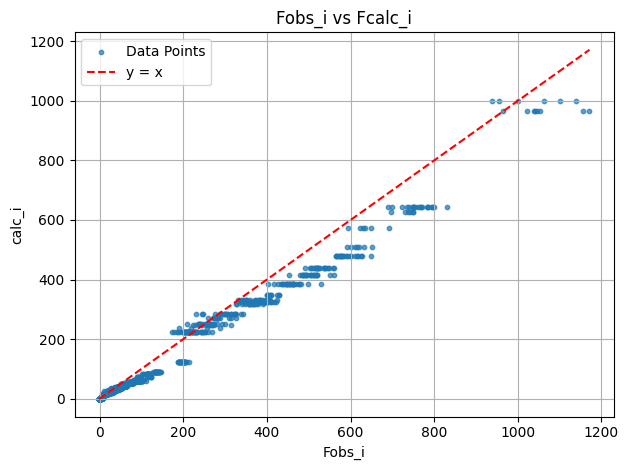

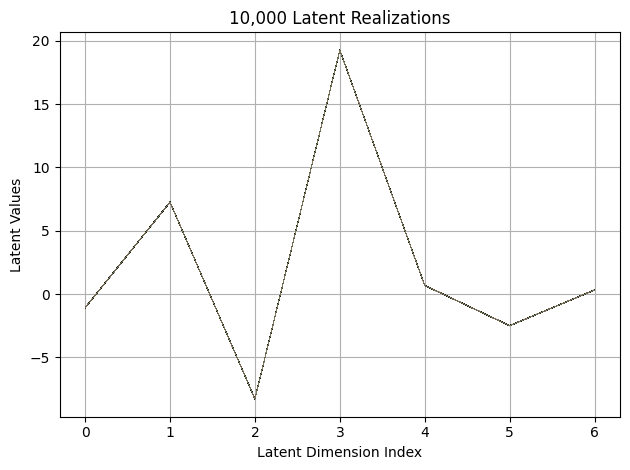

First 10 latent vectors from the VAE:
Sample 1: [-1.0649497509002686, 7.2570576667785645, -8.265128135681152, 19.267702102661133, 0.6850991249084473, -2.491708517074585, 0.32789692282676697]
Sample 2: [-1.085457682609558, 7.2592878341674805, -8.275116920471191, 19.26565170288086, 0.6821324229240417, -2.49666166305542, 0.3157293498516083]
Sample 3: [-1.0768485069274902, 7.267138957977295, -8.27264404296875, 19.257535934448242, 0.6805106997489929, -2.494246482849121, 0.3195793628692627]
Sample 4: [-1.0719506740570068, 7.263566017150879, -8.273447036743164, 19.258201599121094, 0.6865129470825195, -2.4960217475891113, 0.32332131266593933]
Sample 5: [-1.070477843284607, 7.255049228668213, -8.256099700927734, 19.265880584716797, 0.6790213584899902, -2.497814893722534, 0.317284494638443]
Sample 6: [-1.080867886543274, 7.271257400512695, -8.273448944091797, 19.256269454956055, 0.695065438747406, -2.4955050945281982, 0.3216089904308319]
Sample 7: [-1.0773404836654663, 7.258292198181152, -8.2699

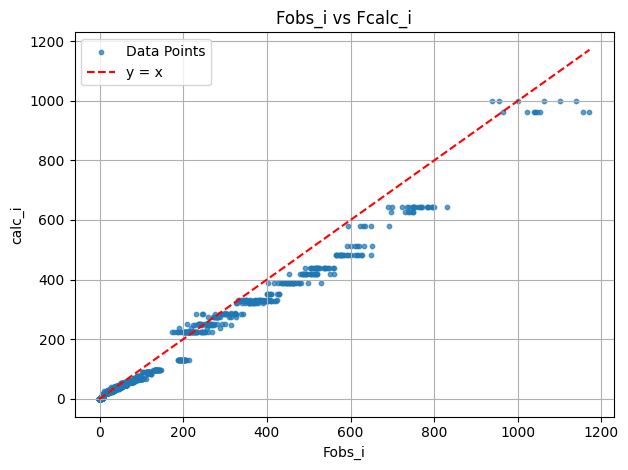

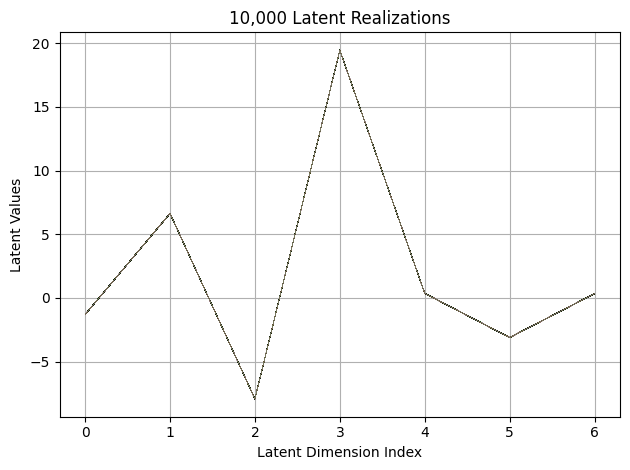

First 10 latent vectors from the VAE:
Sample 1: [-1.3107572793960571, 6.632626533508301, -7.928359508514404, 19.475278854370117, 0.3507000207901001, -3.121887683868408, 0.35574203729629517]
Sample 2: [-1.3060660362243652, 6.651130676269531, -7.926891326904297, 19.462648391723633, 0.34356167912483215, -3.1153135299682617, 0.33703818917274475]
Sample 3: [-1.3098808526992798, 6.631363868713379, -7.935637474060059, 19.473154067993164, 0.36373019218444824, -3.118360757827759, 0.32944706082344055]
Sample 4: [-1.298329472541809, 6.631900787353516, -7.950209140777588, 19.459564208984375, 0.3613002896308899, -3.1183371543884277, 0.3292354643344879]
Sample 5: [-1.30039381980896, 6.624697685241699, -7.938183307647705, 19.46627426147461, 0.3467743396759033, -3.1122987270355225, 0.3438475430011749]
Sample 6: [-1.2985745668411255, 6.632364749908447, -7.938991546630859, 19.45452117919922, 0.35233384370803833, -3.133458137512207, 0.3457801640033722]
Sample 7: [-1.3068771362304688, 6.625147342681885, -

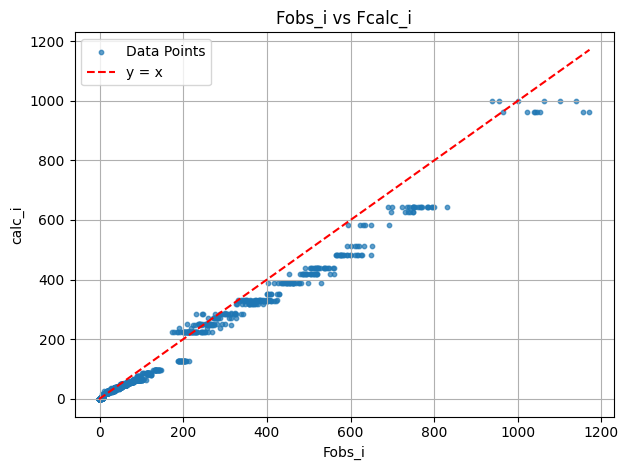

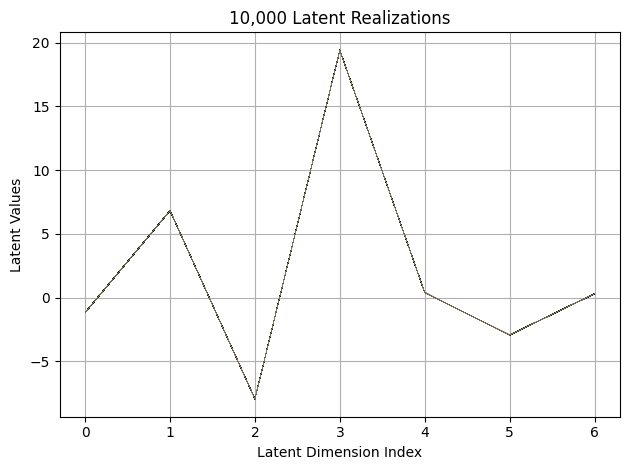

First 10 latent vectors from the VAE:
Sample 1: [-1.1842772960662842, 6.807618618011475, -7.957019805908203, 19.40363883972168, 0.3849944472312927, -2.9446399211883545, 0.28548556566238403]
Sample 2: [-1.1867002248764038, 6.813924789428711, -7.962985038757324, 19.41682243347168, 0.3946358263492584, -2.9564483165740967, 0.2928103506565094]
Sample 3: [-1.1780864000320435, 6.821022987365723, -7.962702751159668, 19.4248046875, 0.40103068947792053, -2.950000762939453, 0.30059003829956055]
Sample 4: [-1.191247582435608, 6.817733287811279, -7.955039024353027, 19.408872604370117, 0.3891725242137909, -2.941877841949463, 0.29177194833755493]
Sample 5: [-1.1683269739151, 6.808205604553223, -7.953330993652344, 19.426252365112305, 0.39774656295776367, -2.9356884956359863, 0.3054634630680084]
Sample 6: [-1.177351713180542, 6.815189838409424, -7.945023059844971, 19.417030334472656, 0.3847509026527405, -2.951690673828125, 0.303193062543869]
Sample 7: [-1.1754653453826904, 6.816515922546387, -7.9514288

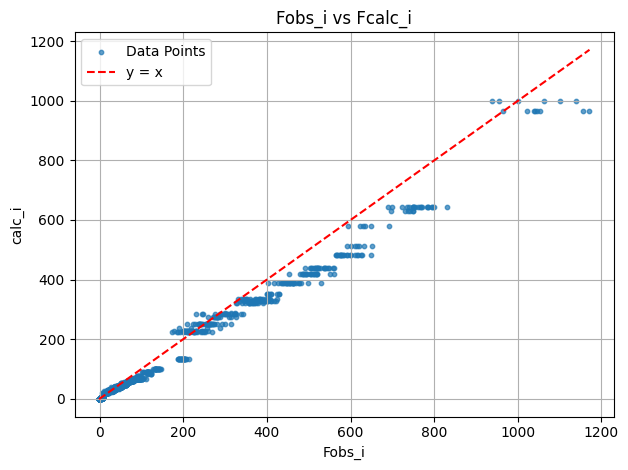

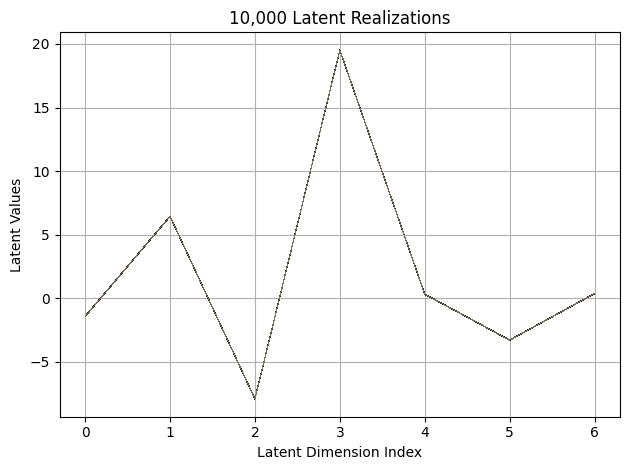

First 10 latent vectors from the VAE:
Sample 1: [-1.4391413927078247, 6.437945365905762, -7.916128158569336, 19.508289337158203, 0.31148040294647217, -3.2963144779205322, 0.3531346321105957]
Sample 2: [-1.4345449209213257, 6.4486188888549805, -7.911743640899658, 19.522518157958984, 0.32701611518859863, -3.300366163253784, 0.3515861928462982]
Sample 3: [-1.4148619174957275, 6.419057369232178, -7.9224534034729, 19.503799438476562, 0.32534635066986084, -3.292240858078003, 0.37699195742607117]
Sample 4: [-1.4265048503875732, 6.446072578430176, -7.915268421173096, 19.512340545654297, 0.31518271565437317, -3.287644386291504, 0.3728291094303131]
Sample 5: [-1.4249951839447021, 6.435280799865723, -7.911783695220947, 19.509674072265625, 0.318545937538147, -3.3019919395446777, 0.3686039447784424]
Sample 6: [-1.429032802581787, 6.439882278442383, -7.92345666885376, 19.50872039794922, 0.3288132846355438, -3.2886765003204346, 0.3655831217765808]
Sample 7: [-1.4175028800964355, 6.451457500457764, -7

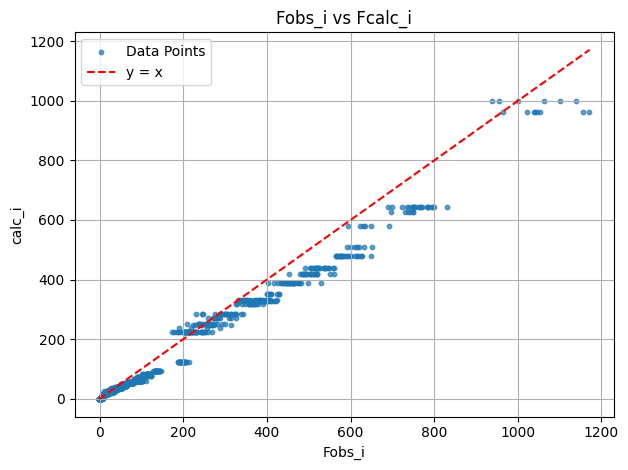

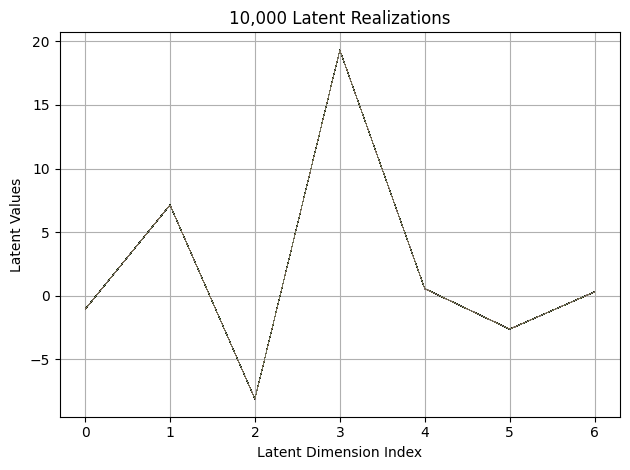

First 10 latent vectors from the VAE:
Sample 1: [-1.054166316986084, 7.124972343444824, -8.120841026306152, 19.325817108154297, 0.5573158264160156, -2.6400201320648193, 0.2854282557964325]
Sample 2: [-1.063050627708435, 7.1379547119140625, -8.128482818603516, 19.313995361328125, 0.5499053001403809, -2.6217079162597656, 0.27531421184539795]
Sample 3: [-1.0663565397262573, 7.122668743133545, -8.126482963562012, 19.30573081970215, 0.5494787693023682, -2.6335203647613525, 0.29820162057876587]
Sample 4: [-1.0668365955352783, 7.118886470794678, -8.119621276855469, 19.328960418701172, 0.5532842874526978, -2.6396501064300537, 0.2897953987121582]
Sample 5: [-1.0776335000991821, 7.135820388793945, -8.122034072875977, 19.313339233398438, 0.5493195652961731, -2.6297593116760254, 0.28868961334228516]
Sample 6: [-1.0626567602157593, 7.135662078857422, -8.117496490478516, 19.31822967529297, 0.553187906742096, -2.629042625427246, 0.2933788299560547]
Sample 7: [-1.0806586742401123, 7.127010822296143, -

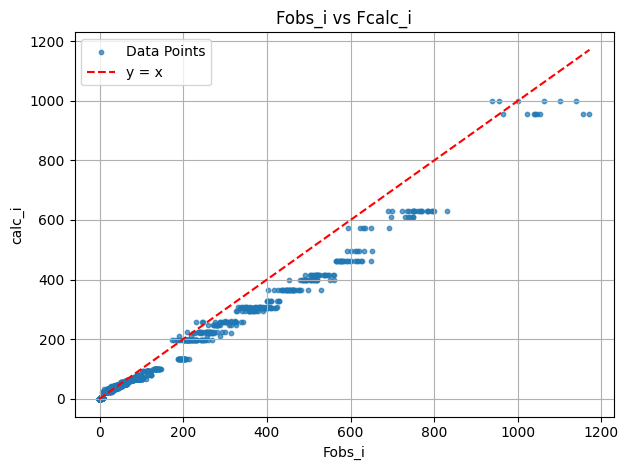

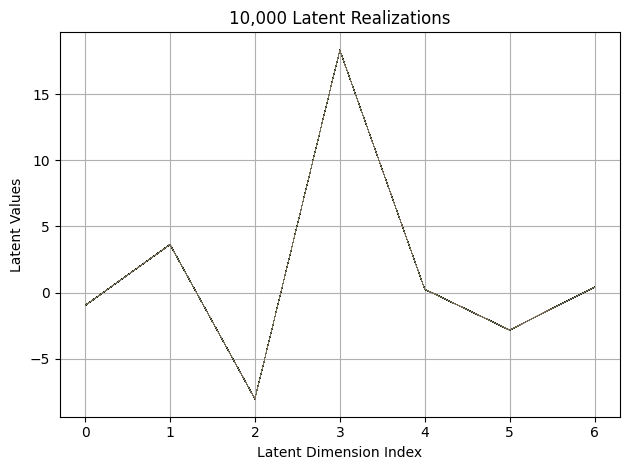

First 10 latent vectors from the VAE:
Sample 1: [-0.969485878944397, 3.625718355178833, -8.01396369934082, 18.312833786010742, 0.2517426908016205, -2.806117296218872, 0.40677952766418457]
Sample 2: [-0.9683229923248291, 3.6351051330566406, -8.026243209838867, 18.307615280151367, 0.24375532567501068, -2.8227884769439697, 0.40369072556495667]
Sample 3: [-0.9798751473426819, 3.631918430328369, -8.027888298034668, 18.310474395751953, 0.2593376934528351, -2.8202919960021973, 0.40838631987571716]
Sample 4: [-0.9754428863525391, 3.6433839797973633, -8.030168533325195, 18.313791275024414, 0.25943008065223694, -2.8245692253112793, 0.40797159075737]
Sample 5: [-0.9744589328765869, 3.630805015563965, -8.0172700881958, 18.313718795776367, 0.2601267397403717, -2.81221079826355, 0.42724594473838806]
Sample 6: [-0.9531036019325256, 3.6272716522216797, -8.019699096679688, 18.319917678833008, 0.25192463397979736, -2.8208119869232178, 0.41476261615753174]
Sample 7: [-0.9663457870483398, 3.63249015808105

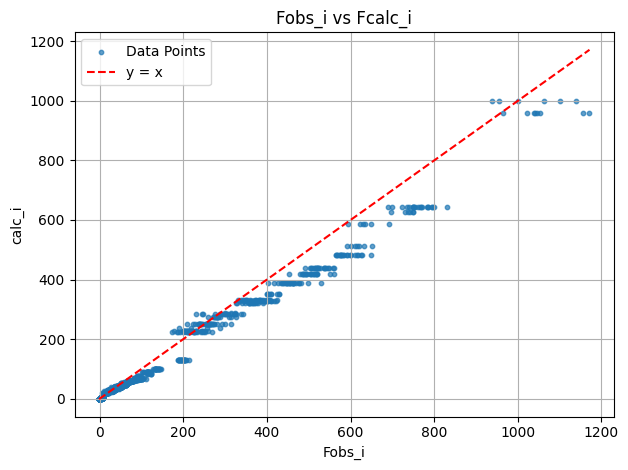

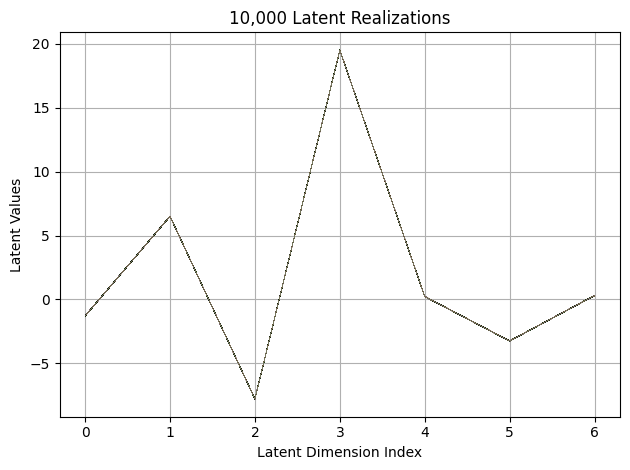

First 10 latent vectors from the VAE:
Sample 1: [-1.289207100868225, 6.5067901611328125, -7.798700332641602, 19.505979537963867, 0.2232276350259781, -3.247532844543457, 0.30921173095703125]
Sample 2: [-1.2847291231155396, 6.513984203338623, -7.78945255279541, 19.505176544189453, 0.22729380428791046, -3.2400310039520264, 0.30802732706069946]
Sample 3: [-1.293821096420288, 6.504236221313477, -7.804369926452637, 19.516267776489258, 0.23126409947872162, -3.2588820457458496, 0.3119994103908539]
Sample 4: [-1.2919321060180664, 6.501572132110596, -7.793362617492676, 19.51554298400879, 0.22246447205543518, -3.261744976043701, 0.29046446084976196]
Sample 5: [-1.3030551671981812, 6.5049638748168945, -7.790375232696533, 19.51923179626465, 0.2232399880886078, -3.261838674545288, 0.303430438041687]
Sample 6: [-1.2918375730514526, 6.5111985206604, -7.7918853759765625, 19.515962600708008, 0.22243332862854004, -3.258446455001831, 0.3100059926509857]
Sample 7: [-1.3097039461135864, 6.506068706512451, -

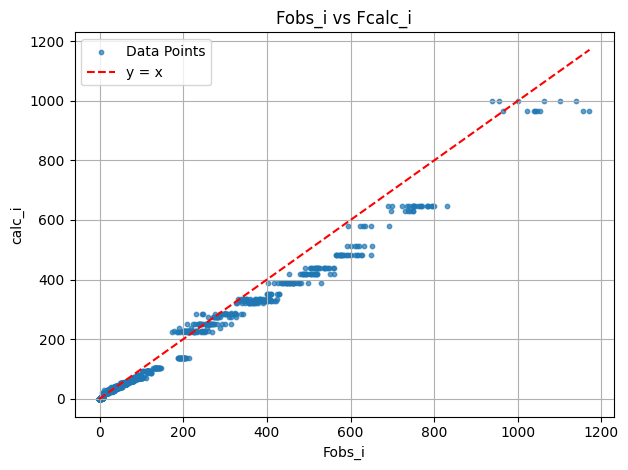

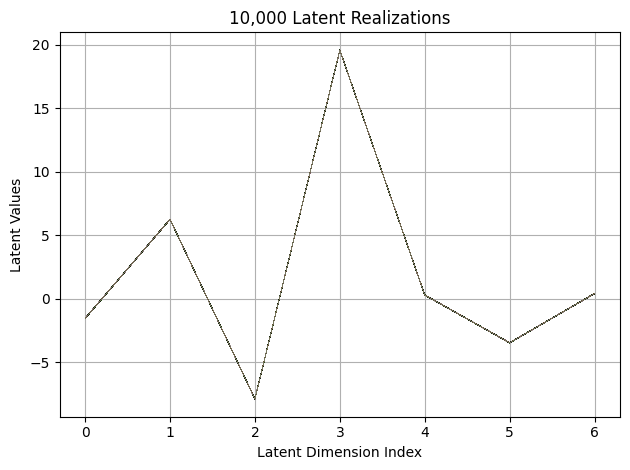

First 10 latent vectors from the VAE:
Sample 1: [-1.5492788553237915, 6.247624397277832, -7.890678405761719, 19.566150665283203, 0.2865516245365143, -3.4677727222442627, 0.4034288823604584]
Sample 2: [-1.5585159063339233, 6.2454657554626465, -7.901439189910889, 19.560274124145508, 0.28782129287719727, -3.4679901599884033, 0.3919968605041504]
Sample 3: [-1.556695818901062, 6.2452921867370605, -7.8957600593566895, 19.557188034057617, 0.28705641627311707, -3.46504282951355, 0.4038936495780945]
Sample 4: [-1.549315333366394, 6.250415325164795, -7.891575336456299, 19.557998657226562, 0.2924007177352905, -3.468966245651245, 0.3991257846355438]
Sample 5: [-1.541898250579834, 6.256845474243164, -7.879633903503418, 19.556825637817383, 0.28486013412475586, -3.4708149433135986, 0.3988449275493622]
Sample 6: [-1.5558497905731201, 6.25247859954834, -7.906765937805176, 19.558406829833984, 0.2836202383041382, -3.4756782054901123, 0.40500301122665405]
Sample 7: [-1.5522388219833374, 6.250305652618408,

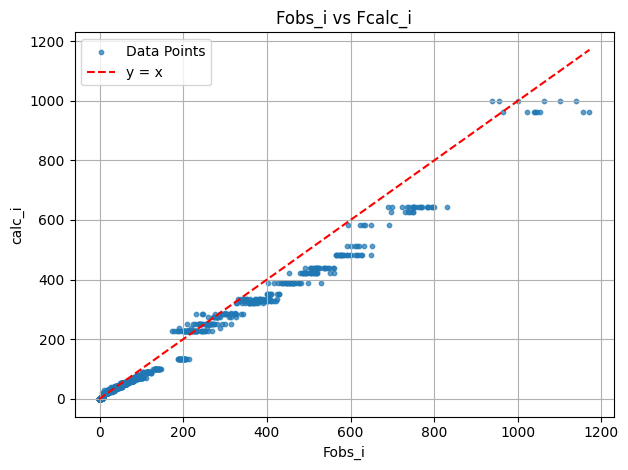

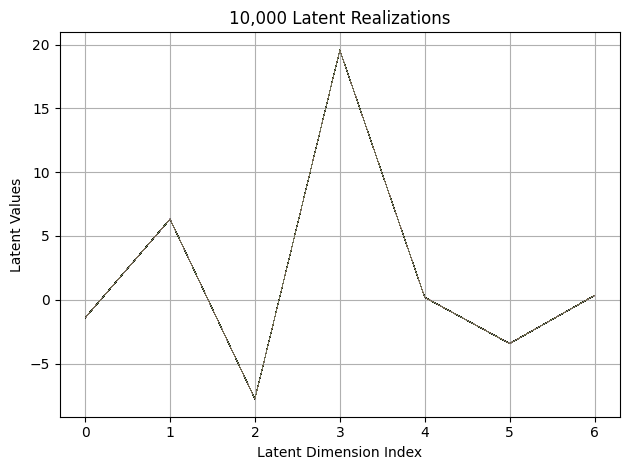

First 10 latent vectors from the VAE:
Sample 1: [-1.4124552011489868, 6.306972026824951, -7.772227764129639, 19.56855010986328, 0.19003282487392426, -3.4322502613067627, 0.3414151966571808]
Sample 2: [-1.4371109008789062, 6.323662281036377, -7.769510746002197, 19.55581283569336, 0.18578848242759705, -3.4338788986206055, 0.3413812816143036]
Sample 3: [-1.42183256149292, 6.322106838226318, -7.7645673751831055, 19.576210021972656, 0.17580056190490723, -3.4347167015075684, 0.3376528024673462]
Sample 4: [-1.408184289932251, 6.324888706207275, -7.756723880767822, 19.567380905151367, 0.19602641463279724, -3.4310052394866943, 0.3360859453678131]
Sample 5: [-1.4229817390441895, 6.335891246795654, -7.779747486114502, 19.57183074951172, 0.18386352062225342, -3.4344072341918945, 0.3397829830646515]
Sample 6: [-1.4159005880355835, 6.311440944671631, -7.762468338012695, 19.57241439819336, 0.18673768639564514, -3.4193673133850098, 0.33673349022865295]
Sample 7: [-1.417546272277832, 6.315755844116211,

<Figure size 640x480 with 0 Axes>

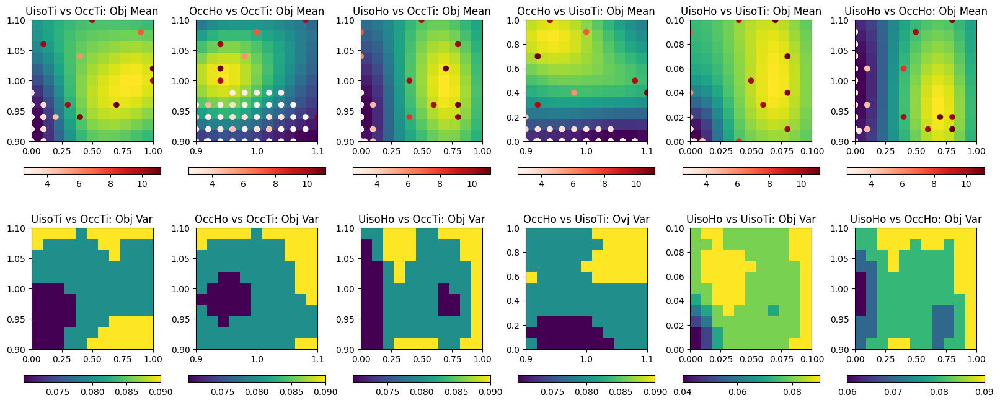

EI: [-1.          0.00481409  0.00377227 ...  0.00273014  0.00302312
  0.00325776]
Function eval #71
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9599999785423279, 0.0, 1.0800000429153442, 0.0]
[0.421597, 0.920386, 0.008262, 0.00325]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4193
initial chi^2 1.875e+06 with 2596 obs.
New scale: 0.4178
Cycle 0: 0.61s, Chi**2: 4.034e+05 for 2596 obs., Lambda: 0,  Delta: 0.785, SVD=0
New scale: 0.4178
Maximum shift/esd = -251.614 for all cycles
Read fro

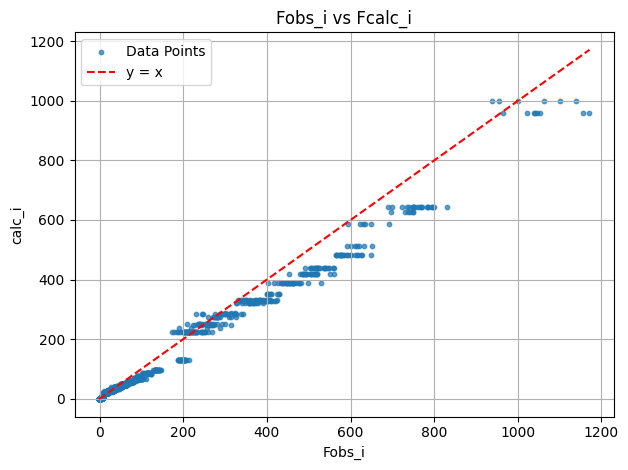

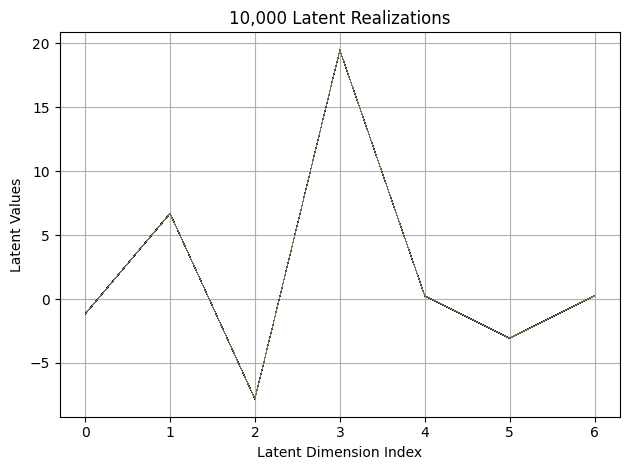

First 10 latent vectors from the VAE:
Sample 1: [-1.165706753730774, 6.69614839553833, -7.819955348968506, 19.46806526184082, 0.2729186713695526, -3.0790786743164062, 0.27529647946357727]
Sample 2: [-1.1680797338485718, 6.701688289642334, -7.827450752258301, 19.468599319458008, 0.2519099712371826, -3.0799777507781982, 0.26751914620399475]
Sample 3: [-1.17426335811615, 6.687873840332031, -7.802529811859131, 19.467697143554688, 0.2651064693927765, -3.070112705230713, 0.27453312277793884]
Sample 4: [-1.169616937637329, 6.689850330352783, -7.826211452484131, 19.45234489440918, 0.26750558614730835, -3.080721616744995, 0.26412349939346313]
Sample 5: [-1.1663414239883423, 6.695940017700195, -7.817113876342773, 19.46811866760254, 0.2546168863773346, -3.08103609085083, 0.2749687433242798]
Sample 6: [-1.1750047206878662, 6.690409183502197, -7.816459655761719, 19.467256546020508, 0.25482556223869324, -3.0888514518737793, 0.26233580708503723]
Sample 7: [-1.180541753768921, 6.679847717285156, -7.80

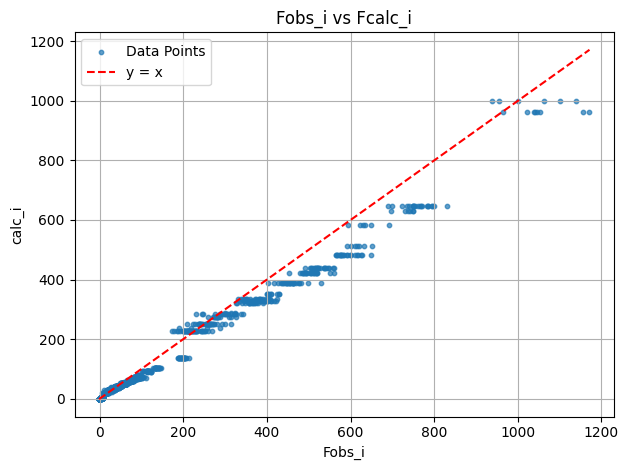

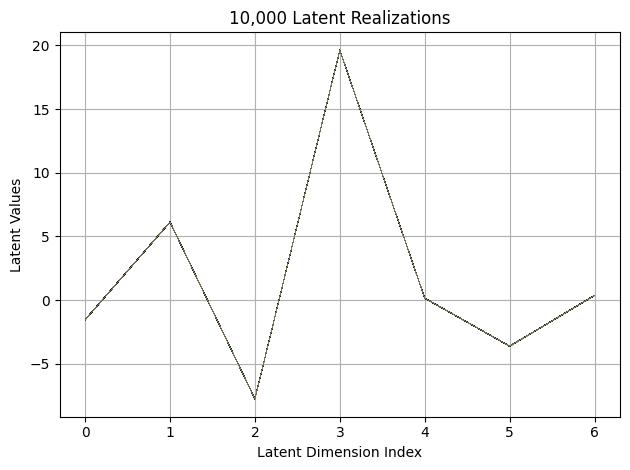

First 10 latent vectors from the VAE:
Sample 1: [-1.532450556755066, 6.124190330505371, -7.735639572143555, 19.614778518676758, 0.15997891128063202, -3.620389461517334, 0.3574759066104889]
Sample 2: [-1.5467249155044556, 6.12022590637207, -7.742340087890625, 19.60862159729004, 0.1545252501964569, -3.6079254150390625, 0.36656808853149414]
Sample 3: [-1.543156623840332, 6.120811462402344, -7.750412464141846, 19.632488250732422, 0.15108433365821838, -3.6117870807647705, 0.3738180994987488]
Sample 4: [-1.5308713912963867, 6.122830867767334, -7.732037544250488, 19.620161056518555, 0.15202824771404266, -3.602017879486084, 0.3694996237754822]
Sample 5: [-1.5313596725463867, 6.12081241607666, -7.7433600425720215, 19.62249755859375, 0.14909882843494415, -3.612316846847534, 0.3654557764530182]
Sample 6: [-1.5371372699737549, 6.130637168884277, -7.7578911781311035, 19.62100601196289, 0.15716704726219177, -3.6164979934692383, 0.3673460781574249]
Sample 7: [-1.5583739280700684, 6.132488250732422, -

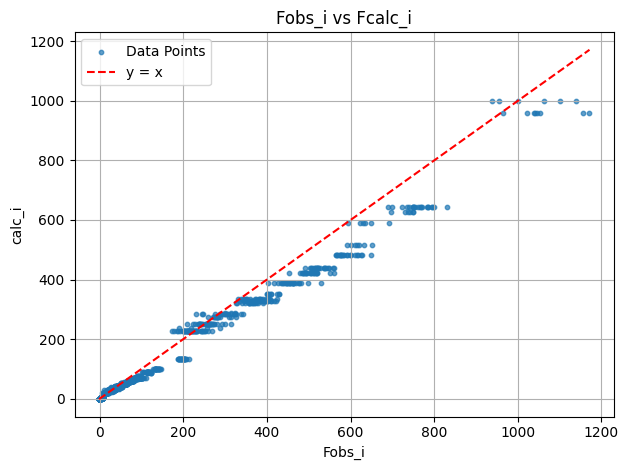

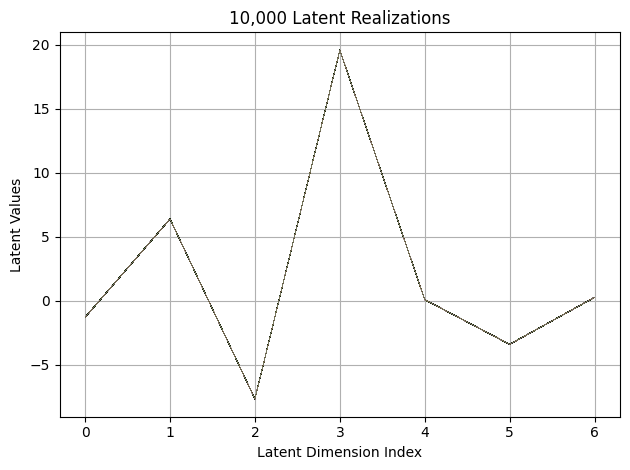

First 10 latent vectors from the VAE:
Sample 1: [-1.2831172943115234, 6.391485214233398, -7.6629767417907715, 19.564754486083984, 0.0906960517168045, -3.3875505924224854, 0.2803867757320404]
Sample 2: [-1.28878653049469, 6.39790678024292, -7.650637626647949, 19.564607620239258, 0.08960840851068497, -3.3996989727020264, 0.27558663487434387]
Sample 3: [-1.285766839981079, 6.389353275299072, -7.655943393707275, 19.567209243774414, 0.10157522559165955, -3.399989604949951, 0.27253806591033936]
Sample 4: [-1.2774771451950073, 6.385896682739258, -7.651111602783203, 19.568458557128906, 0.09854105114936829, -3.3990631103515625, 0.27297767996788025]
Sample 5: [-1.270550012588501, 6.392823696136475, -7.644871234893799, 19.554807662963867, 0.10095442086458206, -3.3836686611175537, 0.2736777663230896]
Sample 6: [-1.27538001537323, 6.378740310668945, -7.636240005493164, 19.578683853149414, 0.09375687688589096, -3.3892037868499756, 0.2898206412792206]
Sample 7: [-1.280100703239441, 6.392330169677734,

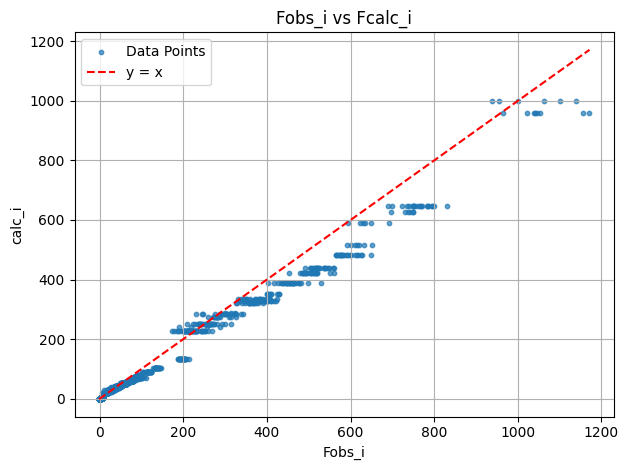

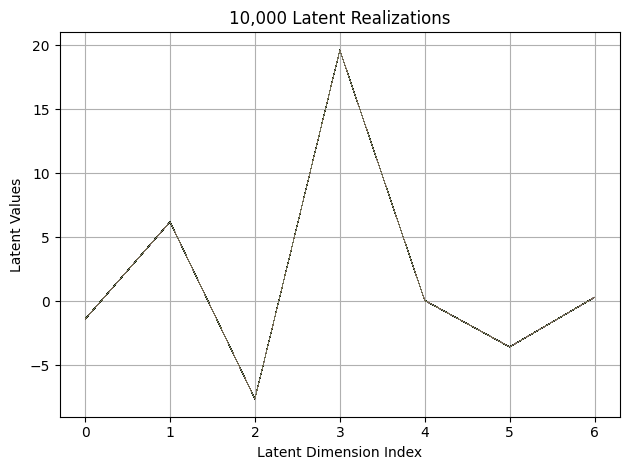

First 10 latent vectors from the VAE:
Sample 1: [-1.395433783531189, 6.2063798904418945, -7.623276233673096, 19.622549057006836, 0.05718709155917168, -3.5886850357055664, 0.3174945116043091]
Sample 2: [-1.3984050750732422, 6.208744525909424, -7.632822036743164, 19.620214462280273, 0.06036265566945076, -3.5887277126312256, 0.3044286370277405]
Sample 3: [-1.3993380069732666, 6.194810390472412, -7.622852325439453, 19.615299224853516, 0.08085624873638153, -3.5647995471954346, 0.30745750665664673]
Sample 4: [-1.409590721130371, 6.1933817863464355, -7.623541355133057, 19.617919921875, 0.05941826105117798, -3.5699028968811035, 0.3116225302219391]
Sample 5: [-1.4135031700134277, 6.208110332489014, -7.638996601104736, 19.606842041015625, 0.07357556372880936, -3.550384759902954, 0.29404109716415405]
Sample 6: [-1.3964046239852905, 6.204197883605957, -7.6305999755859375, 19.621700286865234, 0.06428506970405579, -3.5700743198394775, 0.31092169880867004]
Sample 7: [-1.4081124067306519, 6.1833925247

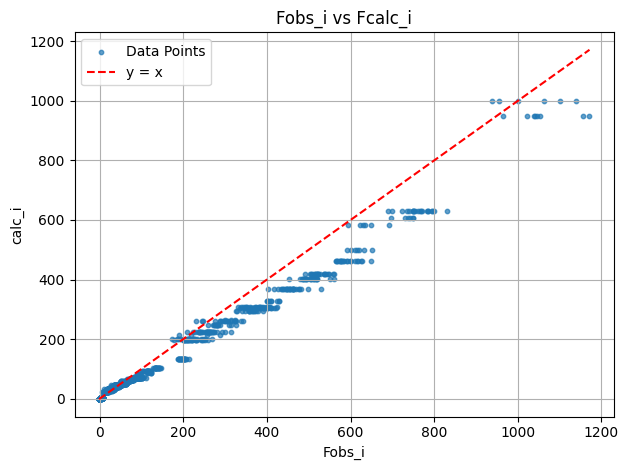

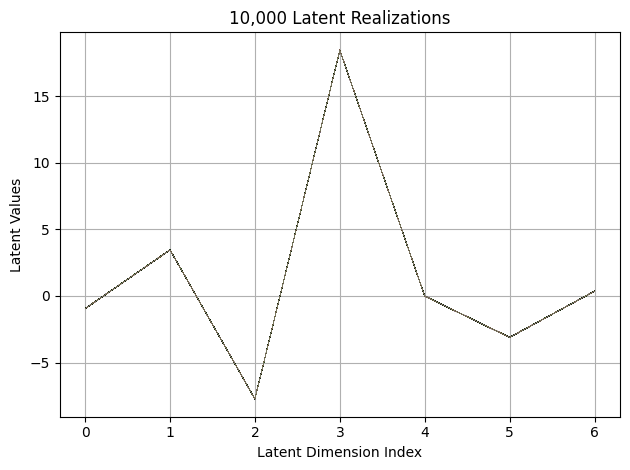

First 10 latent vectors from the VAE:
Sample 1: [-0.9460145831108093, 3.4516825675964355, -7.739039421081543, 18.4410343170166, -0.012572335079312325, -3.1169300079345703, 0.35162654519081116]
Sample 2: [-0.9557793140411377, 3.4595253467559814, -7.736597537994385, 18.445167541503906, -0.015364828519523144, -3.1170623302459717, 0.3554004728794098]
Sample 3: [-0.9574644565582275, 3.4512548446655273, -7.737754821777344, 18.45632553100586, -0.011180663481354713, -3.1115074157714844, 0.3616340458393097]
Sample 4: [-0.964496910572052, 3.4464566707611084, -7.732021808624268, 18.44947624206543, -0.024505067616701126, -3.1155858039855957, 0.35286951065063477]
Sample 5: [-0.9551014304161072, 3.4552395343780518, -7.735695838928223, 18.44993019104004, -0.020842913538217545, -3.111539125442505, 0.360990047454834]
Sample 6: [-0.9412835240364075, 3.4582366943359375, -7.724543571472168, 18.457744598388672, -0.011882808990776539, -3.1222410202026367, 0.3620770573616028]
Sample 7: [-0.9490275979042053, 

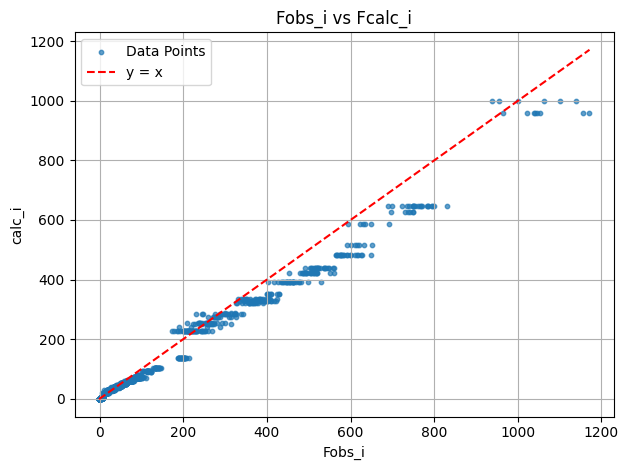

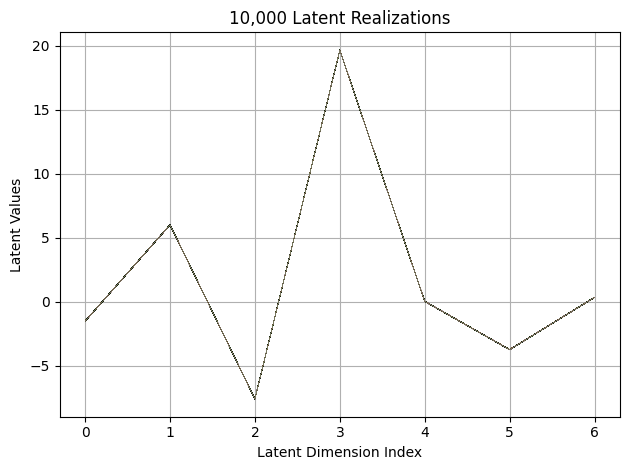

First 10 latent vectors from the VAE:
Sample 1: [-1.5225276947021484, 6.016786575317383, -7.587459087371826, 19.658721923828125, 0.02284422516822815, -3.7593095302581787, 0.33032292127609253]
Sample 2: [-1.5239142179489136, 6.005458354949951, -7.6130242347717285, 19.67028045654297, 0.02953372895717621, -3.7522175312042236, 0.33914124965667725]
Sample 3: [-1.521929144859314, 6.007964134216309, -7.607110023498535, 19.66763687133789, 0.034297484904527664, -3.7429330348968506, 0.33433571457862854]
Sample 4: [-1.5195497274398804, 6.002946376800537, -7.59912109375, 19.668058395385742, 0.017048576846718788, -3.7404706478118896, 0.3383553922176361]
Sample 5: [-1.5285238027572632, 6.011456489562988, -7.600156307220459, 19.662961959838867, 0.024456432089209557, -3.7544164657592773, 0.3385715186595917]
Sample 6: [-1.5370553731918335, 6.007501602172852, -7.606527328491211, 19.667564392089844, 0.024740735068917274, -3.7432873249053955, 0.33127814531326294]
Sample 7: [-1.5180869102478027, 6.01060676

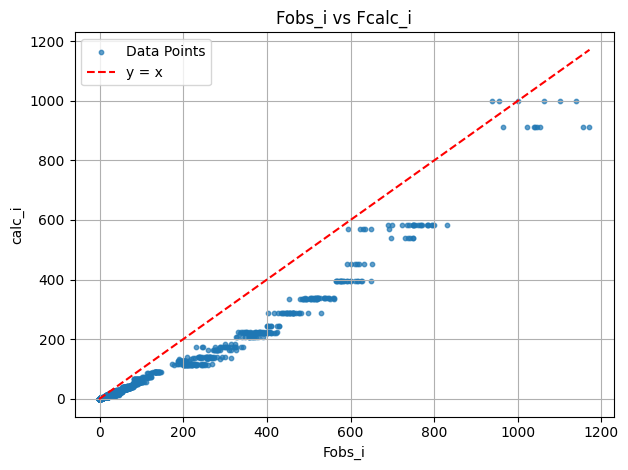

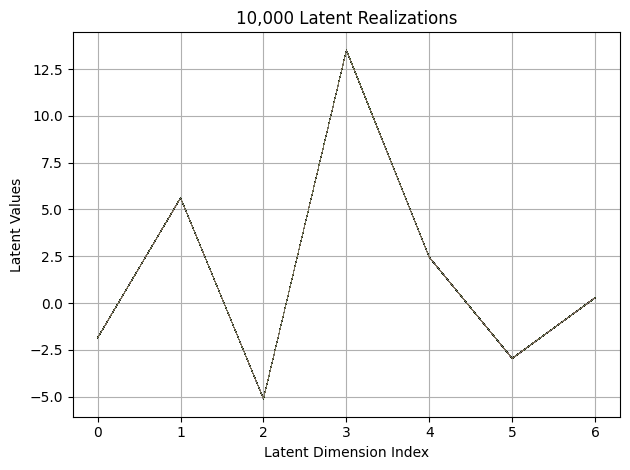

First 10 latent vectors from the VAE:
Sample 1: [-1.8523013591766357, 5.619187831878662, -5.110002040863037, 13.514108657836914, 2.436922073364258, -2.9546592235565186, 0.27970415353775024]
Sample 2: [-1.855248212814331, 5.616335868835449, -5.116559982299805, 13.504563331604004, 2.4371695518493652, -2.9608922004699707, 0.2895549535751343]
Sample 3: [-1.8486237525939941, 5.615555763244629, -5.119674205780029, 13.518291473388672, 2.422405958175659, -2.948798418045044, 0.27702558040618896]
Sample 4: [-1.853490948677063, 5.6219024658203125, -5.1249847412109375, 13.506505966186523, 2.452636241912842, -2.9460039138793945, 0.2768210768699646]
Sample 5: [-1.8543217182159424, 5.615447998046875, -5.11629056930542, 13.50806999206543, 2.427978515625, -2.9457015991210938, 0.27583229541778564]
Sample 6: [-1.8517237901687622, 5.614312171936035, -5.11515474319458, 13.511795043945312, 2.438375473022461, -2.957308053970337, 0.28095725178718567]
Sample 7: [-1.8552731275558472, 5.614772796630859, -5.12004

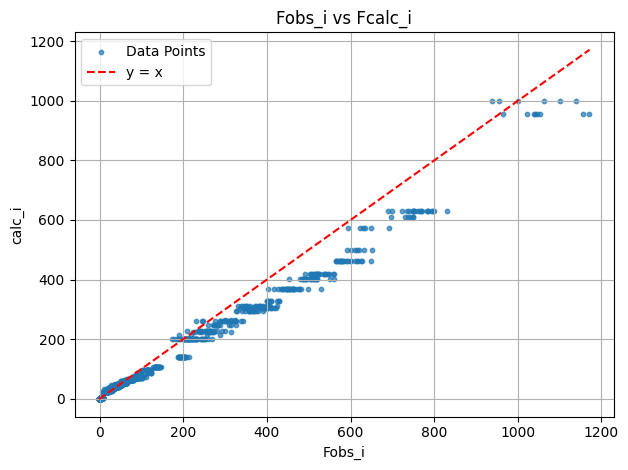

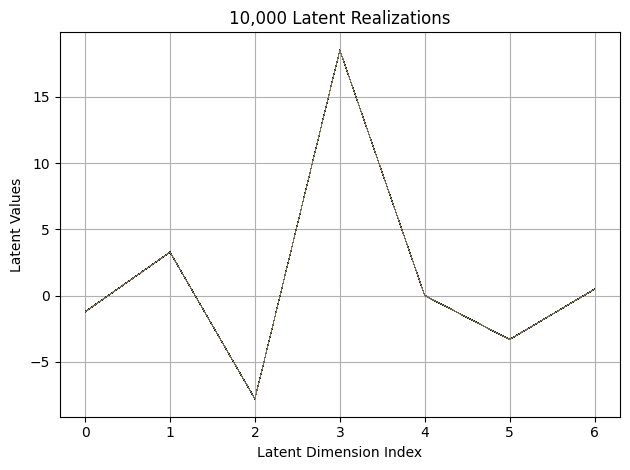

First 10 latent vectors from the VAE:
Sample 1: [-1.2174113988876343, 3.2915680408477783, -7.791645050048828, 18.531391143798828, -0.0008626263588666916, -3.3074252605438232, 0.4884800612926483]
Sample 2: [-1.2251278162002563, 3.2820136547088623, -7.795340061187744, 18.526939392089844, 0.009516631253063679, -3.3089616298675537, 0.49117910861968994]
Sample 3: [-1.2214124202728271, 3.2749133110046387, -7.792560577392578, 18.53218650817871, 0.016706526279449463, -3.3075027465820312, 0.47656917572021484]
Sample 4: [-1.226645588874817, 3.285611391067505, -7.79077672958374, 18.5123233795166, 0.0020865504629909992, -3.2973530292510986, 0.4805336892604828]
Sample 5: [-1.2239863872528076, 3.302447557449341, -7.792762279510498, 18.521867752075195, 0.010417377576231956, -3.308704137802124, 0.4971781075000763]
Sample 6: [-1.226738691329956, 3.288944721221924, -7.786622524261475, 18.528207778930664, 0.019153352826833725, -3.313918352127075, 0.4827389717102051]
Sample 7: [-1.2127705812454224, 3.2837

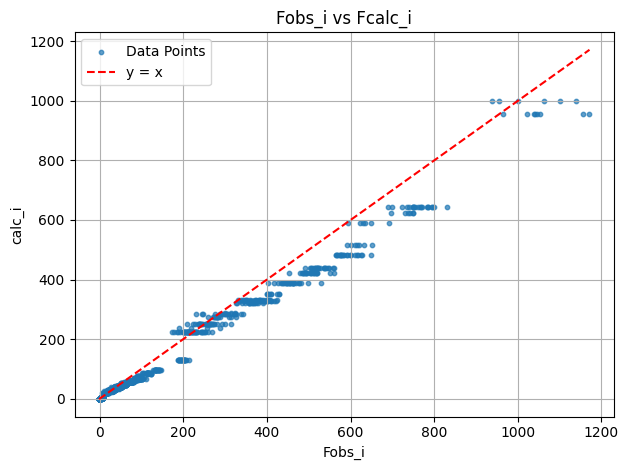

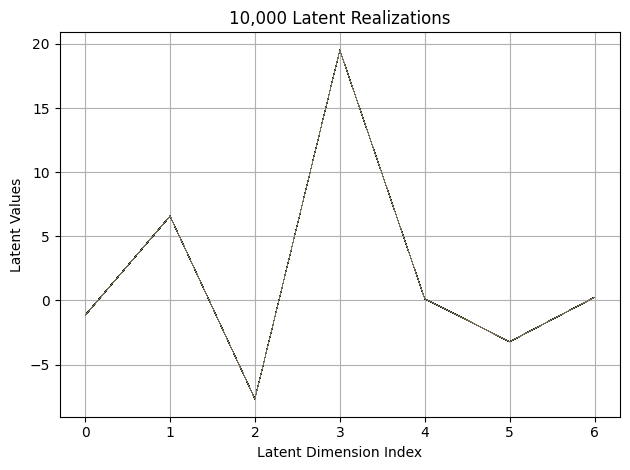

First 10 latent vectors from the VAE:
Sample 1: [-1.1639348268508911, 6.56675386428833, -7.678046703338623, 19.53175163269043, 0.12064504623413086, -3.221426248550415, 0.2444411665201187]
Sample 2: [-1.1566400527954102, 6.577389717102051, -7.681612968444824, 19.51300048828125, 0.13738955557346344, -3.214223623275757, 0.24296212196350098]
Sample 3: [-1.1638771295547485, 6.5766801834106445, -7.6719255447387695, 19.522367477416992, 0.12909096479415894, -3.217034101486206, 0.2460947334766388]
Sample 4: [-1.1732326745986938, 6.569271564483643, -7.682274341583252, 19.51943588256836, 0.13768820464611053, -3.2268643379211426, 0.2447415292263031]
Sample 5: [-1.1670002937316895, 6.565550327301025, -7.678210258483887, 19.521821975708008, 0.12702010571956635, -3.216277837753296, 0.24513189494609833]
Sample 6: [-1.1639842987060547, 6.580643653869629, -7.67977237701416, 19.52870750427246, 0.1375761777162552, -3.2103888988494873, 0.24646805226802826]
Sample 7: [-1.1687779426574707, 6.566587924957275,

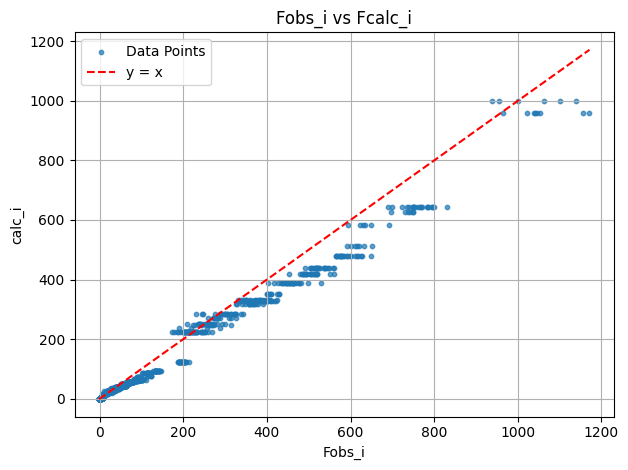

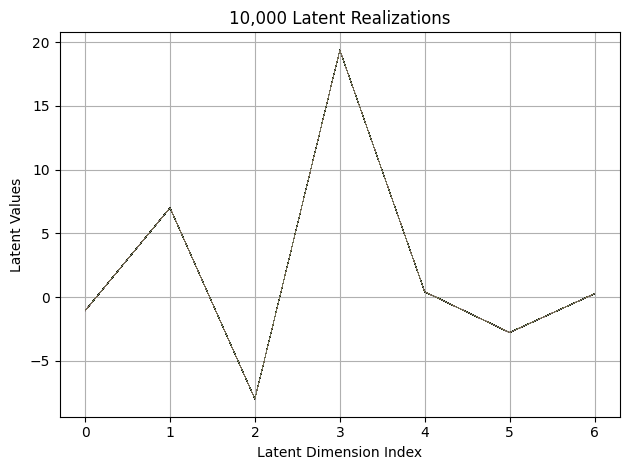

First 10 latent vectors from the VAE:
Sample 1: [-1.0619293451309204, 6.996955871582031, -7.973985195159912, 19.364870071411133, 0.42052993178367615, -2.767369508743286, 0.2608196437358856]
Sample 2: [-1.0624415874481201, 7.008458137512207, -7.990132808685303, 19.371614456176758, 0.42723342776298523, -2.7834527492523193, 0.26075050234794617]
Sample 3: [-1.0600323677062988, 7.009002208709717, -7.989619255065918, 19.371021270751953, 0.41991084814071655, -2.7694718837738037, 0.2607591450214386]
Sample 4: [-1.0613117218017578, 7.006900310516357, -7.982907295227051, 19.366498947143555, 0.4224850535392761, -2.772198438644409, 0.2694011628627777]
Sample 5: [-1.0634384155273438, 7.000720500946045, -7.972989559173584, 19.364953994750977, 0.42334476113319397, -2.7847883701324463, 0.2651318311691284]
Sample 6: [-1.0610700845718384, 7.0122599601745605, -7.976656913757324, 19.368621826171875, 0.42275354266166687, -2.7733514308929443, 0.2692328989505768]
Sample 7: [-1.0567166805267334, 6.99711465835

<Figure size 640x480 with 0 Axes>

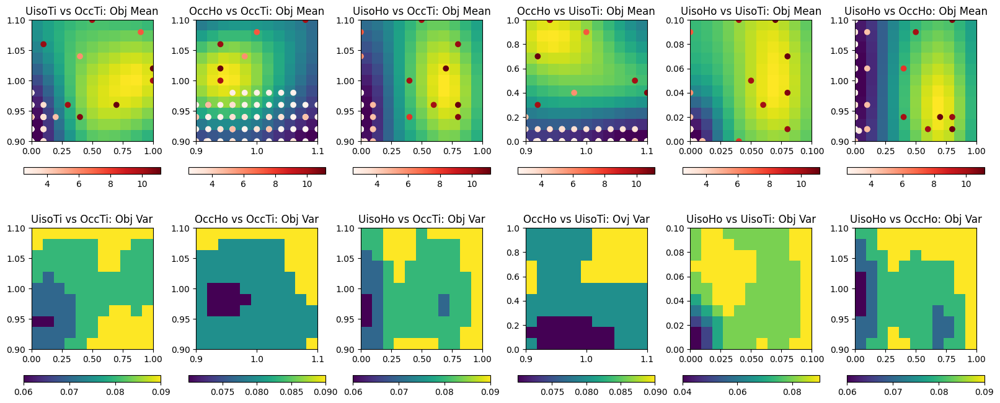

EI: [-1.          0.00512161  0.00406498 ...  0.00313458  0.00347307
  0.00374513]
Function eval #81
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [0.9800000190734863, 0.0, 1.0800000429153442, 0.0]
[0.421597, 0.920386, 0.008262, 0.00325]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4185
initial chi^2 1.8574e+06 with 2596 obs.
New scale: 0.4169
Cycle 0: 0.70s, Chi**2: 4.0478e+05 for 2596 obs., Lambda: 0,  Delta: 0.782, SVD=0
New scale: 0.4169
Maximum shift/esd = -251.274 for all cycles
Read f

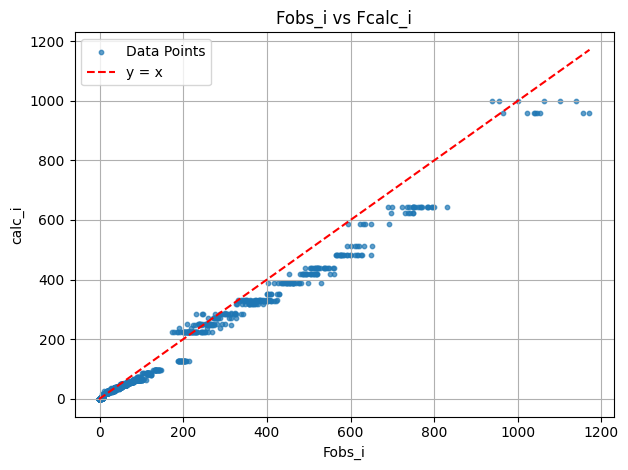

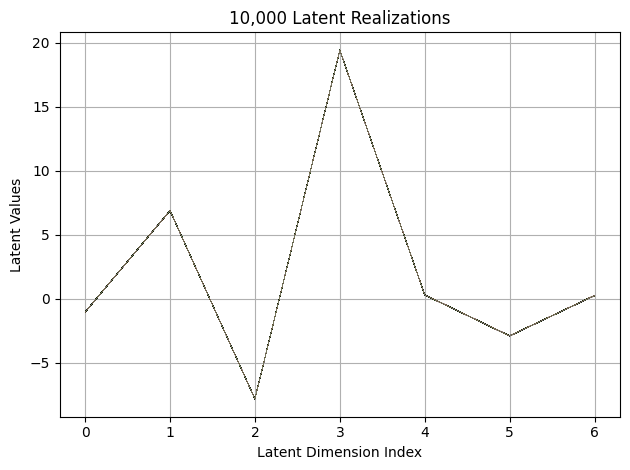

First 10 latent vectors from the VAE:
Sample 1: [-1.0506035089492798, 6.882307529449463, -7.841097354888916, 19.426700592041016, 0.2989165186882019, -2.9228434562683105, 0.24157874286174774]
Sample 2: [-1.0536112785339355, 6.873963832855225, -7.8321733474731445, 19.42271614074707, 0.2891038656234741, -2.91312313079834, 0.2407342791557312]
Sample 3: [-1.049058198928833, 6.870910167694092, -7.830869674682617, 19.419958114624023, 0.2891875207424164, -2.9284169673919678, 0.23758728802204132]
Sample 4: [-1.0594618320465088, 6.869412422180176, -7.834902763366699, 19.39531707763672, 0.3004128336906433, -2.930774450302124, 0.23777319490909576]
Sample 5: [-1.0516222715377808, 6.880599498748779, -7.838193893432617, 19.42599105834961, 0.2912798225879669, -2.9246182441711426, 0.23938529193401337]
Sample 6: [-1.0488685369491577, 6.882393836975098, -7.840128421783447, 19.421045303344727, 0.2749948501586914, -2.9212045669555664, 0.24309955537319183]
Sample 7: [-1.066112995147705, 6.88278865814209, -7

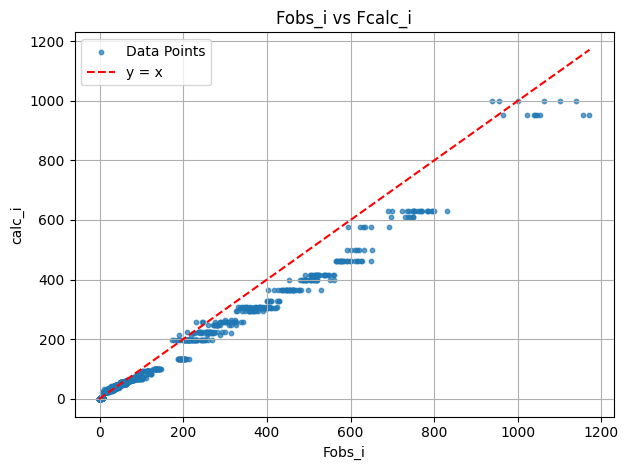

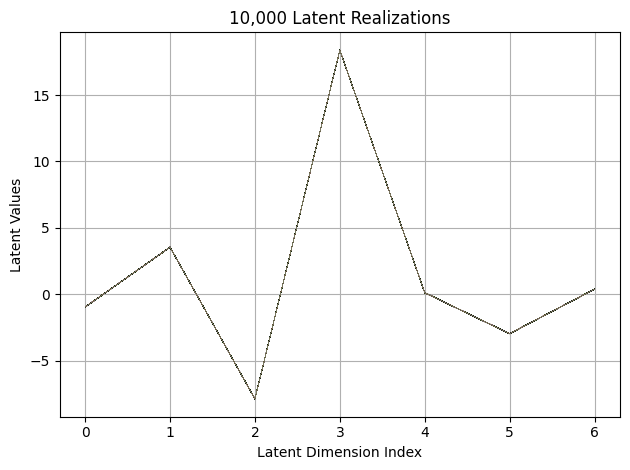

First 10 latent vectors from the VAE:
Sample 1: [-0.9674646258354187, 3.549260139465332, -7.877111434936523, 18.387882232666016, 0.12745124101638794, -2.9770734310150146, 0.3895970284938812]
Sample 2: [-0.9561029076576233, 3.54038405418396, -7.882697582244873, 18.386188507080078, 0.10997583717107773, -2.967397928237915, 0.39352643489837646]
Sample 3: [-0.9562399387359619, 3.540013551712036, -7.867165565490723, 18.381988525390625, 0.11898614466190338, -2.977273941040039, 0.37817755341529846]
Sample 4: [-0.9627110362052917, 3.5432209968566895, -7.878474235534668, 18.396808624267578, 0.11756288260221481, -2.966744899749756, 0.38575252890586853]
Sample 5: [-0.9595893025398254, 3.542400598526001, -7.879824161529541, 18.379249572753906, 0.1252436637878418, -2.973787546157837, 0.3844906687736511]
Sample 6: [-0.9620488286018372, 3.5322067737579346, -7.882631778717041, 18.389328002929688, 0.11847442388534546, -2.9550158977508545, 0.3740132451057434]
Sample 7: [-0.9696592092514038, 3.55966663360

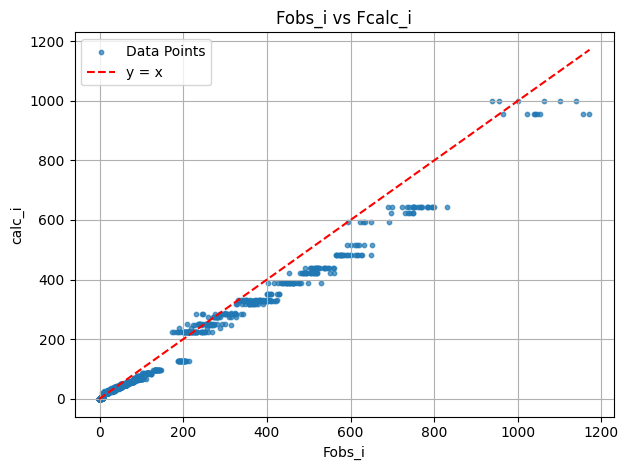

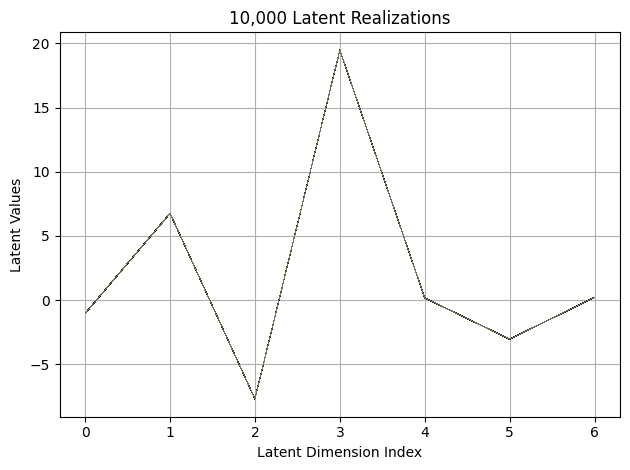

First 10 latent vectors from the VAE:
Sample 1: [-1.0593187808990479, 6.7542219161987305, -7.681410312652588, 19.475204467773438, 0.16288980841636658, -3.0511505603790283, 0.20757144689559937]
Sample 2: [-1.0427013635635376, 6.7613420486450195, -7.695270538330078, 19.474409103393555, 0.16914737224578857, -3.0455844402313232, 0.21778267621994019]
Sample 3: [-1.0411019325256348, 6.74735689163208, -7.705084800720215, 19.474641799926758, 0.1618586778640747, -3.040512800216675, 0.20710895955562592]
Sample 4: [-1.0482580661773682, 6.7492852210998535, -7.702783107757568, 19.478975296020508, 0.15849152207374573, -3.0463221073150635, 0.2037522941827774]
Sample 5: [-1.0465155839920044, 6.749613285064697, -7.710651397705078, 19.46465492248535, 0.16696202754974365, -3.0444047451019287, 0.2106100469827652]
Sample 6: [-1.048041820526123, 6.769687175750732, -7.692380905151367, 19.460620880126953, 0.15858091413974762, -3.0418097972869873, 0.20523875951766968]
Sample 7: [-1.0441641807556152, 6.75411033

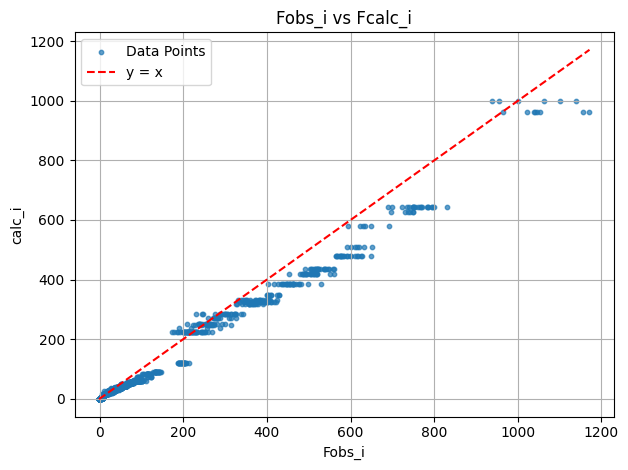

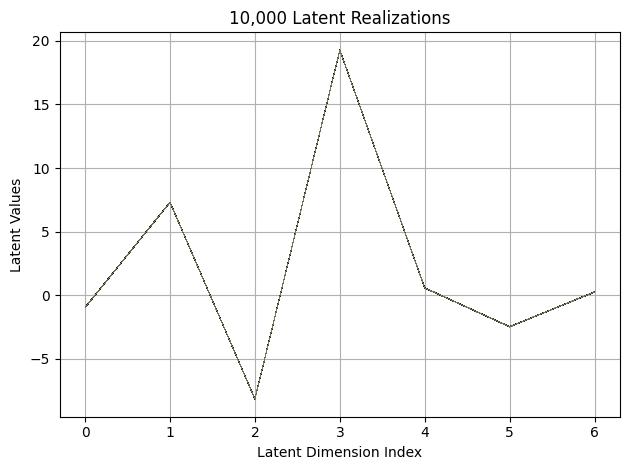

First 10 latent vectors from the VAE:
Sample 1: [-0.956627607345581, 7.3146891593933105, -8.132511138916016, 19.26078224182129, 0.5940555930137634, -2.464670419692993, 0.2643093764781952]
Sample 2: [-0.9584314227104187, 7.306321144104004, -8.139140129089355, 19.27582550048828, 0.5911855697631836, -2.463526964187622, 0.27850252389907837]
Sample 3: [-0.9586232900619507, 7.319425106048584, -8.143129348754883, 19.25609016418457, 0.578575849533081, -2.4648807048797607, 0.26738452911376953]
Sample 4: [-0.9562099575996399, 7.316896438598633, -8.14455795288086, 19.272201538085938, 0.5792434215545654, -2.4549062252044678, 0.25326240062713623]
Sample 5: [-0.939055323600769, 7.31385612487793, -8.150313377380371, 19.28322410583496, 0.5801687240600586, -2.4679105281829834, 0.2633626163005829]
Sample 6: [-0.9627801179885864, 7.301255226135254, -8.137129783630371, 19.26127815246582, 0.5888736248016357, -2.4731509685516357, 0.2669946849346161]
Sample 7: [-0.9406285881996155, 7.313129901885986, -8.1461

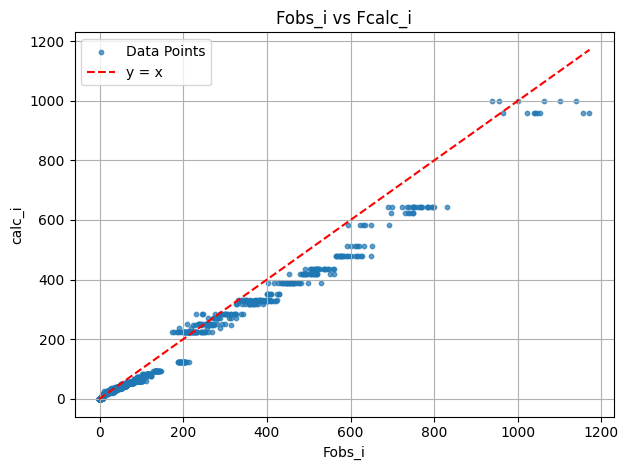

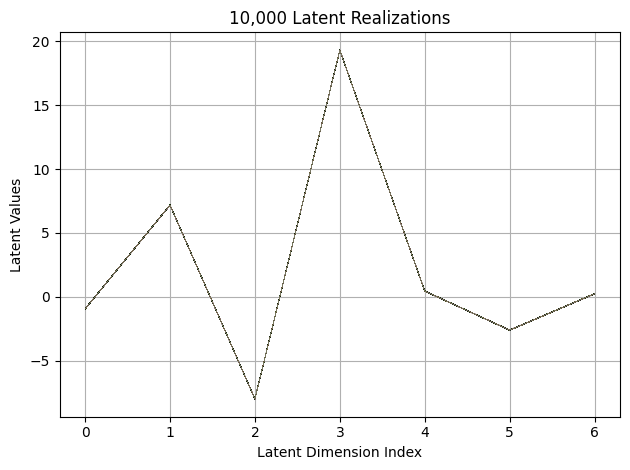

First 10 latent vectors from the VAE:
Sample 1: [-0.9536609649658203, 7.183377742767334, -7.996278285980225, 19.322629928588867, 0.4564402997493744, -2.595386028289795, 0.23437342047691345]
Sample 2: [-0.9372855424880981, 7.197968006134033, -8.005520820617676, 19.316068649291992, 0.43453311920166016, -2.613616704940796, 0.23547659814357758]
Sample 3: [-0.9431882500648499, 7.181134223937988, -7.987685680389404, 19.325130462646484, 0.4465068578720093, -2.6058895587921143, 0.22877974808216095]
Sample 4: [-0.9497511386871338, 7.191084861755371, -7.992526531219482, 19.31581687927246, 0.469362735748291, -2.6176040172576904, 0.24503430724143982]
Sample 5: [-0.94626384973526, 7.195193290710449, -7.991774559020996, 19.317672729492188, 0.45063328742980957, -2.6013529300689697, 0.22451668977737427]
Sample 6: [-0.949065089225769, 7.183574199676514, -7.9992828369140625, 19.306398391723633, 0.44957002997398376, -2.6000442504882812, 0.24349068105220795]
Sample 7: [-0.9541259407997131, 7.1757817268371

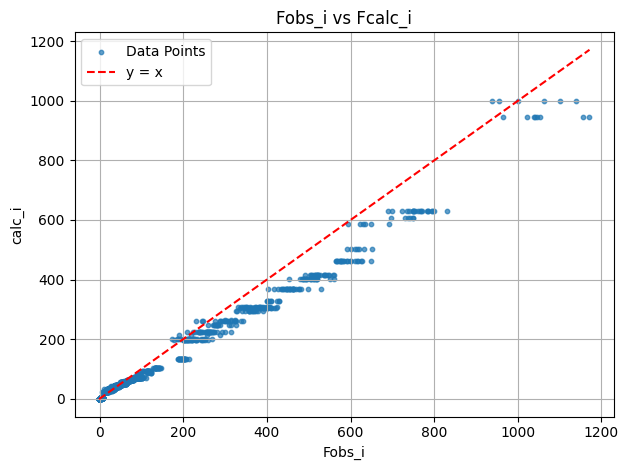

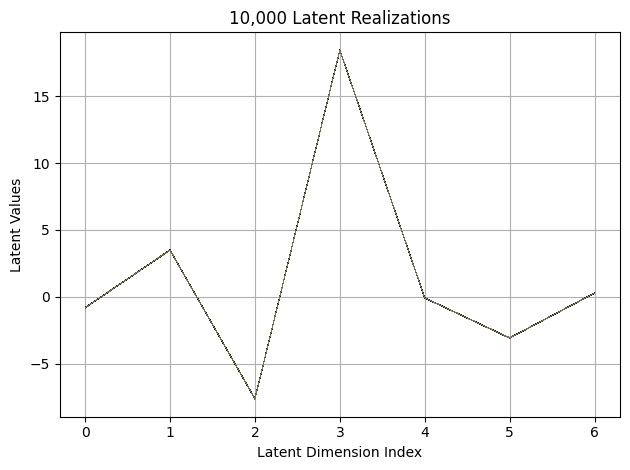

First 10 latent vectors from the VAE:
Sample 1: [-0.830916702747345, 3.485806941986084, -7.632138252258301, 18.44023895263672, -0.09174386411905289, -3.097109317779541, 0.2671757638454437]
Sample 2: [-0.8200245499610901, 3.500372886657715, -7.634510517120361, 18.44823455810547, -0.08525454998016357, -3.093078374862671, 0.27175191044807434]
Sample 3: [-0.8212195634841919, 3.4855144023895264, -7.640716552734375, 18.4415283203125, -0.08151625841856003, -3.091177463531494, 0.2852340042591095]
Sample 4: [-0.8299158811569214, 3.4892630577087402, -7.636374473571777, 18.44639778137207, -0.08884210884571075, -3.088366985321045, 0.2861815094947815]
Sample 5: [-0.8339081406593323, 3.494448184967041, -7.630659580230713, 18.450008392333984, -0.09555653482675552, -3.0801608562469482, 0.267627090215683]
Sample 6: [-0.8234327435493469, 3.4935574531555176, -7.639492034912109, 18.448169708251953, -0.08273879438638687, -3.0952329635620117, 0.2649844288825989]
Sample 7: [-0.8222881555557251, 3.49982070922

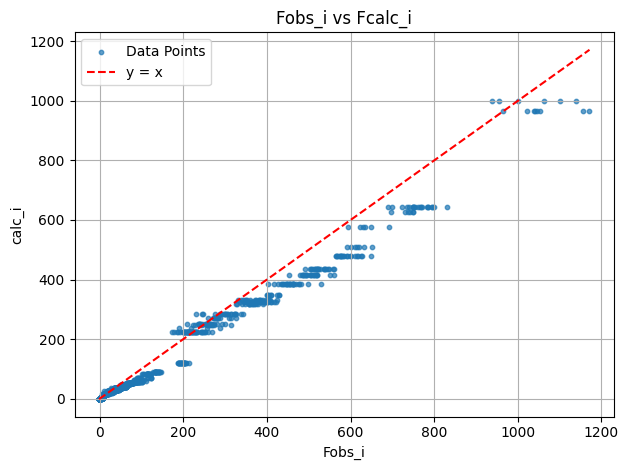

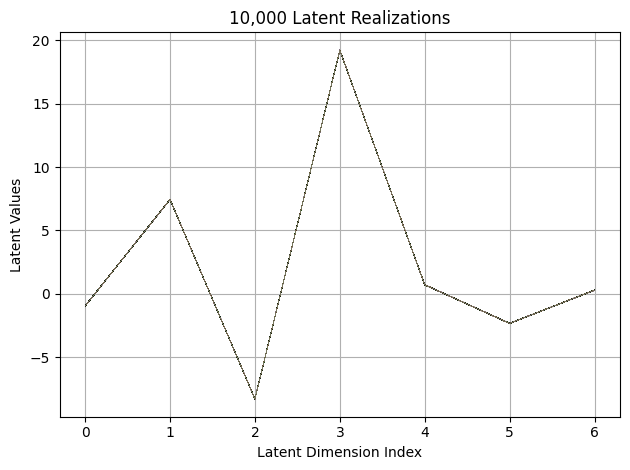

First 10 latent vectors from the VAE:
Sample 1: [-0.9580634832382202, 7.436509132385254, -8.29439926147461, 19.20682144165039, 0.7153804898262024, -2.323455333709717, 0.2902281880378723]
Sample 2: [-0.9609995484352112, 7.453569412231445, -8.27283000946045, 19.211502075195312, 0.72198086977005, -2.3313663005828857, 0.2968156039714813]
Sample 3: [-0.9603729248046875, 7.432990074157715, -8.28700065612793, 19.209617614746094, 0.708523154258728, -2.323183059692383, 0.28443989157676697]
Sample 4: [-0.9544852375984192, 7.451948165893555, -8.29482364654541, 19.222352981567383, 0.7220004796981812, -2.3233320713043213, 0.2933362126350403]
Sample 5: [-0.9522698521614075, 7.4513258934021, -8.28591251373291, 19.21292495727539, 0.7238743305206299, -2.319263458251953, 0.2893466353416443]
Sample 6: [-0.9463034868240356, 7.4417595863342285, -8.2742338180542, 19.209213256835938, 0.7246732115745544, -2.3376855850219727, 0.28937962651252747]
Sample 7: [-0.9647961258888245, 7.442875862121582, -8.2931842803

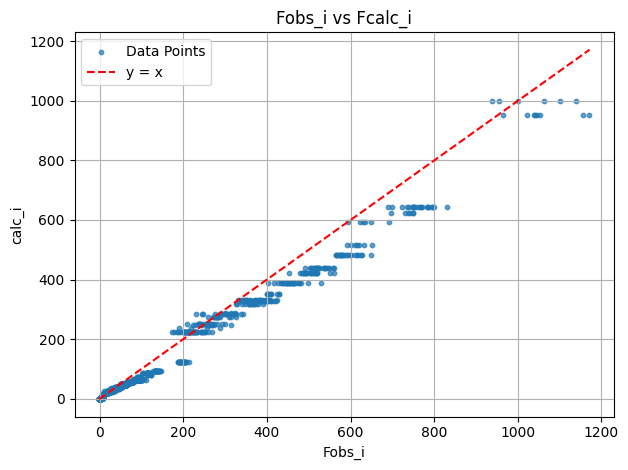

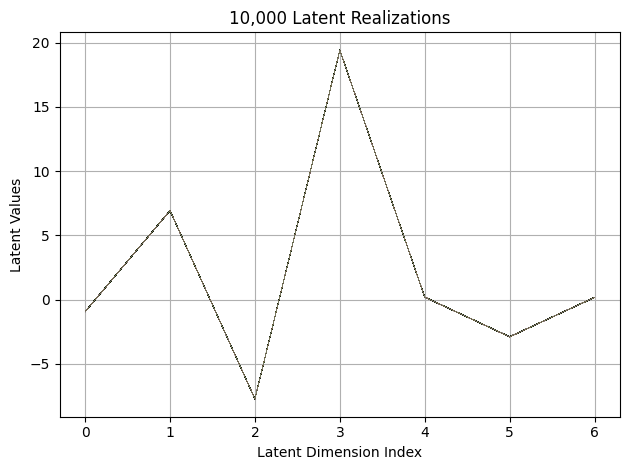

First 10 latent vectors from the VAE:
Sample 1: [-0.932545006275177, 6.935423374176025, -7.716070652008057, 19.425880432128906, 0.20683936774730682, -2.8725457191467285, 0.17211270332336426]
Sample 2: [-0.9254363179206848, 6.929073810577393, -7.714572906494141, 19.411272048950195, 0.1894868016242981, -2.8828084468841553, 0.17252497375011444]
Sample 3: [-0.9308087229728699, 6.9311347007751465, -7.715047359466553, 19.408517837524414, 0.20103819668293, -2.8921282291412354, 0.1686715930700302]
Sample 4: [-0.9272639155387878, 6.936541557312012, -7.721467018127441, 19.417972564697266, 0.1987190842628479, -2.883208751678467, 0.16602809727191925]
Sample 5: [-0.9326702356338501, 6.948659896850586, -7.723467826843262, 19.433927536010742, 0.19762900471687317, -2.895726442337036, 0.1843625158071518]
Sample 6: [-0.9266417622566223, 6.936612606048584, -7.735287189483643, 19.4238224029541, 0.20215322077274323, -2.8838419914245605, 0.1864907443523407]
Sample 7: [-0.9317730665206909, 6.9394755363464355

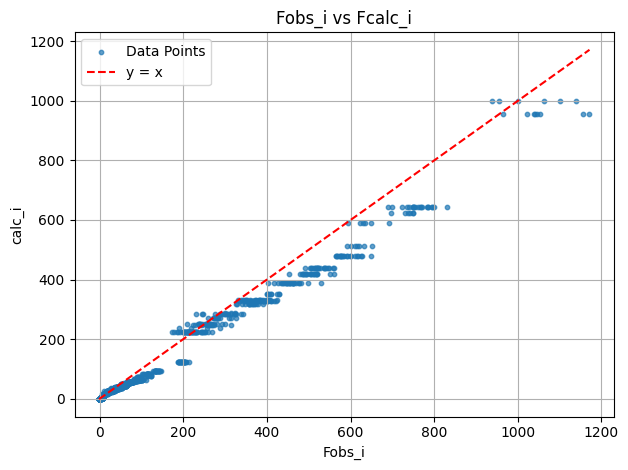

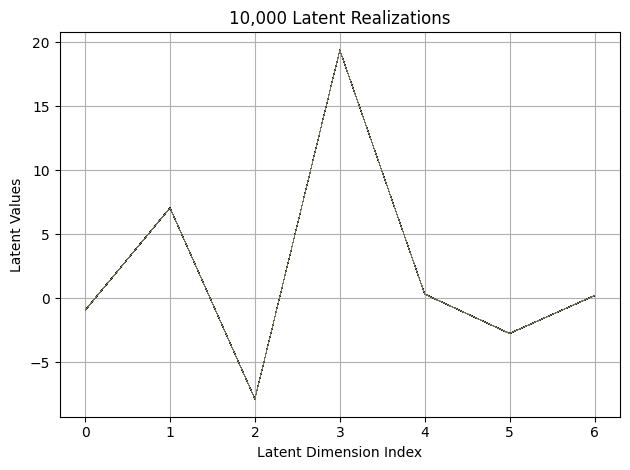

First 10 latent vectors from the VAE:
Sample 1: [-0.9383420348167419, 7.0577569007873535, -7.856631755828857, 19.363584518432617, 0.3337167501449585, -2.7516696453094482, 0.2175777554512024]
Sample 2: [-0.9343805909156799, 7.065617084503174, -7.850408554077148, 19.36050796508789, 0.31510990858078003, -2.74713134765625, 0.20916590094566345]
Sample 3: [-0.9427573084831238, 7.056623935699463, -7.846706867218018, 19.38025665283203, 0.32284969091415405, -2.734416961669922, 0.20598751306533813]
Sample 4: [-0.9391540288925171, 7.054383754730225, -7.858430862426758, 19.3710880279541, 0.3172306418418884, -2.750563383102417, 0.20691996812820435]
Sample 5: [-0.9438609480857849, 7.073211669921875, -7.861480712890625, 19.362974166870117, 0.32742416858673096, -2.7571334838867188, 0.20931203663349152]
Sample 6: [-0.938559889793396, 7.046108245849609, -7.845594882965088, 19.372522354125977, 0.31726258993148804, -2.7436683177948, 0.2087762951850891]
Sample 7: [-0.9380858540534973, 7.061466693878174, -7

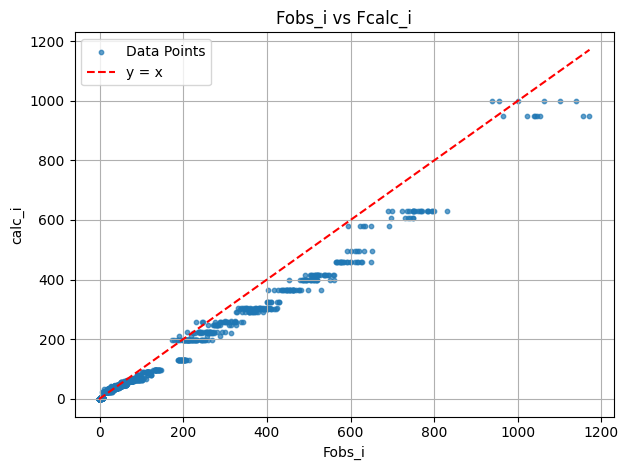

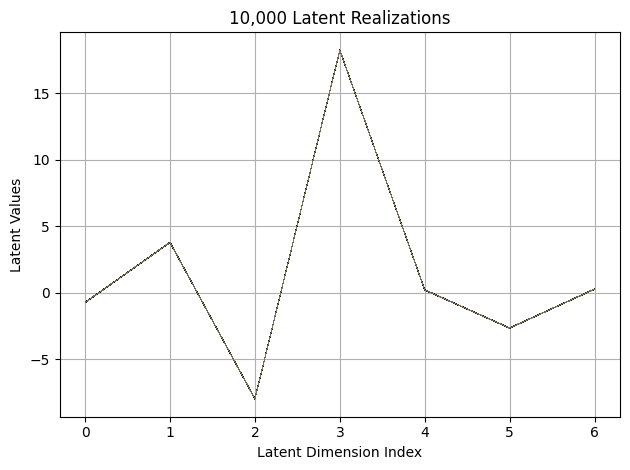

First 10 latent vectors from the VAE:
Sample 1: [-0.7181330323219299, 3.8030288219451904, -7.960521697998047, 18.25518035888672, 0.2274215966463089, -2.625941038131714, 0.29825255274772644]
Sample 2: [-0.7286406755447388, 3.791771650314331, -7.956585884094238, 18.250484466552734, 0.22256800532341003, -2.630345582962036, 0.2888875901699066]
Sample 3: [-0.7084293961524963, 3.810469627380371, -7.957530975341797, 18.252878189086914, 0.23735171556472778, -2.6351728439331055, 0.2935658395290375]
Sample 4: [-0.7139567136764526, 3.793077230453491, -7.967972755432129, 18.25507926940918, 0.23011431097984314, -2.63523268699646, 0.2985939383506775]
Sample 5: [-0.7199692726135254, 3.798097610473633, -7.944525241851807, 18.23984146118164, 0.22271879017353058, -2.634331226348877, 0.2796730399131775]
Sample 6: [-0.7270252704620361, 3.8064355850219727, -7.957479000091553, 18.25394630432129, 0.2370642125606537, -2.6330411434173584, 0.2894994914531708]
Sample 7: [-0.7115781903266907, 3.804908037185669, -

<Figure size 640x480 with 0 Axes>

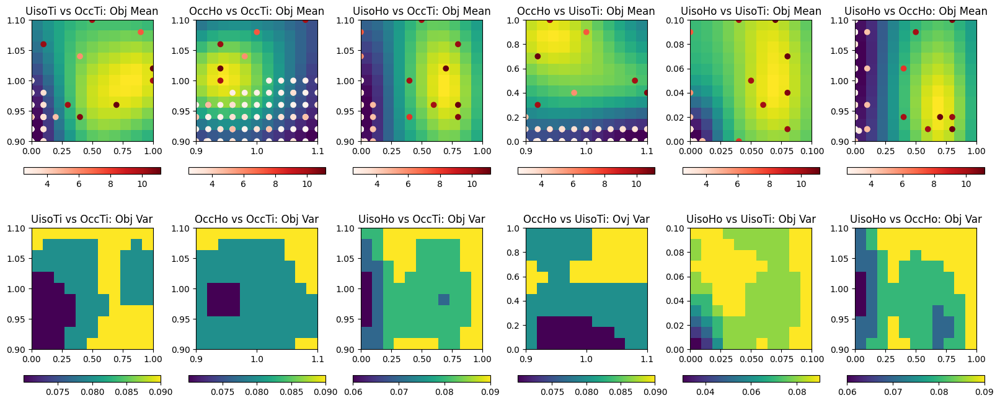

EI: [-1.          0.00547571  0.00437441 ...  0.00354362  0.00391735
  0.00421579]
Function eval #91
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [1.0, 0.0, 1.0, 0.0]
[0.421597, 0.920386, 0.008262, 0.00325]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4816
initial chi^2 1.0619e+06 with 2596 obs.
New scale: 0.4803
Cycle 0: 0.61s, Chi**2: 3.3226e+05 for 2596 obs., Lambda: 0,  Delta: 0.687, SVD=0
New scale: 0.4803
Maximum shift/esd = -185.493 for all cycles
Read from file:C:\Users\USER\PhD\IAM

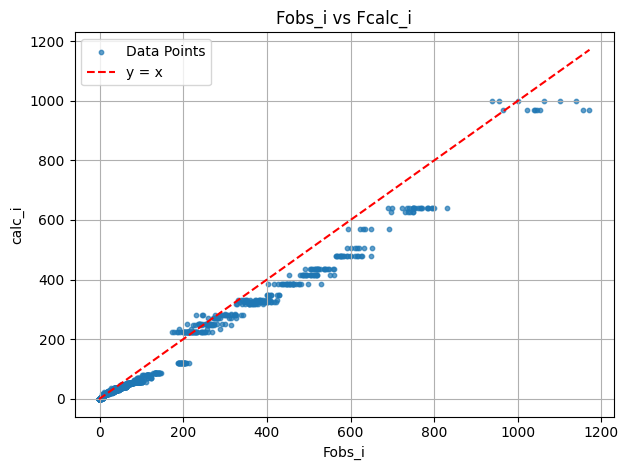

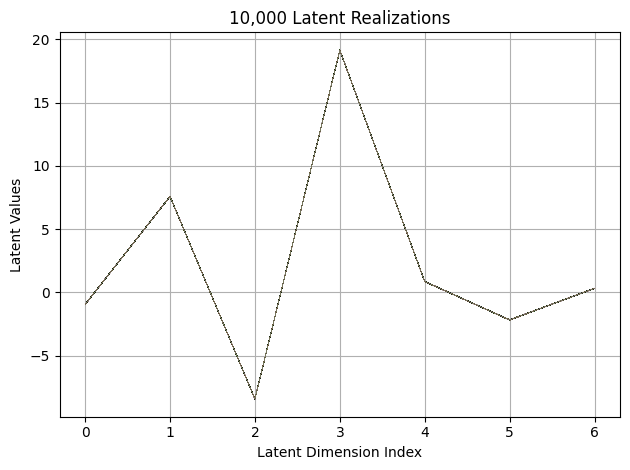

First 10 latent vectors from the VAE:
Sample 1: [-0.9607524871826172, 7.587039947509766, -8.440569877624512, 19.16118049621582, 0.8479881286621094, -2.1856958866119385, 0.31579503417015076]
Sample 2: [-0.9605036973953247, 7.593143463134766, -8.426504135131836, 19.154157638549805, 0.8460254073143005, -2.183119058609009, 0.3288368284702301]
Sample 3: [-0.9612352848052979, 7.57487678527832, -8.438722610473633, 19.155540466308594, 0.851979672908783, -2.1888768672943115, 0.3242984712123871]
Sample 4: [-0.967852771282196, 7.5681257247924805, -8.435096740722656, 19.15619468688965, 0.8508461713790894, -2.175649881362915, 0.3092764616012573]
Sample 5: [-0.9696414470672607, 7.578049182891846, -8.44306468963623, 19.15106964111328, 0.858672022819519, -2.1726253032684326, 0.3044228255748749]
Sample 6: [-0.9538282155990601, 7.591781139373779, -8.43207836151123, 19.145977020263672, 0.8550235033035278, -2.188059091567993, 0.31682562828063965]
Sample 7: [-0.9482978582382202, 7.580179214477539, -8.43737

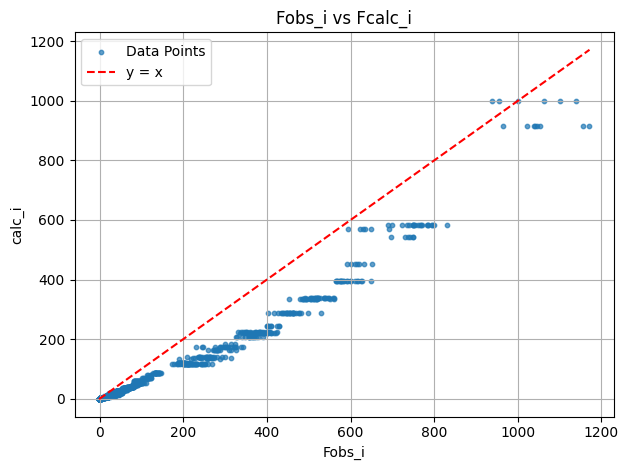

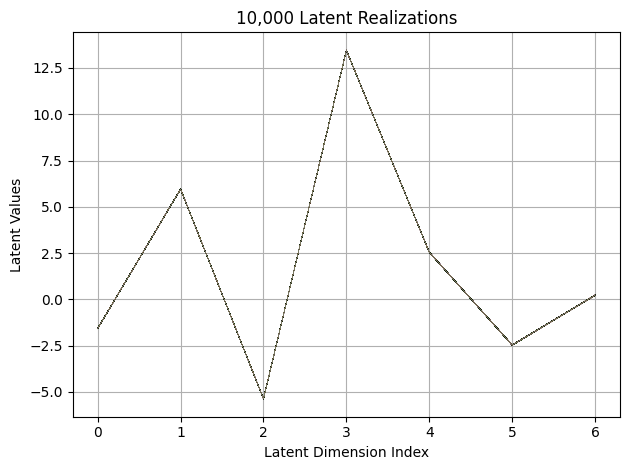

First 10 latent vectors from the VAE:
Sample 1: [-1.5628938674926758, 5.941247940063477, -5.357654094696045, 13.454758644104004, 2.528763771057129, -2.455655574798584, 0.22321537137031555]
Sample 2: [-1.575435757637024, 5.9428300857543945, -5.365795612335205, 13.44536304473877, 2.548654794692993, -2.4737560749053955, 0.22500616312026978]
Sample 3: [-1.5768343210220337, 5.955904960632324, -5.378502368927002, 13.448461532592773, 2.5317511558532715, -2.466609239578247, 0.2358633279800415]
Sample 4: [-1.5907279253005981, 5.9659199714660645, -5.373466491699219, 13.450228691101074, 2.542386531829834, -2.4673001766204834, 0.21999214589595795]
Sample 5: [-1.5765067338943481, 5.947312355041504, -5.367119312286377, 13.450304985046387, 2.5359246730804443, -2.4719583988189697, 0.21482214331626892]
Sample 6: [-1.575905203819275, 5.957246780395508, -5.369804859161377, 13.444583892822266, 2.53943133354187, -2.4824001789093018, 0.22265371680259705]
Sample 7: [-1.5736674070358276, 5.957108020782471, -5

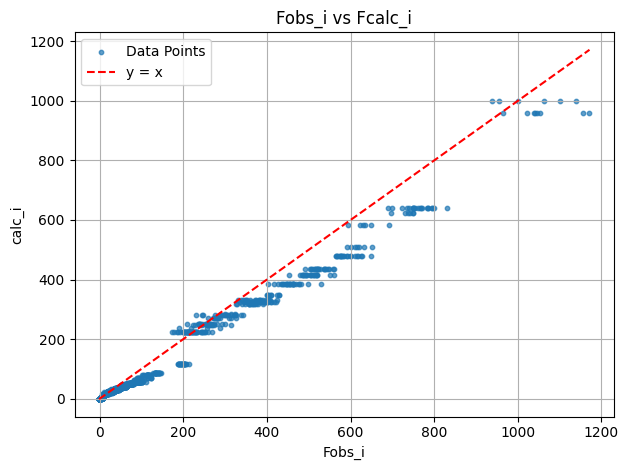

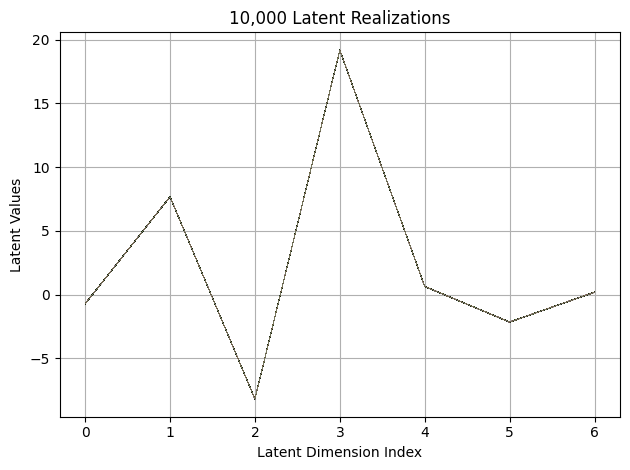

First 10 latent vectors from the VAE:
Sample 1: [-0.7208071947097778, 7.670358180999756, -8.182869911193848, 19.170955657958984, 0.6438930034637451, -2.1468827724456787, 0.1902155578136444]
Sample 2: [-0.7188791036605835, 7.687567710876465, -8.175750732421875, 19.170175552368164, 0.6420964598655701, -2.1591529846191406, 0.18388618528842926]
Sample 3: [-0.7263817191123962, 7.673076629638672, -8.171643257141113, 19.176862716674805, 0.6273161768913269, -2.1485652923583984, 0.18940822780132294]
Sample 4: [-0.7171366810798645, 7.6826395988464355, -8.17141056060791, 19.172208786010742, 0.6320555806159973, -2.1583669185638428, 0.19083990156650543]
Sample 5: [-0.7238898873329163, 7.676966667175293, -8.175240516662598, 19.166608810424805, 0.6431984305381775, -2.1411211490631104, 0.18417254090309143]
Sample 6: [-0.710191011428833, 7.672807216644287, -8.175750732421875, 19.16619873046875, 0.6421392560005188, -2.146005630493164, 0.19654838740825653]
Sample 7: [-0.7158512473106384, 7.66058492660522

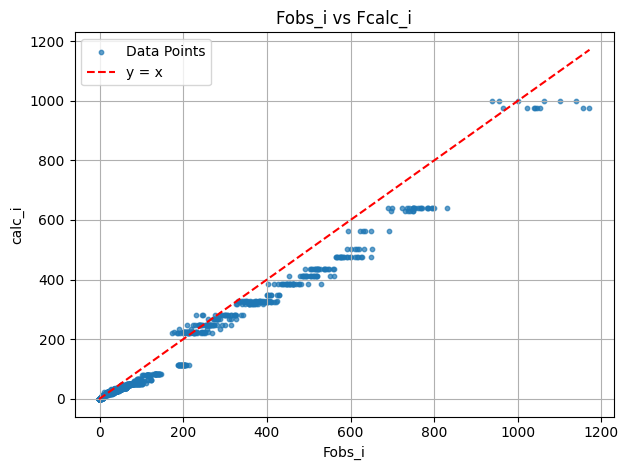

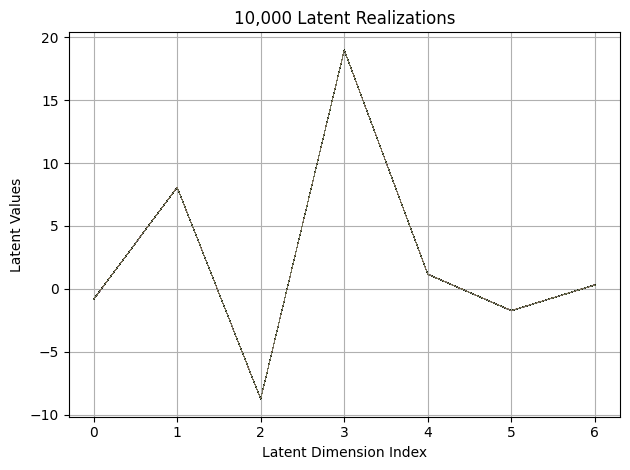

First 10 latent vectors from the VAE:
Sample 1: [-0.8471591472625732, 8.061882972717285, -8.749853134155273, 18.97334861755371, 1.1616240739822388, -1.7499881982803345, 0.3147617280483246]
Sample 2: [-0.8400440216064453, 8.067509651184082, -8.762388229370117, 18.981334686279297, 1.1566098928451538, -1.750046730041504, 0.31202709674835205]
Sample 3: [-0.8394373655319214, 8.06171989440918, -8.750622749328613, 18.99510383605957, 1.1532198190689087, -1.7410224676132202, 0.3146045506000519]
Sample 4: [-0.8320497274398804, 8.077384948730469, -8.749845504760742, 18.989219665527344, 1.1459314823150635, -1.7475066184997559, 0.3126335144042969]
Sample 5: [-0.8277662992477417, 8.082403182983398, -8.756732940673828, 18.979022979736328, 1.1622374057769775, -1.7394723892211914, 0.31013795733451843]
Sample 6: [-0.8336533308029175, 8.074361801147461, -8.77536678314209, 18.989227294921875, 1.1672322750091553, -1.7451609373092651, 0.31407439708709717]
Sample 7: [-0.8441701531410217, 8.067086219787598, -

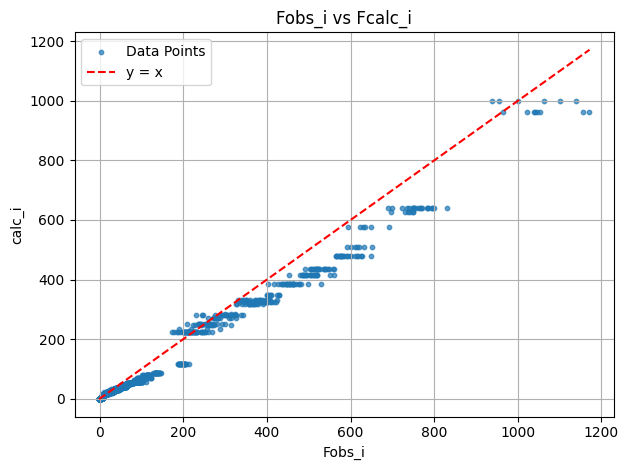

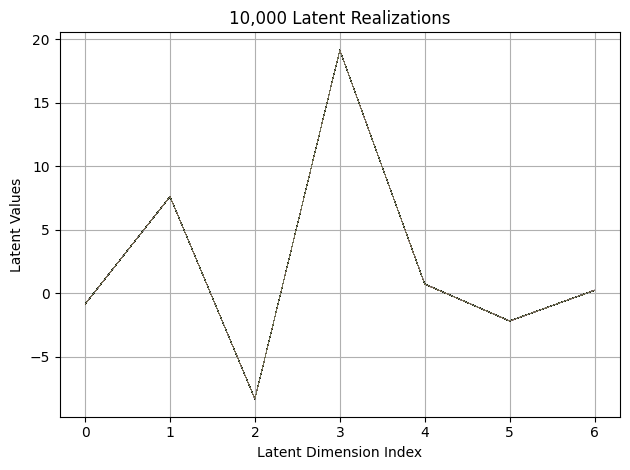

First 10 latent vectors from the VAE:
Sample 1: [-0.8309739828109741, 7.625242710113525, -8.31587028503418, 19.154769897460938, 0.7330541014671326, -2.164151668548584, 0.2595362067222595]
Sample 2: [-0.8360246419906616, 7.623495101928711, -8.303919792175293, 19.16639518737793, 0.7387232184410095, -2.180574655532837, 0.25089356303215027]
Sample 3: [-0.8461601734161377, 7.621279716491699, -8.321552276611328, 19.156234741210938, 0.7404675483703613, -2.161695718765259, 0.24595504999160767]
Sample 4: [-0.8438334465026855, 7.629847049713135, -8.298489570617676, 19.169668197631836, 0.7476691007614136, -2.1627302169799805, 0.2541802227497101]
Sample 5: [-0.8491562604904175, 7.607019424438477, -8.301983833312988, 19.152790069580078, 0.747826874256134, -2.1719443798065186, 0.25331974029541016]
Sample 6: [-0.8425149321556091, 7.629922389984131, -8.306455612182617, 19.162683486938477, 0.7411215901374817, -2.167330503463745, 0.2433864027261734]
Sample 7: [-0.8362571001052856, 7.6238861083984375, -8

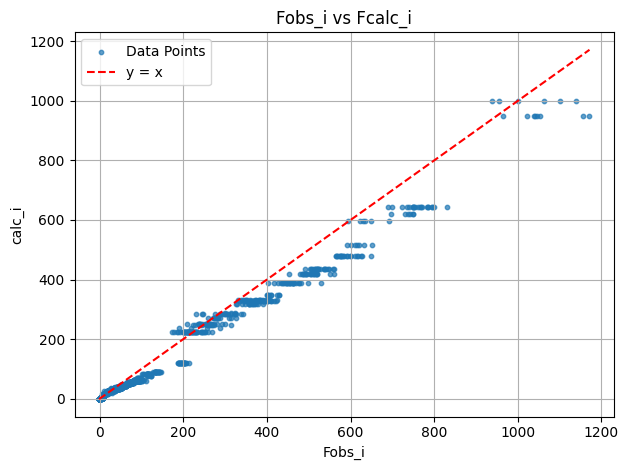

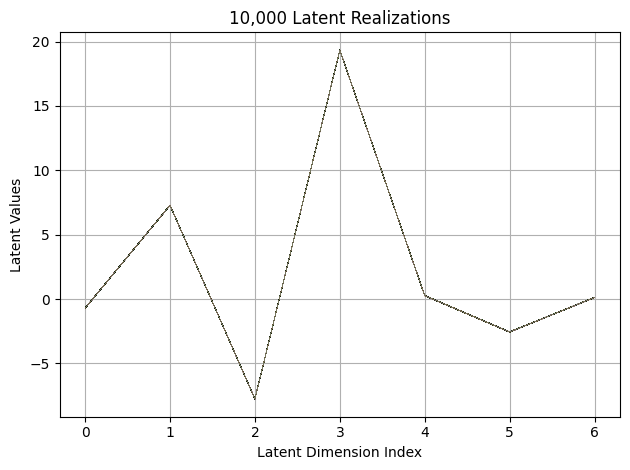

First 10 latent vectors from the VAE:
Sample 1: [-0.7180402278900146, 7.280632972717285, -7.753164768218994, 19.315284729003906, 0.25611886382102966, -2.5715136528015137, 0.12256191670894623]
Sample 2: [-0.7020503878593445, 7.2698822021484375, -7.76674747467041, 19.343523025512695, 0.25440701842308044, -2.554485559463501, 0.12487529218196869]
Sample 3: [-0.7061285972595215, 7.272265434265137, -7.76201057434082, 19.3389892578125, 0.28298020362854004, -2.556898593902588, 0.12075436860322952]
Sample 4: [-0.7145602703094482, 7.270148754119873, -7.748858451843262, 19.34174919128418, 0.2706790566444397, -2.562866687774658, 0.10489525645971298]
Sample 5: [-0.7153140902519226, 7.274326801300049, -7.757580280303955, 19.33255958557129, 0.26763108372688293, -2.5601770877838135, 0.1119421049952507]
Sample 6: [-0.7073478102684021, 7.285302639007568, -7.755670070648193, 19.32411003112793, 0.270608127117157, -2.545055866241455, 0.11701469868421555]
Sample 7: [-0.7079975605010986, 7.274887561798096, -

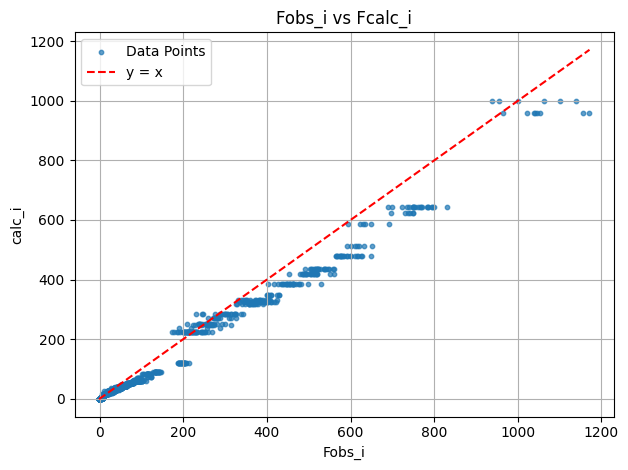

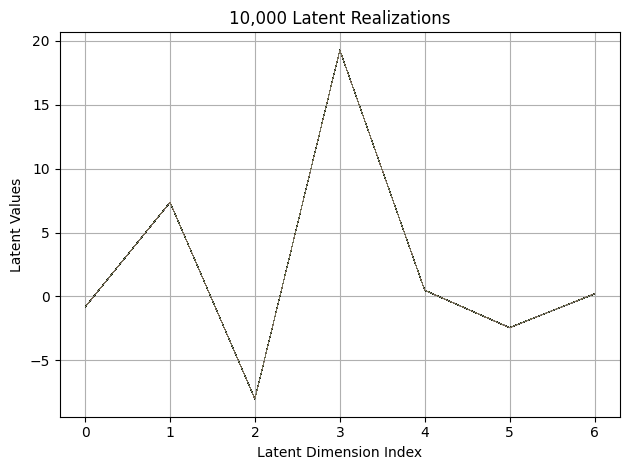

First 10 latent vectors from the VAE:
Sample 1: [-0.8258395791053772, 7.350325107574463, -8.01565933227539, 19.26702880859375, 0.48979583382606506, -2.444308280944824, 0.20710352063179016]
Sample 2: [-0.8456963896751404, 7.364233016967773, -8.011283874511719, 19.266559600830078, 0.4700407385826111, -2.441661834716797, 0.2091708928346634]
Sample 3: [-0.8230405449867249, 7.364004135131836, -8.001736640930176, 19.2706356048584, 0.4808434545993805, -2.438859701156616, 0.2055111676454544]
Sample 4: [-0.8343614339828491, 7.357228755950928, -8.012862205505371, 19.265708923339844, 0.4853459894657135, -2.443319797515869, 0.20555247366428375]
Sample 5: [-0.829841136932373, 7.378358840942383, -8.008440971374512, 19.275989532470703, 0.4806838035583496, -2.4509501457214355, 0.20667541027069092]
Sample 6: [-0.8406899571418762, 7.362977981567383, -8.03227424621582, 19.26979637145996, 0.4799739718437195, -2.4555625915527344, 0.20614874362945557]
Sample 7: [-0.833835780620575, 7.3644118309021, -8.01751

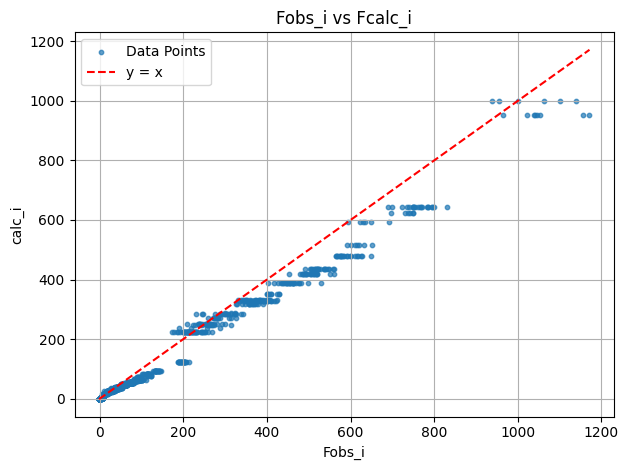

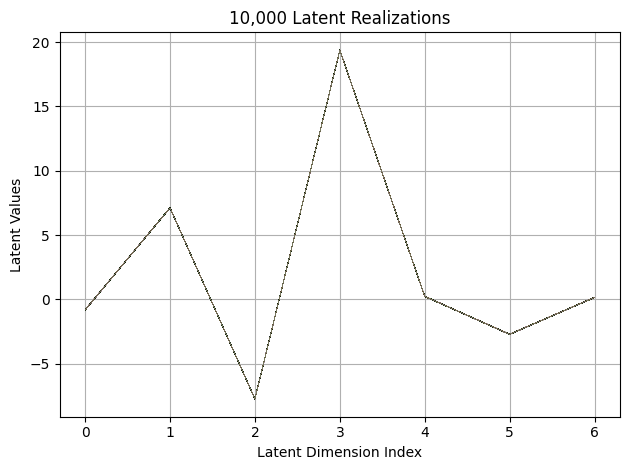

First 10 latent vectors from the VAE:
Sample 1: [-0.8169947862625122, 7.108725070953369, -7.735950469970703, 19.374418258666992, 0.23142144083976746, -2.7284576892852783, 0.14335106313228607]
Sample 2: [-0.811050295829773, 7.10400390625, -7.734930038452148, 19.374794006347656, 0.23275892436504364, -2.7265396118164062, 0.15076597034931183]
Sample 3: [-0.8202871680259705, 7.097250938415527, -7.737331390380859, 19.36577606201172, 0.23353244364261627, -2.7149994373321533, 0.1439806967973709]
Sample 4: [-0.8214685916900635, 7.1080427169799805, -7.731486797332764, 19.38540267944336, 0.22568686306476593, -2.7204861640930176, 0.13851633667945862]
Sample 5: [-0.814314067363739, 7.117994785308838, -7.75142765045166, 19.378807067871094, 0.24345934391021729, -2.7202770709991455, 0.14653794467449188]
Sample 6: [-0.812150239944458, 7.124368190765381, -7.74615478515625, 19.376197814941406, 0.23778967559337616, -2.7112326622009277, 0.15109305083751678]
Sample 7: [-0.8153360486030579, 7.105867862701416

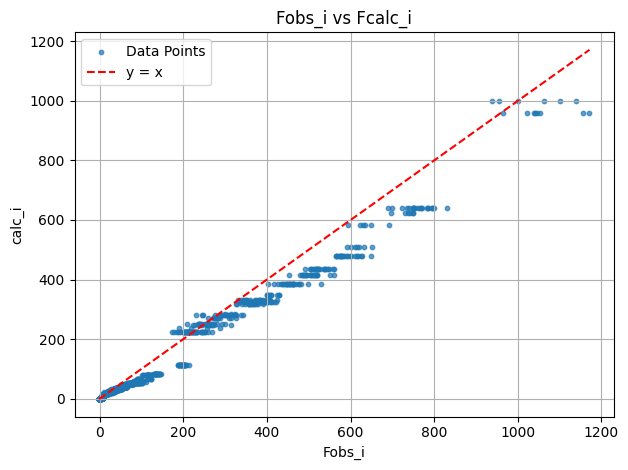

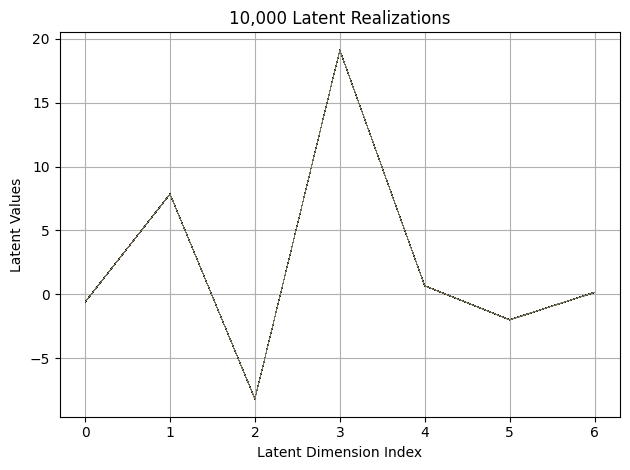

First 10 latent vectors from the VAE:
Sample 1: [-0.6189144253730774, 7.8517560958862305, -8.197454452514648, 19.123502731323242, 0.6805289387702942, -1.9876000881195068, 0.1633213460445404]
Sample 2: [-0.6033044457435608, 7.856783866882324, -8.207822799682617, 19.113245010375977, 0.6656194925308228, -2.005770683288574, 0.151546448469162]
Sample 3: [-0.6083844304084778, 7.853842258453369, -8.189356803894043, 19.119483947753906, 0.6826111078262329, -1.9829884767532349, 0.14503541588783264]
Sample 4: [-0.6040054559707642, 7.8440728187561035, -8.189611434936523, 19.12596893310547, 0.6701550483703613, -1.9973641633987427, 0.14740096032619476]
Sample 5: [-0.6060988903045654, 7.8506975173950195, -8.207345962524414, 19.131406784057617, 0.6636058688163757, -1.9961291551589966, 0.1407202184200287]
Sample 6: [-0.6062982082366943, 7.849153995513916, -8.20167064666748, 19.115177154541016, 0.6730329394340515, -1.9941774606704712, 0.14198020100593567]
Sample 7: [-0.6002868413925171, 7.85784530639648

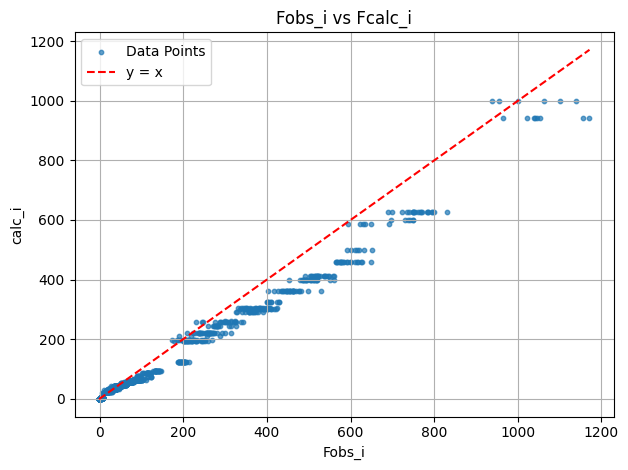

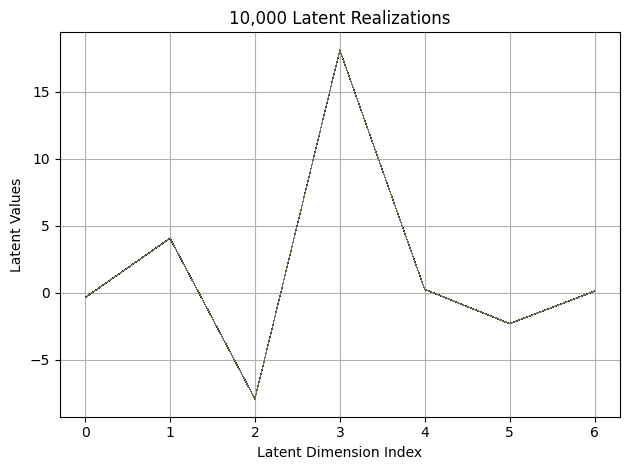

First 10 latent vectors from the VAE:
Sample 1: [-0.3563767075538635, 4.075021266937256, -7.928048133850098, 18.10563087463379, 0.25702065229415894, -2.3087759017944336, 0.1230798289179802]
Sample 2: [-0.3625282347202301, 4.075839996337891, -7.931710243225098, 18.12013053894043, 0.26131054759025574, -2.3012073040008545, 0.11683809012174606]
Sample 3: [-0.35664311051368713, 4.06189489364624, -7.937379360198975, 18.108631134033203, 0.2555810809135437, -2.3064560890197754, 0.12061415612697601]
Sample 4: [-0.3674163818359375, 4.067761421203613, -7.933126449584961, 18.11893653869629, 0.24939030408859253, -2.315375804901123, 0.12674102187156677]
Sample 5: [-0.3585375249385834, 4.0727996826171875, -7.930103778839111, 18.103429794311523, 0.24643893539905548, -2.300351858139038, 0.12711220979690552]
Sample 6: [-0.3616466224193573, 4.0772833824157715, -7.925869464874268, 18.11569595336914, 0.24350965023040771, -2.3127517700195312, 0.12399464100599289]
Sample 7: [-0.35290423035621643, 4.076711177

<Figure size 640x480 with 0 Axes>

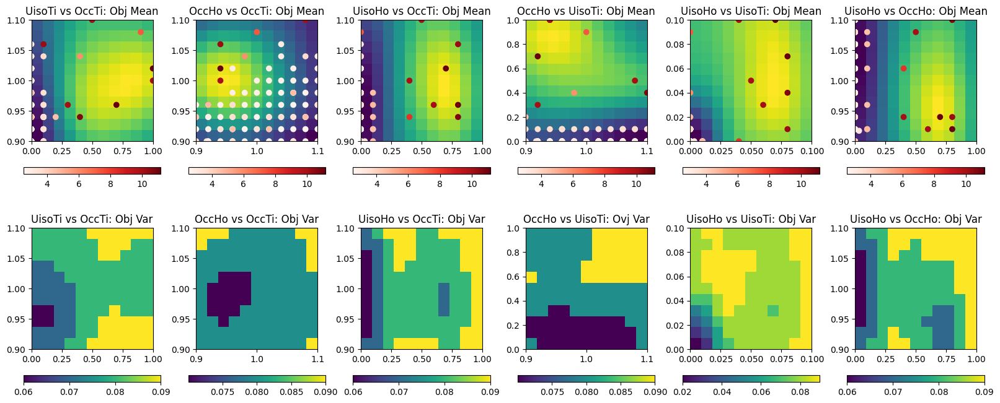

EI: [-1.          0.00556828  0.00459972 ...  0.0040008   0.00443415
  0.00478538]
Function eval #101
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [1.0199999809265137, 0.0, 1.0399999618530273, 0.0]
[0.421597, 0.920386, 0.008262, 0.00325]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.4470
initial chi^2 1.3941e+06 with 2596 obs.
New scale: 0.4454
Cycle 0: 0.60s, Chi**2: 3.7154e+05 for 2596 obs., Lambda: 0,  Delta: 0.733, SVD=0
New scale: 0.4454
Maximum shift/esd = -215.580 for all cycles
Read 

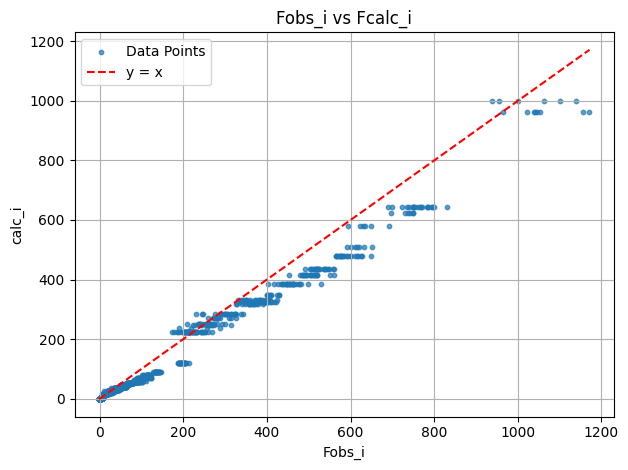

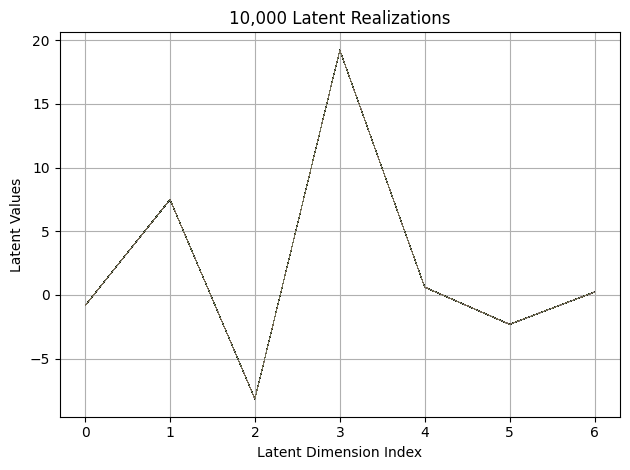

First 10 latent vectors from the VAE:
Sample 1: [-0.8393329381942749, 7.4821977615356445, -8.153766632080078, 19.216039657592773, 0.6086893081665039, -2.300734043121338, 0.2299434095621109]
Sample 2: [-0.8308125734329224, 7.491022109985352, -8.142776489257812, 19.220548629760742, 0.614299476146698, -2.3047451972961426, 0.22568966448307037]
Sample 3: [-0.8352894186973572, 7.490584850311279, -8.15993595123291, 19.211545944213867, 0.621059000492096, -2.3130648136138916, 0.2246229350566864]
Sample 4: [-0.8318790793418884, 7.498047828674316, -8.153877258300781, 19.203981399536133, 0.6105557084083557, -2.3109004497528076, 0.237241730093956]
Sample 5: [-0.8250482678413391, 7.499001979827881, -8.15075397491455, 19.22479248046875, 0.6044048070907593, -2.2969515323638916, 0.23530259728431702]
Sample 6: [-0.8395479321479797, 7.4915080070495605, -8.156074523925781, 19.215442657470703, 0.6198194026947021, -2.292996406555176, 0.24396316707134247]
Sample 7: [-0.8335273861885071, 7.490744590759277, -8

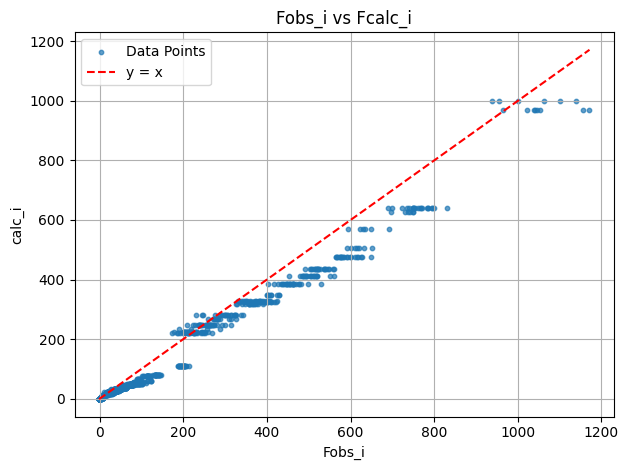

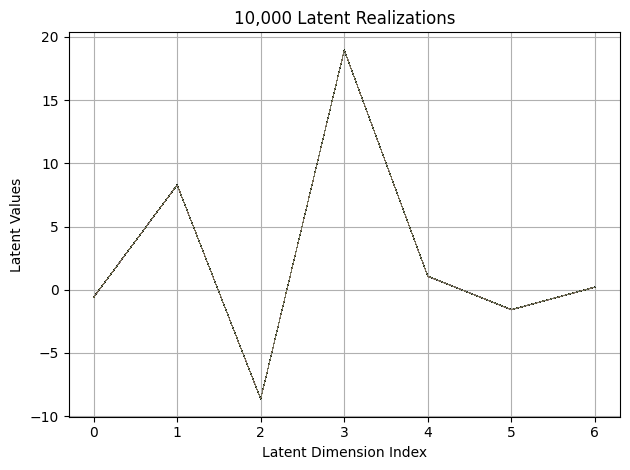

First 10 latent vectors from the VAE:
Sample 1: [-0.6006779074668884, 8.288199424743652, -8.64004135131836, 18.930641174316406, 1.0630089044570923, -1.5915093421936035, 0.2038462907075882]
Sample 2: [-0.5964597463607788, 8.291107177734375, -8.632596969604492, 18.950960159301758, 1.057712197303772, -1.5874441862106323, 0.21349574625492096]
Sample 3: [-0.5933949947357178, 8.278084754943848, -8.623804092407227, 18.949430465698242, 1.067743182182312, -1.5833274126052856, 0.20076218247413635]
Sample 4: [-0.5876666307449341, 8.282939910888672, -8.623743057250977, 18.945404052734375, 1.0474096536636353, -1.5806502103805542, 0.20714017748832703]
Sample 5: [-0.6021344065666199, 8.297832489013672, -8.629469871520996, 18.93956184387207, 1.0532697439193726, -1.57508385181427, 0.2068489044904709]
Sample 6: [-0.5933335423469543, 8.28762149810791, -8.642853736877441, 18.935850143432617, 1.0589264631271362, -1.5786433219909668, 0.2042822241783142]
Sample 7: [-0.5909639596939087, 8.284663200378418, -8.

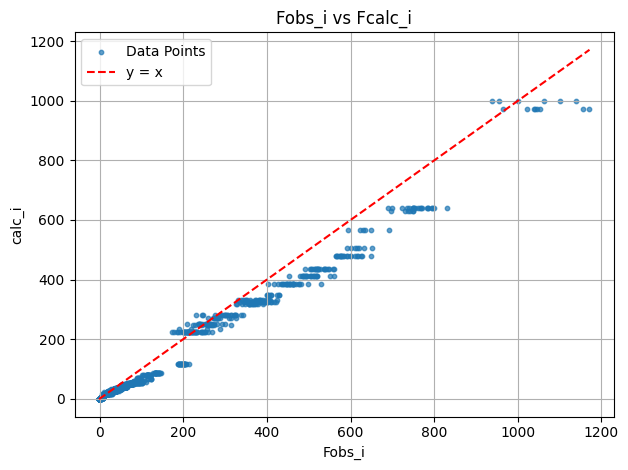

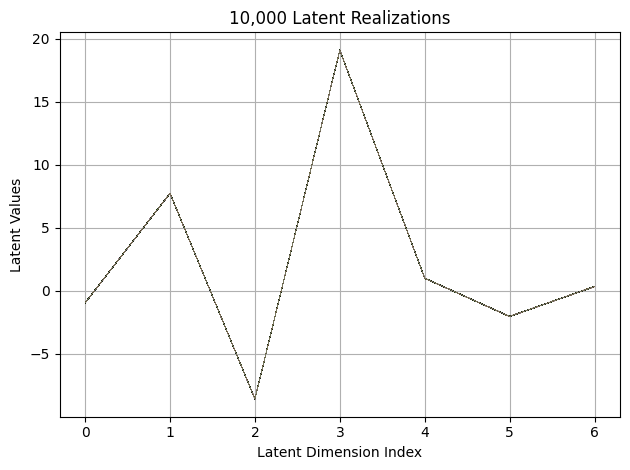

First 10 latent vectors from the VAE:
Sample 1: [-0.9527558088302612, 7.732481479644775, -8.584300994873047, 19.090118408203125, 0.9849650859832764, -2.0292842388153076, 0.32573792338371277]
Sample 2: [-0.9621710181236267, 7.7219157218933105, -8.590149879455566, 19.084688186645508, 0.995097279548645, -2.0399224758148193, 0.32905030250549316]
Sample 3: [-0.9603002667427063, 7.73065710067749, -8.587913513183594, 19.09862518310547, 0.9919631481170654, -2.045792579650879, 0.3387388288974762]
Sample 4: [-0.9697819948196411, 7.729157447814941, -8.589162826538086, 19.089815139770508, 0.9795864820480347, -2.0498549938201904, 0.3382253050804138]
Sample 5: [-0.9831632971763611, 7.725978851318359, -8.589842796325684, 19.106733322143555, 0.9846514463424683, -2.0436975955963135, 0.3520938754081726]
Sample 6: [-0.9597619771957397, 7.729726314544678, -8.592345237731934, 19.103158950805664, 0.9915426969528198, -2.0414044857025146, 0.34252142906188965]
Sample 7: [-0.9673307538032532, 7.71815299987793, 

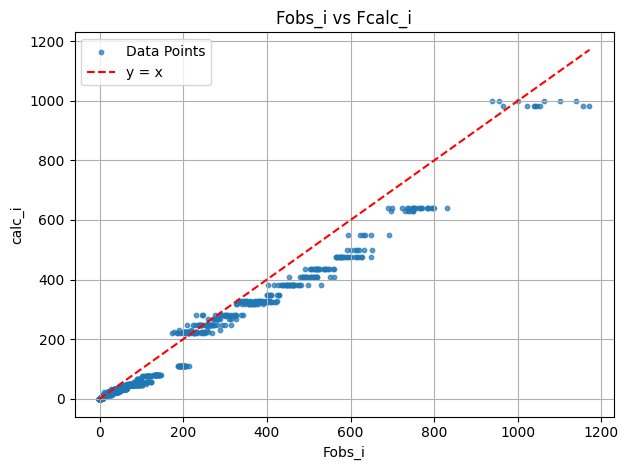

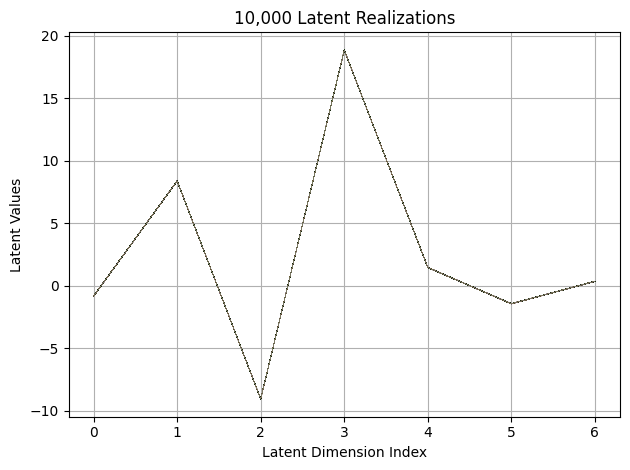

First 10 latent vectors from the VAE:
Sample 1: [-0.8410518765449524, 8.388311386108398, -9.062610626220703, 18.86016845703125, 1.4471851587295532, -1.4551693201065063, 0.3503929376602173]
Sample 2: [-0.8325850963592529, 8.384868621826172, -9.069662094116211, 18.86323356628418, 1.4448130130767822, -1.455595850944519, 0.3468747138977051]
Sample 3: [-0.8430827856063843, 8.376588821411133, -9.060018539428711, 18.863128662109375, 1.4486171007156372, -1.4435425996780396, 0.335272878408432]
Sample 4: [-0.8415144681930542, 8.381599426269531, -9.07719612121582, 18.85544776916504, 1.4600554704666138, -1.4430598020553589, 0.349439799785614]
Sample 5: [-0.8473505973815918, 8.38235092163086, -9.073179244995117, 18.850940704345703, 1.4468203783035278, -1.4520816802978516, 0.3369019627571106]
Sample 6: [-0.8517404198646545, 8.389395713806152, -9.069448471069336, 18.85702896118164, 1.4630337953567505, -1.4462090730667114, 0.3399806320667267]
Sample 7: [-0.8259408473968506, 8.3860445022583, -9.0725078

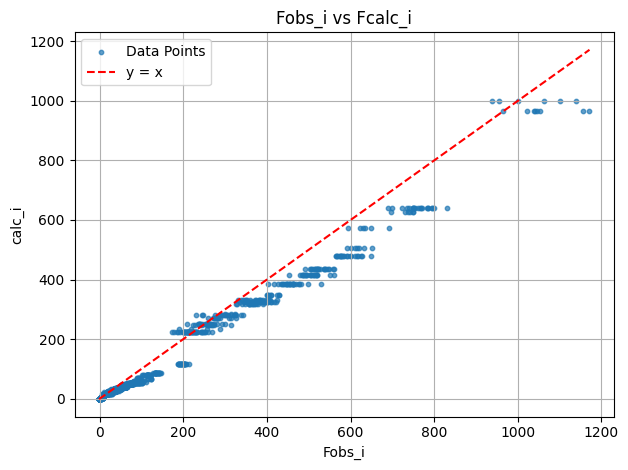

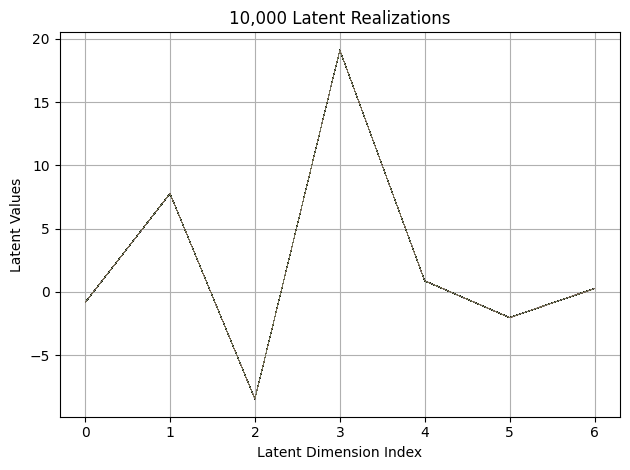

First 10 latent vectors from the VAE:
Sample 1: [-0.8294888734817505, 7.773349761962891, -8.457669258117676, 19.10755157470703, 0.8810214996337891, -2.0325658321380615, 0.2703148126602173]
Sample 2: [-0.84187912940979, 7.766151428222656, -8.451725006103516, 19.09264373779297, 0.8890819549560547, -2.020620346069336, 0.28764060139656067]
Sample 3: [-0.837108850479126, 7.772115230560303, -8.444562911987305, 19.113536834716797, 0.8759148716926575, -2.0263285636901855, 0.2632661759853363]
Sample 4: [-0.836857259273529, 7.766145706176758, -8.452384948730469, 19.113508224487305, 0.8988843560218811, -2.0239484310150146, 0.2778664827346802]
Sample 5: [-0.8365285396575928, 7.777031421661377, -8.469696998596191, 19.098690032958984, 0.875091552734375, -2.0305299758911133, 0.27926743030548096]
Sample 6: [-0.8272382020950317, 7.781507968902588, -8.447029113769531, 19.10621452331543, 0.883545994758606, -2.028515338897705, 0.255573034286499]
Sample 7: [-0.8479905724525452, 7.777764797210693, -8.467601

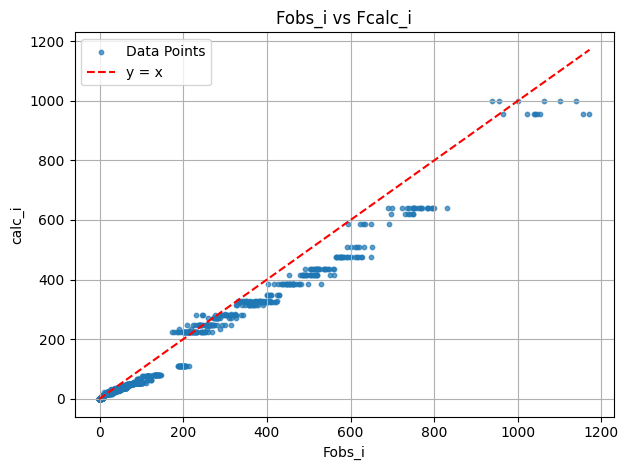

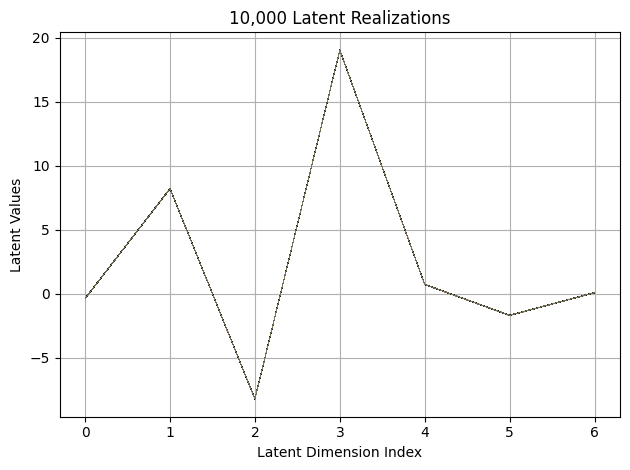

First 10 latent vectors from the VAE:
Sample 1: [-0.38326671719551086, 8.205615997314453, -8.225282669067383, 19.01886558532715, 0.7244160175323486, -1.694658875465393, 0.056291282176971436]
Sample 2: [-0.3713780641555786, 8.199743270874023, -8.232902526855469, 19.02617835998535, 0.7077450156211853, -1.7030411958694458, 0.08012250065803528]
Sample 3: [-0.37554657459259033, 8.208256721496582, -8.229345321655273, 19.030118942260742, 0.7147054672241211, -1.7040497064590454, 0.07960939407348633]
Sample 4: [-0.37780138850212097, 8.200468063354492, -8.23017406463623, 19.024246215820312, 0.7128430604934692, -1.6960045099258423, 0.06849179416894913]
Sample 5: [-0.380331426858902, 8.192513465881348, -8.22764778137207, 19.020959854125977, 0.7141708135604858, -1.7075718641281128, 0.0671117752790451]
Sample 6: [-0.36775457859039307, 8.199103355407715, -8.229063034057617, 19.024248123168945, 0.7207750678062439, -1.697726845741272, 0.0706818625330925]
Sample 7: [-0.3898528218269348, 8.21074771881103

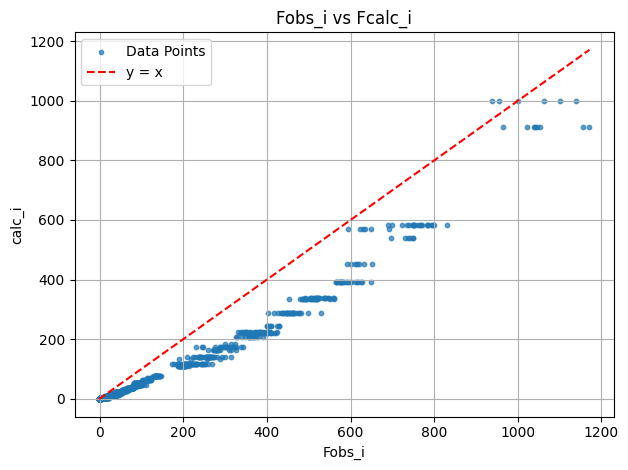

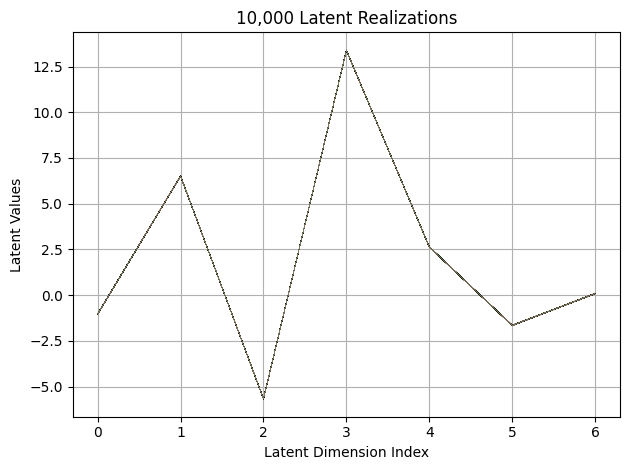

First 10 latent vectors from the VAE:
Sample 1: [-1.0215890407562256, 6.515280723571777, -5.660721302032471, 13.382159233093262, 2.6378185749053955, -1.6523665189743042, 0.09212174266576767]
Sample 2: [-1.0194555521011353, 6.505900859832764, -5.661017894744873, 13.386434555053711, 2.636660575866699, -1.6649929285049438, 0.09277864545583725]
Sample 3: [-1.028720498085022, 6.500755786895752, -5.662961006164551, 13.387137413024902, 2.621234893798828, -1.6446806192398071, 0.08343715220689774]
Sample 4: [-1.027650237083435, 6.500805377960205, -5.663069248199463, 13.380661964416504, 2.6464500427246094, -1.6433415412902832, 0.08715107291936874]
Sample 5: [-1.0215409994125366, 6.510818958282471, -5.6699981689453125, 13.376786231994629, 2.635867118835449, -1.6598604917526245, 0.07815515995025635]
Sample 6: [-1.019109845161438, 6.515835285186768, -5.6639628410339355, 13.379549026489258, 2.6321463584899902, -1.6490271091461182, 0.07615269720554352]
Sample 7: [-1.027753472328186, 6.514116764068603

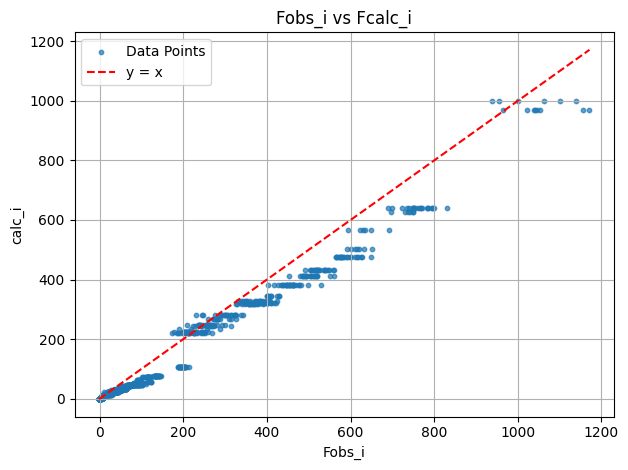

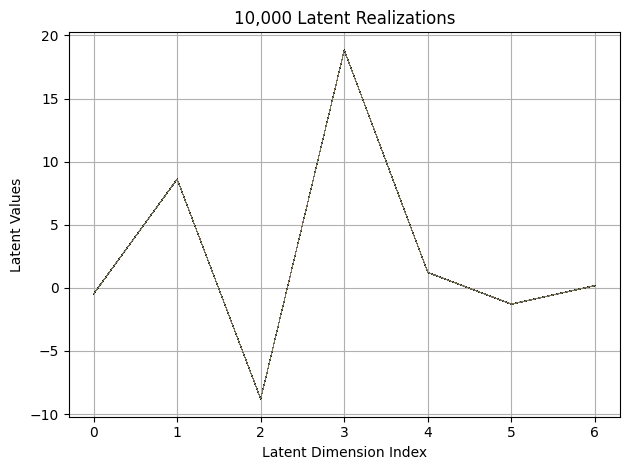

First 10 latent vectors from the VAE:
Sample 1: [-0.48174217343330383, 8.619966506958008, -8.780350685119629, 18.851146697998047, 1.2160886526107788, -1.2958139181137085, 0.1754274070262909]
Sample 2: [-0.48624709248542786, 8.617535591125488, -8.802760124206543, 18.830461502075195, 1.2176626920700073, -1.2804498672485352, 0.17196215689182281]
Sample 3: [-0.4834948778152466, 8.619930267333984, -8.801956176757812, 18.829845428466797, 1.2134793996810913, -1.283311128616333, 0.18558017909526825]
Sample 4: [-0.48787063360214233, 8.608641624450684, -8.810087203979492, 18.829137802124023, 1.2222981452941895, -1.2874302864074707, 0.15377849340438843]
Sample 5: [-0.48784738779067993, 8.613531112670898, -8.799710273742676, 18.851131439208984, 1.2150636911392212, -1.2887790203094482, 0.17468231916427612]
Sample 6: [-0.48008403182029724, 8.631976127624512, -8.806931495666504, 18.822364807128906, 1.2191799879074097, -1.2881083488464355, 0.16379748284816742]
Sample 7: [-0.4792385399341583, 8.6174621

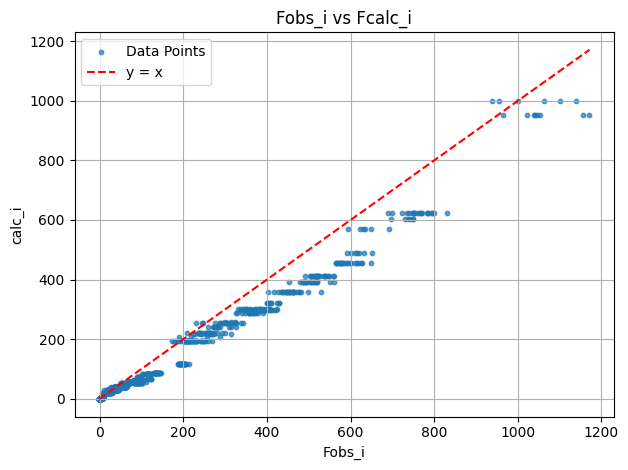

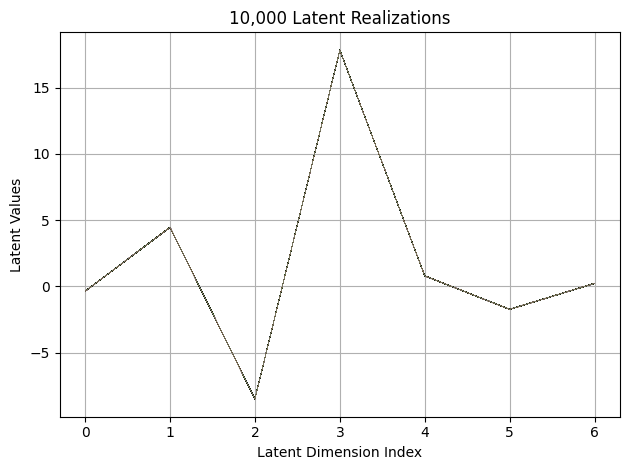

First 10 latent vectors from the VAE:
Sample 1: [-0.3591310977935791, 4.4579758644104, -8.494071006774902, 17.830379486083984, 0.8012894988059998, -1.738965630531311, 0.217466339468956]
Sample 2: [-0.3665504455566406, 4.464436054229736, -8.477653503417969, 17.827959060668945, 0.778374433517456, -1.7284122705459595, 0.22338618338108063]
Sample 3: [-0.3532200753688812, 4.457351207733154, -8.494829177856445, 17.838237762451172, 0.7925296425819397, -1.7353355884552002, 0.22296595573425293]
Sample 4: [-0.3551483750343323, 4.454379558563232, -8.484759330749512, 17.82905387878418, 0.8037267327308655, -1.7328599691390991, 0.23072069883346558]
Sample 5: [-0.36353540420532227, 4.465213775634766, -8.476500511169434, 17.83161163330078, 0.7877986431121826, -1.7400364875793457, 0.2146420031785965]
Sample 6: [-0.3732946515083313, 4.46872615814209, -8.508962631225586, 17.833091735839844, 0.8067895770072937, -1.7295082807540894, 0.23064099252223969]
Sample 7: [-0.36354225873947144, 4.4513726234436035, 

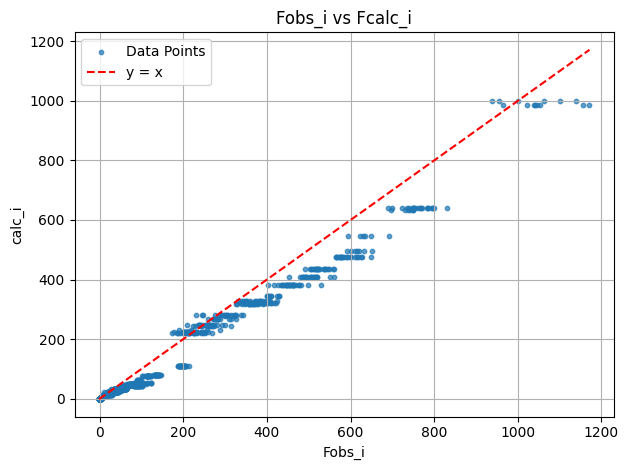

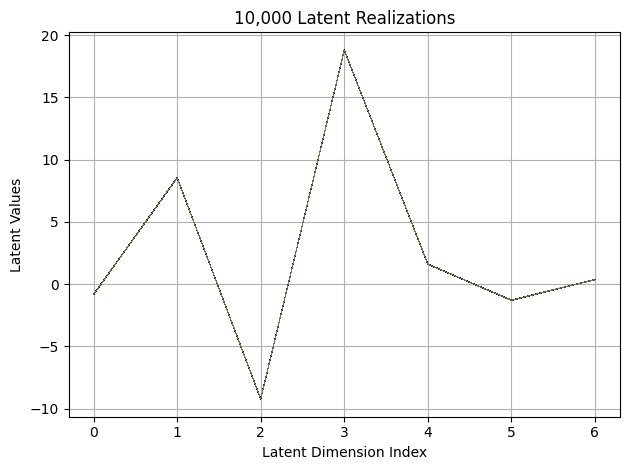

First 10 latent vectors from the VAE:
Sample 1: [-0.8309586644172668, 8.54214096069336, -9.223835945129395, 18.793249130249023, 1.5957233905792236, -1.3039700984954834, 0.3614429533481598]
Sample 2: [-0.8379984498023987, 8.546600341796875, -9.225736618041992, 18.7938175201416, 1.5944993495941162, -1.299218773841858, 0.3674052357673645]
Sample 3: [-0.846671998500824, 8.543322563171387, -9.22268009185791, 18.799455642700195, 1.594813585281372, -1.2988204956054688, 0.3707689940929413]
Sample 4: [-0.8339843153953552, 8.542104721069336, -9.23913288116455, 18.799875259399414, 1.58768892288208, -1.287765622138977, 0.3651384711265564]
Sample 5: [-0.8419923186302185, 8.53570556640625, -9.232643127441406, 18.79598045349121, 1.5934998989105225, -1.2919104099273682, 0.3593207597732544]
Sample 6: [-0.8310716152191162, 8.542984962463379, -9.235297203063965, 18.799137115478516, 1.5940748453140259, -1.3085260391235352, 0.36293986439704895]
Sample 7: [-0.8422762751579285, 8.543135643005371, -9.23161411

<Figure size 640x480 with 0 Axes>

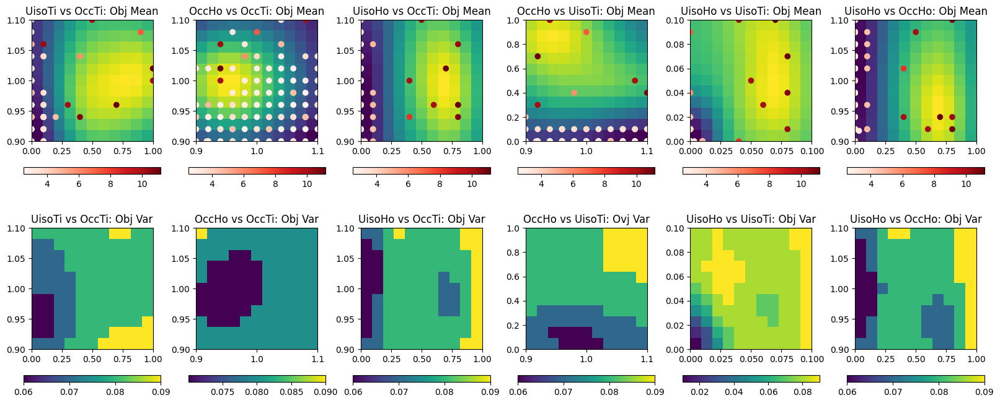

EI: [-1.          0.00538656  0.00460643 ...  0.00427563  0.00475099
  0.0051443 ]
Function eval #111
Directory 'C:\Users\USER\PhD\IAMM PROJECT\BO/Task_4-21-2025/gpx' already exists.
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\HTO_original.cif read by Reader CIF
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
C:\Users\USER\PhD\IAMM PROJECT\BO\GSAS Data\HTO_xray\which_hkl1\cleaned_xtal1_110K.hkl read by Reader Shelx HKLF 4 F²
X: [1.0, 0.0, 0.9599999785423279, 0.0]
[0.421597, 0.920386, 0.008262, 0.00325]
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
gpx file saved as C:\Users\USER\PhD\IAMM PROJECT\BO\Task_4-21-2025\gpx\0.gpx
 Hessian Levenberg-Marquardt SVD refinement on 1 variables:
New scale: 0.5193
initial chi^2 7.676e+05 with 2596 obs.
New scale: 0.5180
Cycle 0: 0.61s, Chi**2: 2.943e+05 for 2596 obs., Lambda: 0,  Delta: 0.617, SVD=0
New scale: 0.5180
Maximum shift/esd = -156.427 for all cycles
Read from file:C:\User

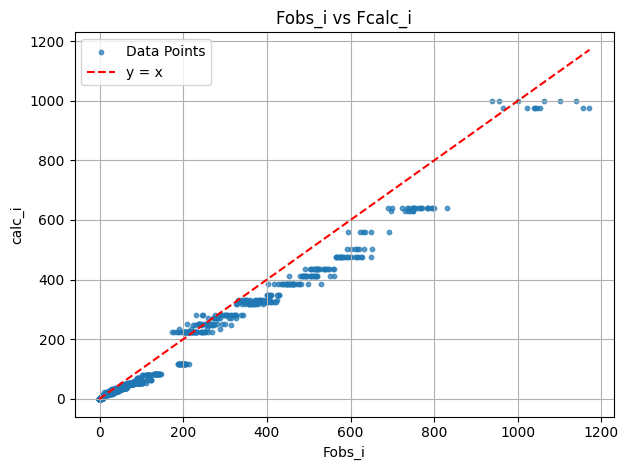

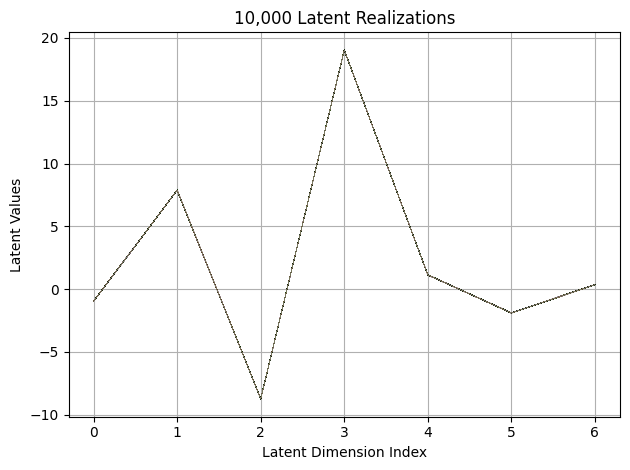

First 10 latent vectors from the VAE:
Sample 1: [-0.9792060852050781, 7.870096206665039, -8.7369966506958, 19.025447845458984, 1.1285121440887451, -1.8974164724349976, 0.341947078704834]
Sample 2: [-0.9563546180725098, 7.888519763946533, -8.7285737991333, 19.027719497680664, 1.1438255310058594, -1.8944002389907837, 0.35621723532676697]
Sample 3: [-0.9721049070358276, 7.882898330688477, -8.746671676635742, 19.024873733520508, 1.1332297325134277, -1.8968844413757324, 0.34747493267059326]
Sample 4: [-0.968917965888977, 7.876798629760742, -8.744972229003906, 19.04189682006836, 1.1333931684494019, -1.9081546068191528, 0.3517775535583496]
Sample 5: [-0.9764043688774109, 7.877181053161621, -8.747753143310547, 19.02577781677246, 1.138225793838501, -1.8971723318099976, 0.3498844504356384]
Sample 6: [-0.9700367450714111, 7.890043258666992, -8.743443489074707, 19.028820037841797, 1.134151577949524, -1.9042736291885376, 0.3439469635486603]
Sample 7: [-0.9626906514167786, 7.875376224517822, -8.7385

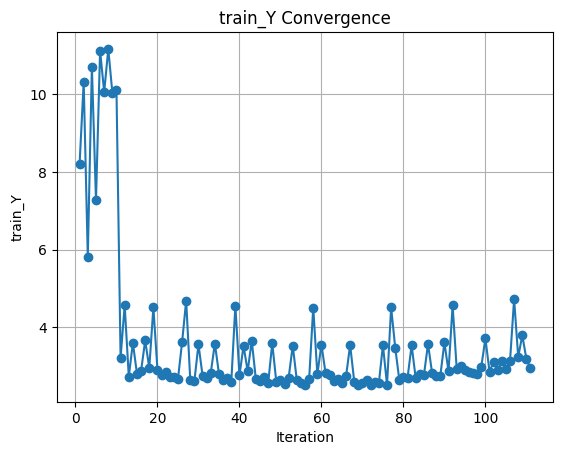

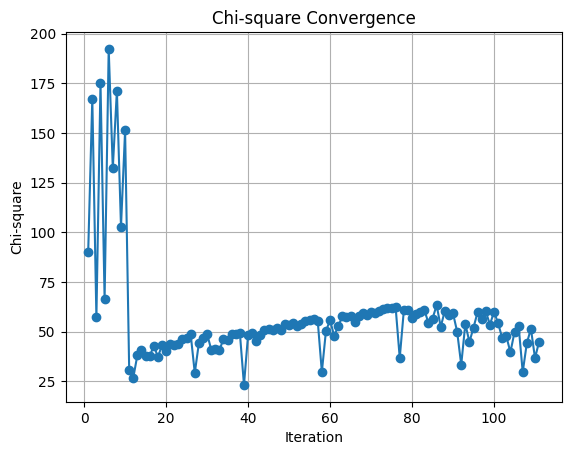

#########################################################
Current best solutions at iteration:100
Best params among evaluated samples:
tensor([[0.9000, 0.0000, 1.0600, 0.0000]]) tensor(2.5200)
Best params from GP map:
tensor([[0.9400, 0.0000, 1.0400, 0.0000]]) tensor(2.6600)


<Figure size 640x480 with 0 Axes>

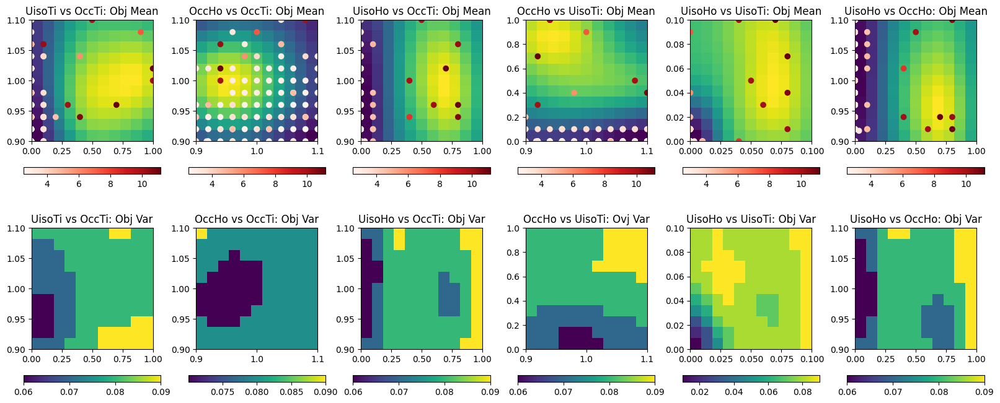

In [ ]:
#Initialize for BO
num_start = 10  # Starting samples
N = 100 # Total BO iteration

#Define parameter space
x1 = torch.linspace(0.9, 1.1, 11) #OccTi
x2 = torch.linspace(0, 0.1, 11) #UTi
x3 = torch.linspace(0.9, 1.1, 11) #OccHo
x4 = torch.linspace(0, 0.1, 11) #UHo
X = [x1, x2, x3, x4]

# GSAS arrays
Fobs = []
Fcalc = []
iteration = 0

#Fixed parameters of experimental setup

# To change what parameters are varied, edit the gsas.py script
fix_params = [
    0.421597, # xO1
    0.920386, # OccO2
    0.008262, # UO1
    0.00325 #UO2
    ]

#BO
X_opt, X_opt_GP, train_X, train_Y, train_chisq, y_pred_means, y_pred_vars = BO_SpinIce(X, fix_params, num_start, N)
#print(X)